# Import Packages

In [1]:
# importing all the necessary packages
import pandas as pd # Dataframe package
import matplotlib.pyplot as plt # Plotting package
import numpy as np # Numerical computation package
import seaborn as sns # Plotting package
from sklearn.neural_network import MLPRegressor # neural network 
from sklearn.ensemble import RandomForestRegressor # Random Forest estimator
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import r2_score, mean_absolute_error
from PIL import Image
from datetime import date, timedelta
from datetime import datetime

np.random.seed(1) # Set the random seed so that the results stay the same

# import xgboost as xgb

# #import lightgbm
# import xgboost as xgb
# from xgboost import XGBRegressor

# #import lightgbm
# import xgboost as xgb
# from xgboost import XGBRegressor
# from hyperopt import hp

# from hyperopt import fmin, tpe, STATUS_OK, STATUS_FAIL, Trials
# from sklearn.metrics import accuracy_score 

# from hyperopt import fmin, tpe, STATUS_OK, STATUS_FAIL, Trials
# from sklearn.metrics import accuracy_score 
# from hyperopt import fmin, tpe, STATUS_OK, STATUS_FAIL, Trials


# import lightgbm as lgb
# from lightgbm import LGBMRegressor

# from flaml import AutoML
# from flaml.ml import sklearn_metric_loss_score #valuation of the results

# #import
# from PIL import Image
# from hyperopt import hp

# import numpy as np
# import xgboost as xgb
# from sklearn.model_selection import RandomizedSearchCV


# sns.set(style="darkgrid")

# Data cleaning

In [2]:
# Import the pedestriant data, national holidays and school holidays
ped = pd.read_csv("data/pedestrian_cologne-20180430-20200131-hour.csv", sep = ";")
holi = pd.read_csv("data/national_holidays_2018.01.01_2020.01.31.csv", sep = ";")
school_holi = pd.read_csv("data/school_holidays_17-18_19-20.csv", sep = ";")

# Splitting up the time of measurement into date and time
ped[["date", "time"]] = ped["time of measurement"].str.split(" ", n=1, expand=True)
# Drop the time of measurement, because it is split now and drop location
ped = ped.drop(["time of measurement", "location"], axis=1)
#Drop all columns with nan (Incidents are the only one)
ped.dropna(how='all', axis=1, inplace=True)
# Restructure by date and time in the first columns
ped = ped[ ["date", "time"] + [ col for col in ped.columns if col != "date" and col!= "time"] ]
# Clear time from the minute variation
ped["time"] = ped["time"].str.slice_replace(8, 16)


# Change the column name in the holiday df to holiday to recognise it later in the merged frame
holi = holi.rename(columns={"name": "holiday"})
# Merge the two dataframes on the pedestriant data
ped = pd.merge(ped, holi, how = "left")


# Put hollyday as 1 and no holyday as 0
ped["holiday"] = ped["holiday"].fillna(0)
ped["holiday"] = ped["holiday"].where(ped["holiday"] == 0, 1)

ped[ped.isnull().any(axis=1)].shape
# See where the data are missing
print(f"There are {len(ped[ped.isnull().any(axis=1)])} rows with missing data")
#
# Printing result: There are 27 rows with missing data
#
# Because the data for temperature and weather condition are both missing, those 27 rows can be dropped, due to the huge sample size
ped.dropna(inplace=True)


# Create a list to store all dataframes with the seperate school holidays, because the sheet only lists the first and last date
days_df_list = []
# Create a dataframe with all dates for each school holiday
for i in range(school_holi.shape[0]):
    # Get the start and enddate from the holidays
    start_date = datetime.strptime(school_holi["ErsterTagDate"][i], "%d.%m.%Y").date()
    end_date = datetime.strptime(school_holi["LetzterTagDate"][i], "%d.%m.%Y").date()
    # Create dataframes out of the range of those dates and append to the list
    delta = end_date - start_date
    days = [start_date + timedelta(days=n) for n in range(delta.days + 1)]
    days_df = pd.DataFrame (days, columns = ['date'])
    days_df_list.append(days_df)

# Create one single dataframe out of the list and add value 1 for a holiday
new_holi = pd.concat(days_df_list).reset_index(drop=True)
new_holi["school holiday"] = 1
# Change the formate of the date to a string for the merge
new_holi["date"] = new_holi["date"].astype(str)
# Merg of the two frames and fill the empty school holiday flieds with a 0
ped = pd.merge(ped, new_holi, how = "left", on="date")
ped["school holiday"] = ped["school holiday"].fillna(0)

# Change the float to integers
ped["school holiday"] = np.int64(ped["school holiday"].astype(int))


#Get Column with months
ped["months"] = ped["date"].str.slice(5, 7)
#Transform time to hours
ped["hour"] = ped["time"].str.slice(0, 2)


# Save this dataframe for the API without dummies to create them later manually
ped.to_csv("data/data_clean_without_dummies.csv", sep = ";")


# Get dummies for the weekdays, the weatherconditions, the months and the hours
ped = pd.get_dummies(ped, columns=["weekday", "weather condition", "months", "hour"])

# Standardize the temperature column for PCA
standardize = lambda x: (x - x.mean()) / x.std()
ped["temperature in ºc"] = standardize(ped["temperature in ºc"])
# Safe all features to calculate the cpa
features = ped.columns[3:] # Features
# Create new column names for the PCA
principal_components = [f"PC{i+1}" for i in range(len(features))]
# Run PCA on our data and safe them in the new columns
pca = PCA(n_components=len(features))
ped[principal_components] = pca.fit_transform(ped[features])


# Calculate the threshold  to get a 99%  mean explained variance and print the result
threshhold = 0.99
pca_n = np.argmax(pca.explained_variance_ratio_.cumsum() >= threshhold)
print(f"There are needed {pca_n} columns to preserve a {threshhold} mean explained variance")
#
# Printing result: There are needed 46 columns to preserve a 0.99 mean explained variance
#

# Save prepeared data
ped.to_csv("data/data_clean_with_dummies.csv")

There are 27 rows with missing data
There are needed 46 columns to preserve a 0.99 mean explained variance


# For all Models

In [3]:
# Importing the data and splitting it into a train and test set to work with
ped = pd.read_csv("data/data_clean_with_dummies.csv", index_col=0)

# Define a new X with the squared feature k = 0.99, 57+46
X = np.array(ped[ped.columns[57:103]])

# Output to predict
y = ped["pedestrians count"]

# Split the dataset into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(
    X, y, test_size=0.3, random_state=72)

# Functions

In [6]:
# Defining a function to plot the different features vs the pedestrians count
def visualize_data(feature):
    fig, axs = plt.subplots(figsize=(12, 8))
    sns.boxplot(data=df_visual, y="pedestrians count", x=feature, palette="muted", showmeans=True,  
    meanprops={"marker":"o", "markerfacecolor":"white", "markeredgecolor":"black","markersize":"5"})

    axs.set_title(f"Pedestrian count per {feature} - Boxplot over the entire time")
    axs.legend(handles=[(plt.Line2D([], [], marker="o", color="white", markeredgecolor="black", linewidth=0, label="mean"))])
    
    fig.savefig(f"plots/visualization_{feature}.png")

    plt.show()

# Defining a function to plot the different features vs the pedestrians count with a filter
def visualize_data_holiday_filter(feature, filter):
    fig, axs = plt.subplots(figsize=(12,8))
    sns.boxplot(data=df_visual, x="weekday", y="pedestrians count", palette="muted", hue=filter, showmeans=True,
    meanprops={"marker":"o", "markerfacecolor":"white", "markeredgecolor":"black","markersize":"5"})

    axs.set_title(f'Pedestrian count per day divided into non-{filter} (0) and {filter} (1) - Boxplot over the entire time')
    axs.legend()

    fig.savefig(f"plots/visualization_{feature}_{filter}.png")

    plt.show()


# Define a function to create figure frome saved pictures (from the backup)
def show_images_visualization(parameter_list):
    fig = plt.figure(figsize=(16, 8*len(parameter_list)))
    
    # Set the row and column number
    columns = 1
    rows = (len(parameter_list))
    
    # Go throug all parameters of the model
    i = 1
    for feature in parameter_list:
        # Reading images
        img = Image.open(f"plots_backup/visualization_{feature}.png")
        # Adds a subplot at the i position
        fig.add_subplot(rows, columns, i)
        i += 1
        # Showing the Image
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{feature}")




# creating a dataframe to safe all results of mae and r2
comparison = pd.DataFrame(columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
# defining a function to fit the scenario and evaluate it (scaled)
def scenario_fit_evaluate_scaled(model, display_name, scenario, traindataX_sc, traindatay_sc, testdataX_sc, testdatay_sc):
    global comparison
    # Fit the network to the scaled train data
    scenario.fit(traindataX_sc, traindatay_sc)

    # Make predictions
    ypred_train_scaled = scenario.predict(traindataX_sc)
    ypred_scaled = scenario.predict(testdataX_sc)

    # Reconstruct outputs and scale back predictions
    ytest = testdatay_sc * sigma + mu
    ytrain = traindatay_sc * sigma + mu
    ypred_train = ypred_train_scaled * sigma + mu
    ypred = ypred_scaled * sigma + mu
    # the network predicts negative values because it is not possible to put an activation function on the output layer
    # MLPRegressor uses the activation function only on the hidden layers
    # Negative Values make no sense in our case, therefore we fix it and tell the network that all negative values
    # should equal to zero
    ypred[ypred < 0] = 0

    # Compute the MAE
    mae_train = mean_absolute_error(ytrain, ypred_train)
    mae_test = mean_absolute_error(ytest, ypred)
    # Comute R^2
    r2_train = r2_score(ytrain, ypred_train)
    r2_test = r2_score(ytest, ypred)

    # adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("outputs/comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)

# Defining a function to fit the scenario and evaluate it (not scaled)
def scenario_fit_evaluate(model, display_name, scenario, traindataX, traindatay, testdataX, testdatay):
    global comparison
    # Fit the Model to the train data
    scenario.fit(traindataX, traindatay)

    # Make predictions
    ypred_train = scenario.predict(traindataX)
    ypred = scenario.predict(testdataX)

    # Compute the MAE
    mae_train = mean_absolute_error(traindatay, ypred_train)
    mae_test = mean_absolute_error(testdatay, ypred)
    # Comute R^2
    r2_train = r2_score(traindatay, ypred_train)
    r2_test = r2_score(testdatay, ypred)

    # Adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # Merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("outputs/comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)

# Defining a function to fit the scenario and evaluate it (modified for LGBM)
def scenario_fit_evaluate_python_api(model, display_name, scenario, traindataX, traindatay, testdataX, testdatay):
    global comparison

    #transform the datasets into lgbm-matrix
    d_train = lgb.Dataset(traindataX, label = traindatay)

    # Fit the Model to the train data
    scenario = lgb.train(lgbm_params, d_train, 500)

    # Make predictions
    ypred_train = scenario.predict(traindataX)
    ypred = scenario.predict(testdataX)

    # Negative Values make no sense in our case, therefore we fix it and tell the network that all negative values
    # should equal to zero
    ypred = np.array(ypred)
    ypred[ypred < 0] = 0

    # Compute the MAE
    mae_train = mean_absolute_error(traindatay, ypred_train)
    mae_test = mean_absolute_error(testdatay, ypred)
    # Comute R^2
    r2_train = r2_score(traindatay, ypred_train)
    r2_test = r2_score(testdatay, ypred)

    # Adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # Merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("outputs/comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)

# Defining a function to fit the scenario and evaluate it (no negative but otherwise like the normal one)
def scenario_fit_evaluate_lgbmreg(model, display_name, scenario, traindataX, traindatay, testdataX, testdatay):
    global comparison
    # Fit the Model to the train data
    scenario.fit(traindataX, traindatay)

    # Make predictions
    ypred_train = scenario.predict(traindataX)
    ypred = scenario.predict(testdataX)

    # Negative Values make no sense in our case, therefore we fix it and tell the network that all negative values
    # should equal to zero
    ypred = np.array(ypred)
    ypred[ypred < 0] = 0

    # Compute the MAE
    mae_train = mean_absolute_error(traindatay, ypred_train)
    mae_test = mean_absolute_error(testdatay, ypred)
    # Comute R^2
    r2_train = r2_score(traindatay, ypred_train)
    r2_test = r2_score(testdatay, ypred)

    # Adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # Merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("outputs/comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)

# Defining a function to fit the scenario and evaluate it (no neg for xgb)
def scenario_fit_evaluate_python_api_xgb(model, display_name, scenario, traindataX, traindatay, testdataX, testdatay):
    global comparison

    #transform the datasets into lgbm-matrix
    d_train = xgb.DMatrix(traindataX, label = traindatay)

    # Fit the Model to the train data
    scenario = xgb.train(xgb_params, d_train, 500)

    # Make predictions
    dtrain = xgb.DMatrix(traindataX)
    ypred_train = scenario.predict(dtrain)
    dtest = xgb.DMatrix(testdataX)
    ypred = scenario.predict(dtest)

    # Negative Values make no sense in our case, therefore we fix it and tell the network that all negative values
    # should equal to zero
    ypred = np.array(ypred)
    ypred[ypred < 0] = 0


    # Compute the MAE
    mae_train = mean_absolute_error(traindatay, ypred_train)
    mae_test = mean_absolute_error(testdatay, ypred)
    # Comute R^2
    r2_train = r2_score(traindatay, ypred_train)
    r2_test = r2_score(testdatay, ypred)

    # Adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # Merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("outputs/comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)

# Defining a function to fit the scenario and evaluate it (no neg for xgb)
def scenario_fit_evaluate_regressor(model, display_name, scenario, traindataX, traindatay, testdataX, testdatay):
    global comparison
    # Fit the Model to the train data
    scenario.fit(traindataX, traindatay)

    # Make predictions
    ypred_train = scenario.predict(traindataX)
    ypred = scenario.predict(testdataX)

    # Negative Values make no sense in our case, therefore we fix it and tell the network that all negative values
    # should equal to zero
    ypred = np.array(ypred)
    ypred[ypred < 0] = 0
    
    # Compute the MAE
    mae_train = mean_absolute_error(traindatay, ypred_train)
    mae_test = mean_absolute_error(testdatay, ypred)
    # Comute R^2
    r2_train = r2_score(traindatay, ypred_train)
    r2_test = r2_score(testdatay, ypred)

    # Adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # Merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("outputs/comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)

# Defining a function to fit the scenario and evaluate it (Tenserflow)
def scenario_evaluate_tensor(model, display_name, scenario, traindataX, traindatay, testdataX, testdatay):
    global comparison

    # Evaluate the model on the test data using `evaluate`. Results are the corresponding loss functin (MAE), MAE and R-squared (Metrics defined in the model configuration)
    results = scenario.evaluate(testdataX, testdatay)
    results_train = scenario.evaluate(traindataX, traindatay)  

    # Compute the MAE
    mae_train = results_train[0] #First element is the loss function, Mean average error (it is the same as the second element of the list --> also mae from metrics)
    mae_test = results[0] #First element is the loss function, Mean average error (it is the same as the second element of the list --> also mae from metrics)
    # Compute R^2
    r2_train = results_train[2]
    r2_test = results[2]

    # Adding the calculated reults to the dataframe
    row = pd.DataFrame(data=[[model, display_name,  mae_train, mae_test, r2_train, r2_test]],
    columns=["Model", "Scenario", "MAE_train", "MAE_test", "R2_train", "R2_test"])
    comparison = pd.concat([comparison, row])
    # Merging results into dataframe and safe it as csv to add things later
    comparison = comparison.reset_index().drop(columns="index")
    comparison.to_csv("comparison_mae_r2.csv", sep=";", index=False)
    print(comparison)





# Plot the basline function scaled for the nn
def plot_baseline_scaled(model, Xtest_scaled, ytest):
    # plot the results to see the results of our base scenario
    fig, ax = plt.subplots(figsize=(16, 12))

    #create a linspace to match the y-values
    xs = np.linspace(0, ytest.shape[0], num=ytest.shape[0])

    # plot the true values for 2 pca variables
    ax.scatter(xs, ytest, label="true values", alpha=0.6)

    # plot the predictions
    ypred_scaled = model.predict(Xtest_scaled)
    ypred = ypred_scaled * sigma + mu
    ax.scatter(xs, ypred, label="predictions", color = "red", alpha=0.2)
    # there are negative values as a prediction of pedestrians because with MLP Regressor it is not possible to 
    # put an activation function on the output layer, it only works on the hidden layers
    # therefore in further predictions all values of ypred < 0 are going to be 0, so the scenario makes sense

    # Add labels and legend
    ax.set_ylabel("Pedestrians")
    ax.legend()

# Plot the basline function not scaled
def plot_baseline(model, Xtest, ytest):
    # Plot the results to see the results of our base scenario
    fig, ax = plt.subplots(figsize=(16, 12))

    # Create a linspace to match the y-values
    xs = np.linspace(0, ytest.shape[0], num=ytest.shape[0])

    # Plot the true values for 2 pca variables
    ax.scatter(xs, ytest, label="True values", alpha=0.6)

    # plot the predictions
    ypred = model.predict(Xtest)
    ax.scatter(xs, ypred, label="Predictions", color = "red", alpha=0.2)

    # Add labels and legend
    ax.set_ylabel("Pedestrians")
    ax.legend()

# Plot the basline function (modified for LGBM)
def plot_baseline_python_api(model, Xtest, ytest):
    # Plot the results to see the results of our base scenario
    fig, ax = plt.subplots(figsize=(16, 12))

    # Create a linspace to match the y-values
    xs = np.linspace(0, ytest.shape[0], num=ytest.shape[0])

    # Plot the true values for 2 pca variables
    ax.scatter(xs, ytest, label="True values", alpha=0.6)

    #transform the datasets into lgbm-matrix
    d_train = lgb.Dataset(Xtrain, label = ytrain)

    # plot the predictions
    model = lgb.train(lgbm_params, d_train, 500)
    ypred = model.predict(Xtest)
    ax.scatter(xs, ypred, label="Predictions", color = "red", alpha=0.2)

    # Add labels and legend
    ax.set_ylabel("Pedestrians")
    ax.legend()

# Plot the basline function (modified for xgb)
def plot_baseline_python_api_xgb(model, Xtest, ytest):
    # Plot the results to see the results of our base scenario
    fig, ax = plt.subplots(figsize=(16, 12))

    # Create a linspace to match the y-values
    xs = np.linspace(0, ytest.shape[0], num=ytest.shape[0])

    # Plot the true values for 2 pca variables
    ax.scatter(xs, ytest, label="True values", alpha=0.6)

    #transform the datasets into lgbm-matrix
    d_train = xgb.DMatrix(Xtrain, label = ytrain)

    # plot the predictions
    model = xgb.train(xgb_params, d_train, 500)
    dtest = xgb.DMatrix(Xtest)
    ypred = model.predict(dtest)

    ax.scatter(xs, ypred, label="Predictions", color = "red", alpha=0.2)

    # Add labels and legend
    ax.set_ylabel("Pedestrians")
    ax.legend()





# creating a dataframe to save the results
results = pd.DataFrame(columns=["Model", "Parameter", "ParameterValue", "MaeTrain", "MaeTest", "R2Train", "R2Test"])
# defining a function to do the analysis on the different parameters
def test_parameter_scaled(model, param, param_values, initialize_model):
    global results
    for param_value in param_values:
        nnet_param = initialize_model(param_value)
        # Fit the network to the train data
        nnet_param.fit(Xtrain_scaled, ytrain_scaled)
        # Make predictions
        ypred_param_train_scaled = nnet_param.predict(Xtrain_scaled)
        ypred_param_scaled = nnet_param.predict(Xtest_scaled)

        # Reconstruct outputs and scale predictions
        ypred_param_train = ypred_param_train_scaled * sigma + mu
        ypred_param = ypred_param_scaled * sigma + mu
        ypred_param[ypred_param < 0] = 0 # all neg values equal zero to make sense
        
        # Compute the MAE
        mae_param_train = mean_absolute_error(ytrain, ypred_param_train)
        mae_param_test = mean_absolute_error(ytest, ypred_param)
        # Comute R^2
        r2_param_train = r2_score(ytrain, ypred_param_train)
        r2_param_test = r2_score(ytest, ypred_param)

        # adding the calculated reults to the dataframe
        row = pd.DataFrame(data=[[model, param, param_value, mae_param_train, mae_param_test, r2_param_train, r2_param_test]],
        columns=["Model", "Parameter", "ParameterValue", "MaeTrain", "MaeTest", "R2Train", "R2Test"])
        results = pd.concat([results, row])

# defining a function to do the analysis on the different parameters (not scaled)
def test_parameter(model, param, param_values, initialize_model):
    global results
    for param_value in param_values:
        rf_param = initialize_model(param_value)
        # Fit the network to the train data
        rf_param.fit(Xtrain, ytrain)
        # Make predictions
        ypred_train = rf_param.predict(Xtrain)
        ypred_test = rf_param.predict(Xtest)
        
        # Compute the MAE
        mae_param_train = mean_absolute_error(ytrain, ypred_train)
        mae_param_test = mean_absolute_error(ytest, ypred_test)
        # Comute R^2
        r2_param_train = r2_score(ytrain, ypred_train)
        r2_param_test = r2_score(ytest, ypred_test)

        # Adding the calculated reults to the dataframe
        row = pd.DataFrame(data=[[model, param, param_value, mae_param_train, mae_param_test, r2_param_train, r2_param_test]],
        columns=["Model", "Parameter", "ParameterValue", "MaeTrain", "MaeTest", "R2Train", "R2Test"])
        results = pd.concat([results, row])

# defining a function to do the analysis on the different parameters (no negatives)
def test_parameter_no_neg(model, param, param_values, initialize_model):
    global results
    for param_value in param_values:
        rf_param = initialize_model(param_value)
        # Fit the network to the train data
        rf_param.fit(Xtrain, ytrain)
        # Make predictions
        ypred_train = rf_param.predict(Xtrain)
        ypred_test = rf_param.predict(Xtest)

        # Negative Values make no sense in our case, therefore we fix it and tell the model that all negative values
        # should equal to zero
        ypred = np.array(ypred)
        ypred[ypred < 0] = 0

        
        # Compute the MAE
        mae_param_train = mean_absolute_error(ytrain, ypred_train)
        mae_param_test = mean_absolute_error(ytest, ypred_test)
        # Comute R^2
        r2_param_train = r2_score(ytrain, ypred_train)
        r2_param_test = r2_score(ytest, ypred_test)

        # adding the calculated reults to the dataframe
        row = pd.DataFrame(data=[[model, param, param_value, mae_param_train, mae_param_test, r2_param_train, r2_param_test]],
        columns=["Model", "Parameter", "ParameterValue", "MaeTrain", "MaeTest", "R2Train", "R2Test"])
        results = pd.concat([results, row])




# defining a function for barplots for some of the parameters to compare mae and r2, because lavers cant be shown with a line plot
def plot_bars(data_filter_model, data_filter_parameter):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))

    # Filter the dataframe for the wanted Model and the wanted Parameter
    plot_data_all_param = param_testing[param_testing["Model"] == data_filter_model]
    plot_data = plot_data_all_param[plot_data_all_param["Parameter"] == data_filter_parameter]

    mae_train_axes = axes[0, 0]
    sns.barplot(data=plot_data, x="ParameterValue", y="MaeTrain", ax=mae_train_axes, palette="rocket")
    min_mae_train_df = plot_data[["ParameterValue", "MaeTrain"]]
    min_mae_train = min_mae_train_df["MaeTrain"].min()
    min_mae_train_df = min_mae_train_df[min_mae_train_df["MaeTrain"] == min_mae_train]
    min_mae_train = min_mae_train_df["ParameterValue"].to_string(index=False)
    mae_train_axes.set_title(f"The best {data_filter_parameter} is {min_mae_train}.")
    mae_train_axes.set_ylim(200, 600)

    mae_test_axes = axes[0, 1]
    sns.barplot(data=plot_data, x="ParameterValue", y="MaeTest", ax=mae_test_axes, palette="rocket")
    min_mae_test_df = plot_data[["ParameterValue", "MaeTest"]]
    min_mae_test = min_mae_test_df["MaeTest"].min()
    min_mae_test_df = min_mae_test_df[min_mae_test_df["MaeTest"] == min_mae_test]
    min_mae_test = min_mae_test_df["ParameterValue"].to_string(index=False)
    mae_test_axes.set_title(f"The best {data_filter_parameter} is {min_mae_test}.")
    mae_test_axes.set_ylim(200, 600)

    r2_train_axes = axes[1, 0]
    sns.barplot(data=plot_data, x="ParameterValue", y="R2Train", ax=r2_train_axes, palette="Blues")
    max_r2_train_df = plot_data[["ParameterValue", "R2Train"]]
    max_r2_train = max_r2_train_df["R2Train"].max()
    max_r2_train_df = max_r2_train_df[max_r2_train_df["R2Train"] == max_r2_train]
    max_r2_train = max_r2_train_df["ParameterValue"].to_string(index=False)
    r2_train_axes.set_title(f"The best {data_filter_parameter} is {max_r2_train}.")
    r2_train_axes.set_ylim(0.9, 1)

    r2_test_axes = axes[1, 1]
    sns.barplot(data=plot_data, x="ParameterValue", y="R2Test", ax=r2_test_axes, palette="Blues")
    max_r2_test_df = plot_data[["ParameterValue", "R2Test"]]
    max_r2_test = max_r2_test_df["R2Test"].max()
    max_r2_test_df = max_r2_test_df[max_r2_test_df["R2Test"] == max_r2_test]
    max_r2_test = max_r2_test_df["ParameterValue"].to_string(index=False)
    r2_test_axes.set_title(f"The best {data_filter_parameter} is {max_r2_test}.")
    r2_test_axes.set_ylim(0.9, 1)

    fig.suptitle(f"This shows a change in the {data_filter_parameter}", fontsize=16)
    fig.subplots_adjust(hspace=0.5, wspace=0.125)
    fig.savefig(f"plots/{data_filter_model}_{data_filter_parameter}.png")



# Defining a function for standardization to have a better look at the change of the parameters
standardize_df_col = lambda df_c: (df_c - df_c.mean()) / df_c.std()
# Defining a function for lineplots for the parameters to compare mae and r2 for test and train data
def plot_lines(data_filter_model, data_filter_parameter):
    fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

    # Filter the dataframe for the wanted Model and the wanted Parameter
    plot_data_all_param = param_testing[param_testing["Model"] == data_filter_model]
    plot_data = plot_data_all_param[plot_data_all_param["Parameter"] == data_filter_parameter]

    # Standardize the Values to see changes better and name them accordingly in new columns
    plot_data["MaeTrain_std"] = standardize_df_col(plot_data["MaeTrain"])
    plot_data["MaeTest_std"] = standardize_df_col(plot_data["MaeTest"])
    plot_data["R2Train_std"] = standardize_df_col(plot_data["R2Train"])
    plot_data["R2Test_std"] = standardize_df_col(plot_data["R2Test"])

    # Bring the data into a long format to plot them
    plot_data_std = pd.melt(plot_data, id_vars=["Parameter", "ParameterValue"], var_name="Measure", 
    value_vars=["MaeTrain_std", "MaeTest_std", "R2Train_std", "R2Test_std"], value_name="StandardizedMeasuredValue")

    # Select the standadised mae data and plot them 
    mae_data = plot_data_std[plot_data_std["Measure"].isin(["MaeTrain_std", "MaeTest_std"])]
    mae_axes = axes[0]
    sns.lineplot(data=mae_data, x="ParameterValue", y="StandardizedMeasuredValue", hue="Measure", ax=mae_axes, palette="rocket")
    x_scale = [0, round((len(plot_data["ParameterValue"])-1)/2), len(plot_data["ParameterValue"])-1]
    mae_axes.set_xticks(x_scale)

    r2_data = plot_data_std[plot_data_std["Measure"].isin(["R2Train_std", "R2Test_std"])]
    r2_axes = axes[1]
    sns.lineplot(data=r2_data, x="ParameterValue", y="StandardizedMeasuredValue", hue="Measure", ax=r2_axes, palette="Blues")
    r2_axes.set_xticks(x_scale)

    fig.suptitle(f"This shows a change in the {data_filter_parameter}", fontsize=16)
    fig.subplots_adjust(hspace=0.3, wspace=0.2)
    fig.savefig(f"plots/{data_filter_model}_{data_filter_parameter}.png")

# Define a function to create figure frome saved pictures with all parameters
def show_images_parameter(model, parameter_list):
    fig = plt.figure(figsize=(16, 8*len(parameter_list)))
    
    # Set the row and column number
    columns = 1
    rows = (len(parameter_list))
    
    # Go throug all parameters of the model
    i = 1
    for parameter in parameter_list:
        # Reading images
        img = Image.open(f"plots/{model}_{parameter}.png")
        # Adds a subplot at the i position
        fig.add_subplot(rows, columns, i)
        i += 1
        # Showing the Image
        plt.imshow(img)
        plt.axis('off')
    fig.savefig(f"plots_backup/all_parameter_of_{model}.png")





# Define a Function to plot the comparison of the models
def plot_bars_comp(model, dataframe):
    # Define the dimensions and model of the plot
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 12))
    plot_data = dataframe[dataframe["Model"] == model]

    # Get the MAE train bars
    mae_train_axes = axes[0, 0]
    sns.barplot(data=plot_data, x="Scenario", y="MAE_train", ax=mae_train_axes, palette="rocket")
    mae_train_axes.set_ylim((plot_data["MAE_train"].min())*0.9, (plot_data["MAE_train"].max())*1.1)
    mae_train_axes.set_title(f"The is the MAE Train for the Model with differen optimisations.")

    # Get the MAE test bars
    mae_test_axes = axes[0, 1]
    sns.barplot(data=plot_data, x="Scenario", y="MAE_test", ax=mae_test_axes, palette="rocket")
    mae_test_axes.set_ylim((plot_data["MAE_test"].min())*0.9, (plot_data["MAE_test"].max())*1.1)
    mae_test_axes.set_title(f"The is the MAE Test for the Model with differen optimisations.")


    # Get the r2 train bars
    r2_train_axes = axes[1, 0]
    sns.barplot(data=plot_data, x="Scenario", y="R2_train", ax=r2_train_axes, palette="Blues")
    r2_train_axes.set_ylim((plot_data["R2_train"].min())*0.99, (plot_data["R2_train"].max())*1.01)
    r2_train_axes.set_title(f"The is the R^2 Train for the Model with differen optimisations.")


    # Get the r2 test bars
    r2_test_axes = axes[1, 1]
    sns.barplot(data=plot_data, x="Scenario", y="R2_test", ax=r2_test_axes, palette="Blues")
    r2_test_axes.set_ylim((plot_data["R2_test"].min())*0.99, (plot_data["R2_test"].max())*1.01)
    r2_test_axes.set_title(f"The is the R^2 Test for the Model with differen optimisations.")

    fig.subplots_adjust(hspace=0.3, wspace=0.125)
    # Set a Titel
    fig.suptitle(f"This shows a change in the {model}", fontsize=16)
    fig.savefig(f"plots/{model} comparison.png")

# Define a function to create figure frome saved pictures of the comaprison
def show_images_compa(model):
    fig = plt.figure(figsize=(16, 20))
    
    # Set the row and column number
    rows = 1
    columns = 1


    img = Image.open(f"plots_backup/{model} comparison.png")
    # Adds a subplot at the i position
    fig.add_subplot(rows, columns, 1)

    # Showing the Image
    plt.imshow(img)
    plt.axis('off')






# Define a function to evaluate chnages in single parameters and return the best (scaled)
def optimize_parameter_scaled(parameter, param_values, param_values_fix1, param_valuesfix_2, Xtrain_scaled, Xtest_scaled, ytrain_scaled, ytest_scaled, initialize_model):
    for param_value in param_values:
        mae_test = []

        rf_param = initialize_model(param_value, param_values_fix1, param_valuesfix_2)
        
        # Fit the network to the train data
        rf_param.fit(Xtrain_scaled, ytrain_scaled)
        # Make predictions
        ypred_test_scaled = rf_param.predict(Xtest_scaled)
        ypred_test = ypred_test_scaled * sigma + mu

        # Compute the MAE
        mae_param_test = mean_absolute_error(ytest, ypred_test)


        # adding them in a list
        mae_test.append(mae_param_test)

    # getting the minimum values
    index_best = np.argmin(mae_test)
    best_parameter = param_values[index_best]

    return best_parameter

# Define a function to evaluate chnages in single parameters and return the best
def optimize_parameter(parameter, param_values, param_values_fix1, param_valuesfix_2, Xtest, ytest, initialize_model):
    for param_value in param_values:
        mae_test = []

        rf_param = initialize_model(param_value, param_values_fix1, param_valuesfix_2)
        # Fit the network to the train data
        rf_param.fit(Xtrain, ytrain)
        # Make predictions
        ypred_test = rf_param.predict(Xtest)

        # Compute the MAE
        mae_param_test = mean_absolute_error(ytest, ypred_test)


        # adding them in a list
        mae_test.append(mae_param_test)

    # getting the minimum values
    index_best = np.argmin(mae_test)
    best_parameter = param_values[index_best]

    return best_parameter

# Define a function to evaluate chnages in single parameters and return the best (no negative)
def optimize_parameter_no_neg(parameter, param_values, param_values_fix1, param_valuesfix_2, param_valuesfix_3, Xtest, ytest, initialize_model):
    for param_value in param_values:
        mae_test = []

        rf_param = initialize_model(param_value, param_values_fix1, param_valuesfix_2, param_valuesfix_3)
        # Fit the network to the train data
        rf_param.fit(Xtrain, ytrain)
        # Make predictions
        ypred = rf_param.predict(Xtest)

        # Negative Values make no sense in our case, therefore we fix it and tell the model that all negative values
        # should equal to zero
        ypred = np.array(ypred)
        ypred[ypred < 0] = 0

        # Compute the MAE
        mae_param_test = mean_absolute_error(ytest, ypred)

        # adding them in a list
        mae_test.append(mae_param_test)

    # getting the minimum values
    index_best = np.argmin(mae_test)
    best_parameter = param_values[index_best]

    return best_parameter


# Defining an objective function for tuning with xgboost
def objective(space):
    clf=xgb.XGBRegressor(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']),
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( Xtrain_subset, ytrain_subset), ( Xtest_subset, ytest_subset)]
    
    clf.fit(Xtrain_subset, ytrain_subset,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(Xtest_subset)
    accuracy = accuracy_score(ytest_subset, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }



#Function to define two callbacks with certain parameters used for model fitting (Tenserflow)
def def_callbacks(stope_p = 10, reducelr_p=5, reducelr_lr=0.00001): #Use standard values when now argument is give n
    """
    stop_early patience = 10
    reduce_lr patience =5, reducelr learning rate=0.00001)
    """
    stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=stope_p) #Stop early stops the model fit once the Mean average error on the validation data doesn't improve after a certain amout of epochs 
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_mae', factor=0.2, #Reduce the learning rate, by a factor of 0.2, when the Mean average error doesn't improve after a certain amout of epochs 
                              patience=reducelr_p, min_lr=reducelr_lr)
    callbacks_list = [stop_early,reduce_lr]
    return callbacks_list



#Create a function to plot the MAE on the training data against the mae on the validation split of the Training data over time, 
#aswell as the MAE and R-squared on the Trainind data, validation data and Test Data
def tensorflow_history_plot(history, model, testdataX, testdatay, name ):
        fig, axs = plt.subplots(3, figsize=(12, 12))

        fig.tight_layout(pad=5.0)
        
        #Get the training mae and validation mae history 
        train_mae_his = history.history['mae']
        val_mae_his = history.history['val_mae']
        
        #Create a dataframe to concat the two together
        train_mae_his = pd.DataFrame (train_mae_his, columns = ['train data'])
        val_mae_his = pd.DataFrame (val_mae_his, columns = ['validation split (20%)'])

        #Create a singel combined dataframe and plot it
        mae_his = pd.concat([ val_mae_his, train_mae_his], axis=1)
        sns.lineplot(palette="rocket", ax=axs[0], data=mae_his, linestyle='--')
        axs[0].set_title('Model MAE progress on training and validation data')
        axs[0].set_ylabel('MAE')
        axs[0].set_xlabel('epoch')

        #Get the minimum training mae and validation mae aswell as the mae on the test data 
        f_mae = history.history["mae"]
        f_val_mae = history.history["val_mae"]
        f_test_mae = model.evaluate(Xtest, ytest)

        mae_ov = {'Training Data':  [min(f_mae)],
                'Validation Data': [min(f_val_mae)],
                'Test Data': [f_test_mae[0]]
                }

        #Create a dataframe to plot it
        mae_ov_df = pd.DataFrame(mae_ov)

        ax = sns.barplot(mae_ov_df,  palette="rocket", errwidth=0, ax=axs[1])
        ax.bar_label(ax.containers[0])
        axs[1].set_ylim([150, 700])
        axs[1].set_title('MAE comparision')
        axs[1].set_ylabel('MAE')

        #Get the maximum training r-squared and validation r-squared  aswell as the r-squared on the test data 
        f_r = history.history["r_square"]
        f_val_r = history.history["val_r_square"]

        r_ov = {'Training Data':  [max(f_r)],
                'Validation Data': [max(f_val_r)],
                'Test Data': [f_test_mae[2]]
                }
        #Create a dataframe and plot it
        r_ov_df = pd.DataFrame(r_ov)

        ax = sns.barplot(r_ov_df,  palette="Blues", errwidth=0, ax=axs[2])
        ax.bar_label(ax.containers[0])
        axs[2].set_ylim([0.8,1])
        axs[2].set_title('R-squared comparision')
        axs[2].set_ylabel('R-squared')
        fig.suptitle(f"{name} history and metrics", fontsize=16)
        fig.savefig(f"plots/{name} history_comparisson.png")



#Define a Function to plot the comparison of the best models
def plot_bars_comp_all(term, dataframe):
    
    plot_data_all = pd.DataFrame()
    rows_names = [df for df in dataframe["Model"] if term in df]
    plot_data_all = dataframe.loc[dataframe["Model"].isin(rows_names)]

    # Getting for each model the minimum in MAE_test
    models = plot_data_all.melt(id_vars=["Model", "Scenario"])
    models_unique = list(models["Model"].unique())
    min_row = []
    for model in models_unique:
        min_index = models.loc[models["Model"] == (model)]
        min_index = min_index.loc[min_index["variable"] == "MAE_test"]
        min_row_index = min_index["value"].idxmin()
        min_row.append(min_row_index)
    models_min = models.iloc[min_row]
    models_min




    # Define the dimensions and model of the plot
    fig, axes = plt.subplots(nrows = 1, ncols=1, figsize=(20, 7))

    legend_label = list(models_min["Scenario"])

        # Get the r2 train bars
    axes = sns.barplot(data=models_min, x="Model", y="value", palette="rocket", hue=legend_label)
    axes.set_ylim((models_min["value"].min())*0.90, (models_min["value"].max())*1.1)
    axes.set_title(f"The is a comparison of all models by the MAE Test")
    for container in axes.containers:
        axes.bar_label(container)

    #fig.subplots_adjust(hspace=0.3, wspace=0.125)
    # Set a Titel
    fig.suptitle(f"This shows all {term}", fontsize=16)
    fig.savefig(f"plots/{term} comparison_all_test.png")



# For the API and cleaning there:
# Build the  Querry for the URL
def build_query_string(base_url, params_dict):
    # Create a string of param1=value1&param2=value2&...
    params_str = "&".join(f"{k}={v}" for k,v in params_dict.items())
    # Concatenate this string with the base URL and return
    return f"{base_url}?{params_str}"

# Due to the individual nature and the shortniss of the other functions, we left them in the code


# Visualizing our Data

In [8]:
# Load the Dataset without Dummie variables for better visualizationd
df_visual = pd.read_csv("data/data_clean_without_dummies.csv", sep=";", index_col=0)
# Drop the first 144 rows to start with a monday and have better Visualization
# The 144 Rows dont matter since we have over 15000
df_visual = df_visual.drop(labels=range(0,144), axis=0)
df_visual = df_visual.set_index('date') #Set the date as the index 

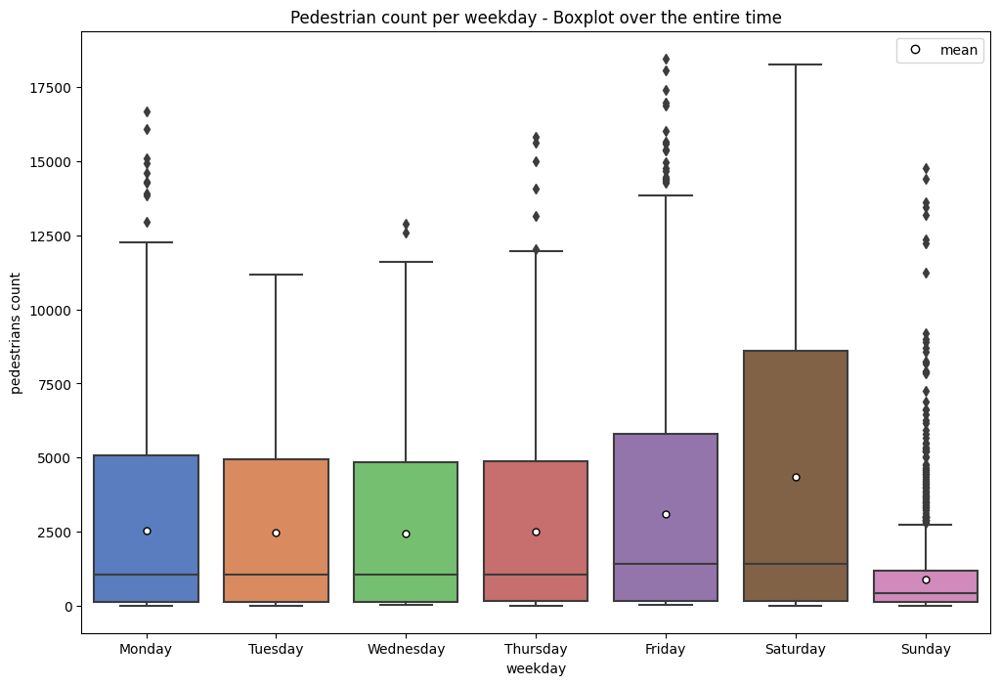

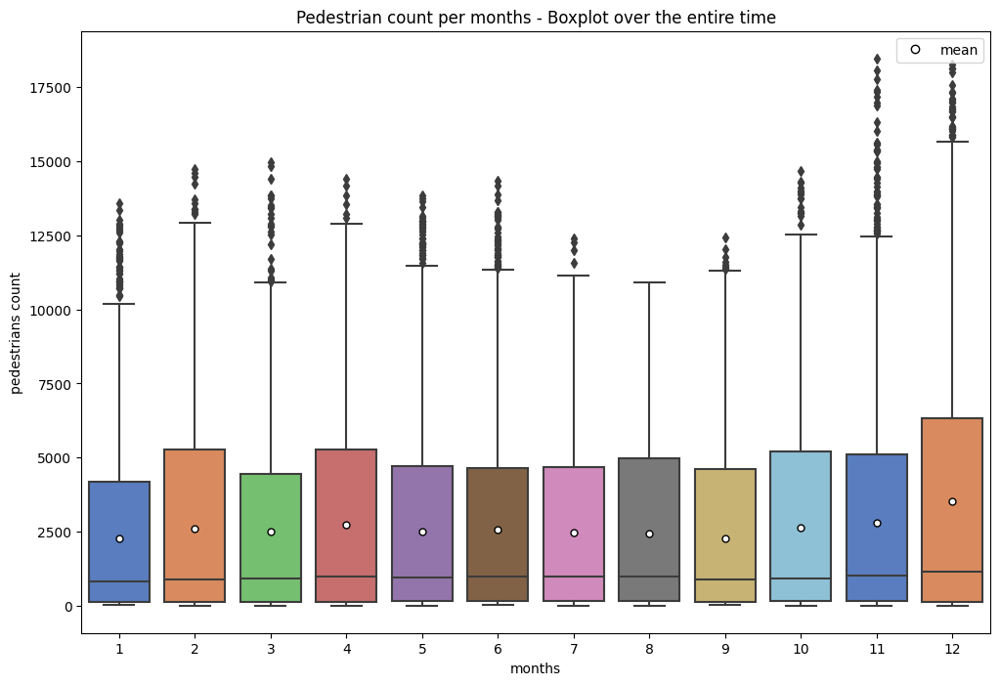

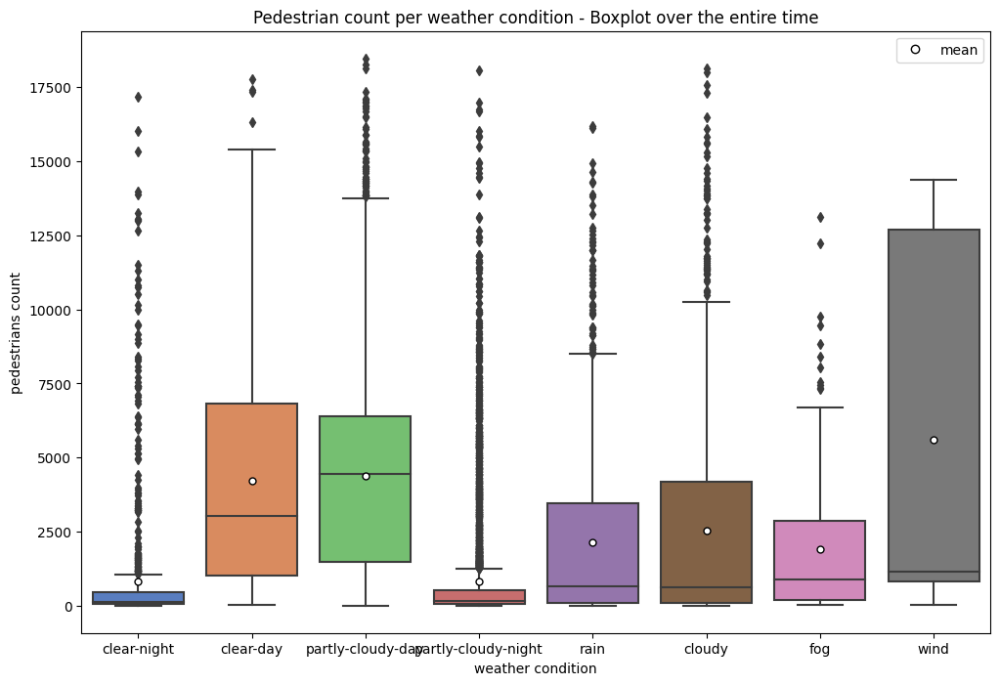

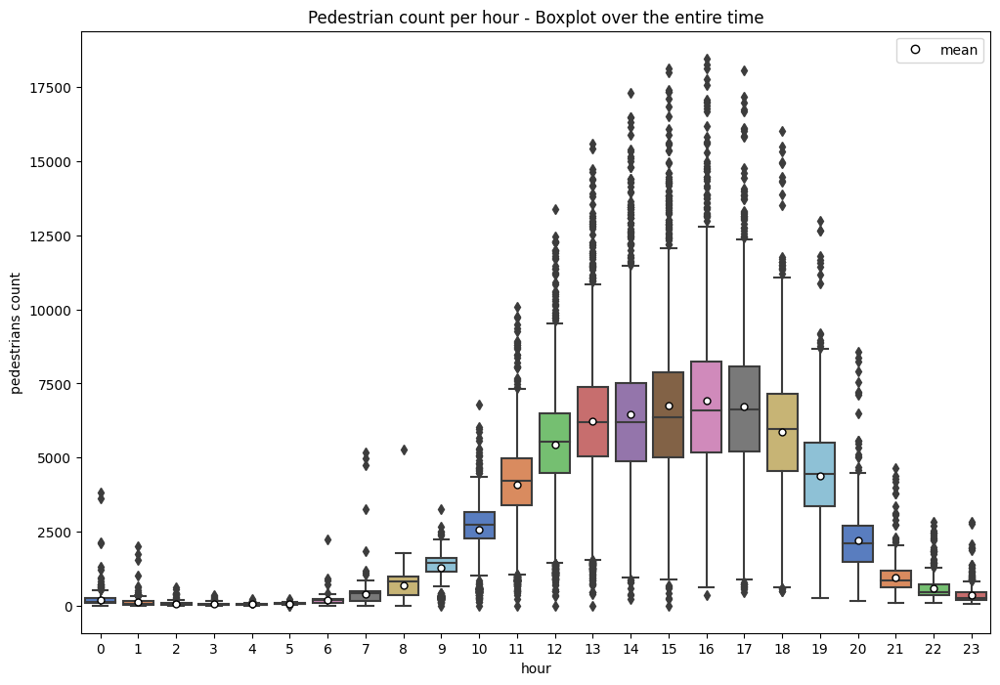

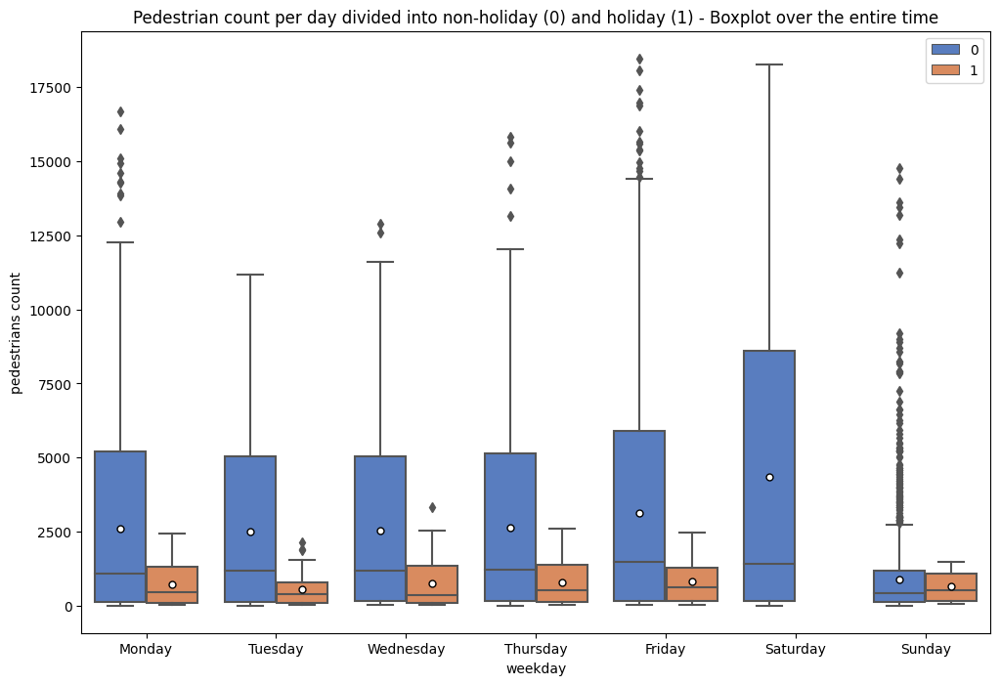

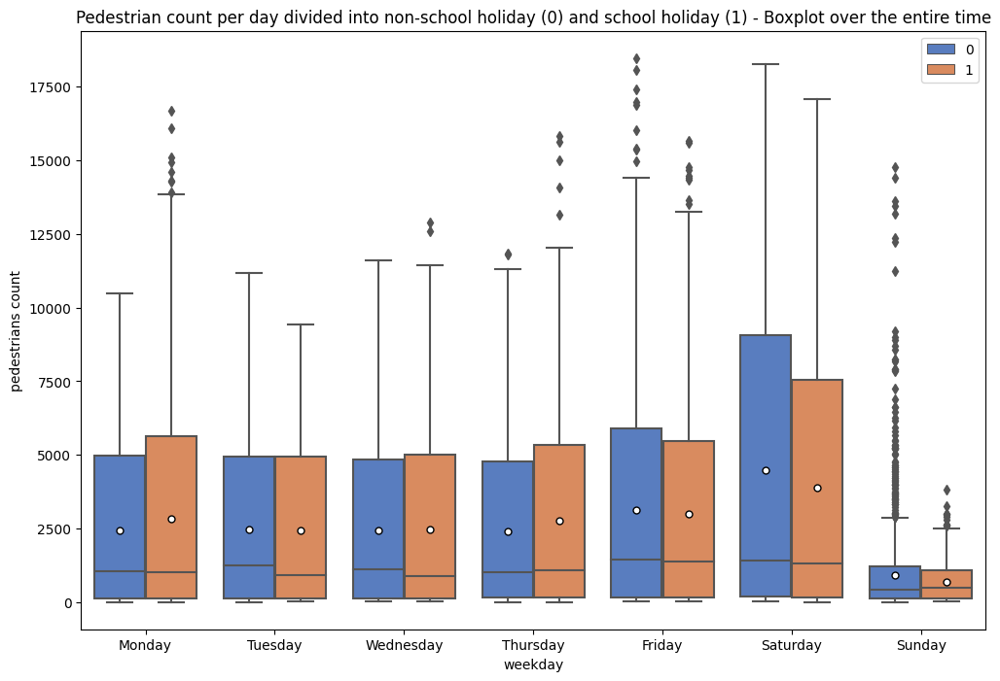

In [9]:
visualize_data("weekday")
visualize_data("months")
visualize_data("weather condition")
visualize_data("hour")
visualize_data_holiday_filter("weekday", "holiday")
visualize_data_holiday_filter("weekday", "school holiday")

# creating list for the function to call plots
names_visualization = ["weekday", "months", "weather condition", "hour", "weekday_holiday", "weekday_school holiday"]

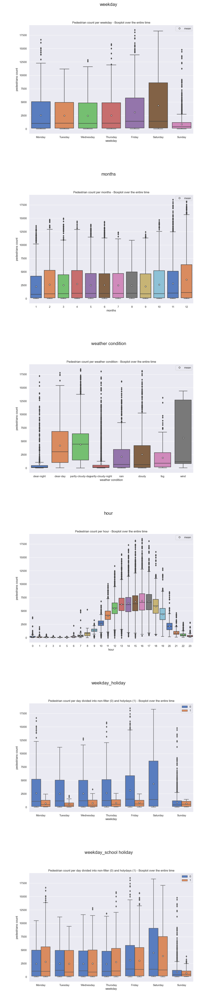

In [13]:
  # Show the saved images
show_images_visualization(names_visualization)

# Neural Network with MLP Regressor

## Hyperparameter Tuning

### 1. Establish Base Scenario

In [4]:
# Initialize a neural network with the default parameters 
nnet_base = MLPRegressor(random_state=42)

In [5]:
# Scale the data to work so it is less sensitive to feature scaling 
# normally we wouldn't use scaling if we already applied PCA to our data
# MLP Regressor doesn't work otherwise and has problems with matrix multiplication
# therefore we use scaling of the features and outputs in this prediction model
scaler = StandardScaler()
# scale the inputs
scaler.fit(Xtrain)
Xtrain_scaled = scaler.transform(Xtrain)
# apply the same transformation to the test data to have meaningful results
scaler.fit(Xtest)
Xtest_scaled = scaler.transform(Xtest)
# scale the y different because we can't use standardscaler to a 1d array
mu, sigma = y.mean(), y.std()
ytest_scaled = (ytest - mu) / sigma
ytrain_scaled = (ytrain - mu) /sigma

In [7]:
scenario_fit_evaluate_scaled("MLP Regressor", "Base Scenario", nnet_base, 
    Xtrain_scaled, ytrain_scaled, Xtest_scaled, ytest_scaled)

           Model       Scenario   MAE_train   MAE_test  R2_train   R2_test
0  MLP Regressor  Base Scenario  346.964702  458.80479   0.96515  0.940915


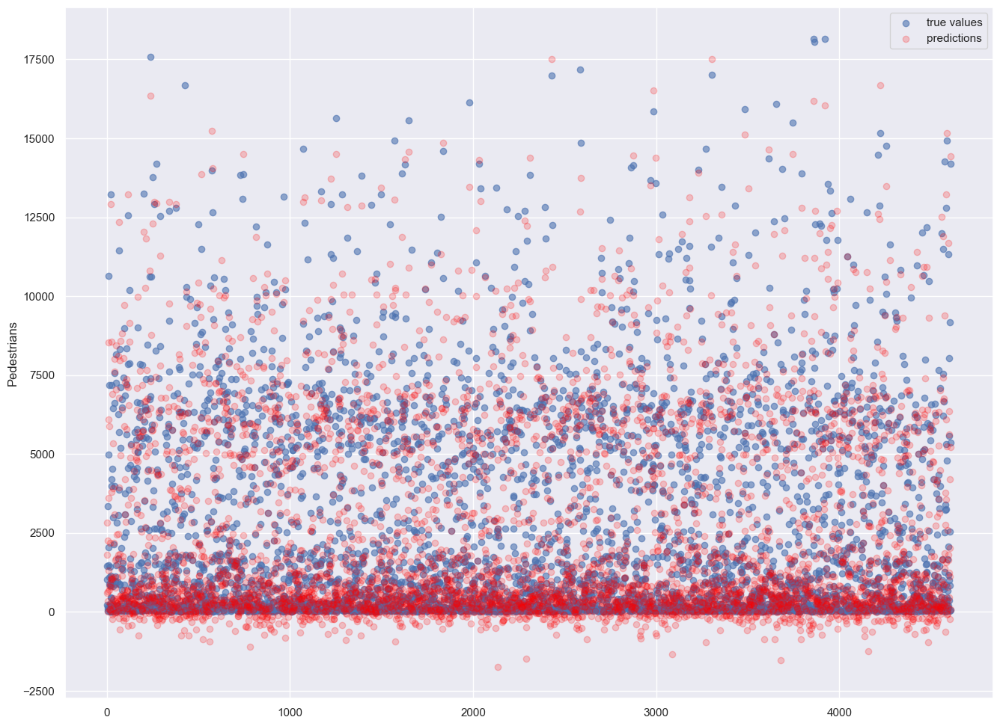

In [8]:
# apply the funtion to the data and calculations    
plot_baseline_scaled(nnet_base, Xtest_scaled, ytest)

### 2. Analyze the Influence of the Different Parameters

In [9]:
# conduncting the parameter analysis on the most used parameters for optimization
# how many hidden layers with how many neurons are we going to use
# 100 is the default value, other values chosen randomly to see the effect of more layers
hidden_layer_sizes = [(100,), (32, 64, 32), (64, 128, 64), (32, 64, 128, 64, 32)]
# activation function that is going to be used on the hidden layers, relu is the default value
activations = ["relu", "logistic", "tanh", "identity"]
# the solver which optimizes the weights, adam is the default value
solvers = ["sgd", "adam"]
# regularization: avoids overfitting, 0.0001 is the default value
alphas = np.linspace(0.00001, 0.001, 50)
# how high is the initial learing rate, 0.001 is the default value
learing_rate_inits = np.linspace(0.001, 0.01, 50)
# number of epochs, 200 is the default value
# often it doesn't converge then so we start at 1000
max_iters = range(1000, 2000, 250)

names_parameters = ["hidden_layer_size", "activation", "solver", "alpha", "learning_rate_init", "max_iter"]

In [ ]:
# apply the function to the different parameters
test_parameter_scaled("MLP Regressor", "hidden_layer_size", hidden_layer_sizes, lambda value: MLPRegressor(hidden_layer_sizes=value, random_state=72))
test_parameter_scaled("MLP Regressor", "activation", activations, lambda value: MLPRegressor(activation=value, random_state=72))
test_parameter_scaled("MLP Regressor", "solver", solvers, lambda value: MLPRegressor(solver=value, random_state=72))
test_parameter_scaled("MLP Regressor", "alpha", alphas, lambda value: MLPRegressor(alpha=value, random_state=72))
test_parameter_scaled("MLP Regressor", "learning_rate_init", learing_rate_inits, lambda value: MLPRegressor(learning_rate_init=value, random_state=72))
test_parameter_scaled("MLP Regressor", "max_iter", max_iters, lambda value: MLPRegressor(max_iter=value, random_state=72))

# merging results into dataframe and safe it as csv to work with it later on
results = results.reset_index().drop(columns="index")
results.to_csv("outputs/param_testing.csv", sep=";", index=False)

In [10]:
# reading the created dataframe from the backup and have a look at it to plot it later for the analysis
param_testing = pd.read_csv("outputs_backup/param_testing.csv", sep=";")
param_testing

,Model,Parameter,ParameterValue,MaeTrain,MaeTest,R2Train,R2Test
0,MLP Regressor,hidden_layer_size,"(100,)",347.696832,441.015175,0.964892,0.943029
1,MLP Regressor,hidden_layer_size,"(32, 64, 32)",297.319744,429.473338,0.972019,0.931705
2,MLP Regressor,hidden_layer_size,"(64, 128, 64)",297.511867,434.913581,0.973874,0.927148
3,MLP Regressor,hidden_layer_size,"(32, 64, 128, 64, 32)",244.434975,447.374537,0.979625,0.919673
4,MLP Regressor,activation,relu,347.696832,441.015175,0.964892,0.943029
...,...,...,...,...,...,...,...
456,LGBM,subsample,0.544444444,285.831105,356.186954,0.972580,0.951250
457,LGBM,subsample,0.633333333,285.831105,356.186954,0.972580,0.951250
458,LGBM,subsample,0.722222222,285.831105,356.186954,0.972580,0.951250
459,LGBM,subsample,0.811111111,285.831105,356.186954,0.972580,0.951250


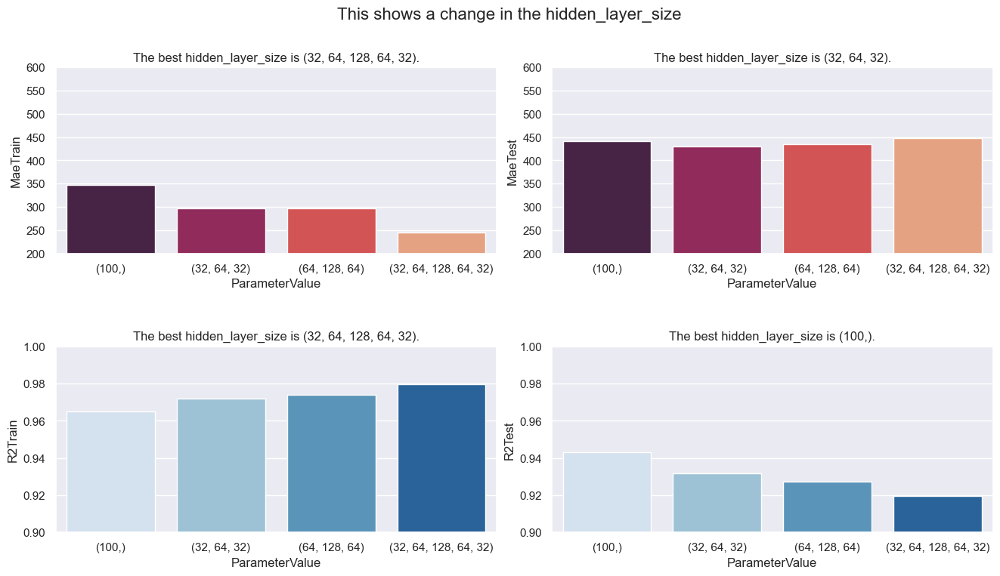

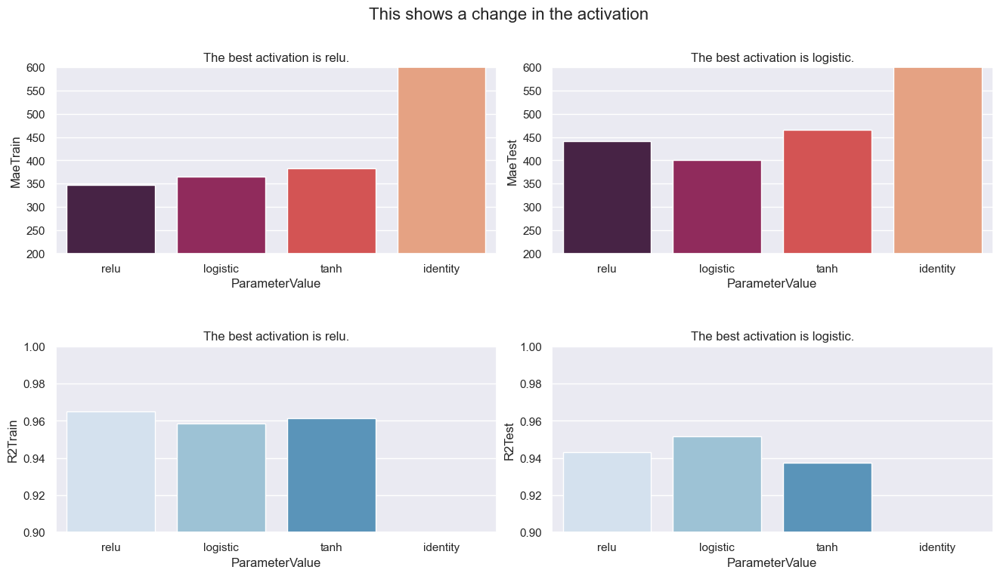

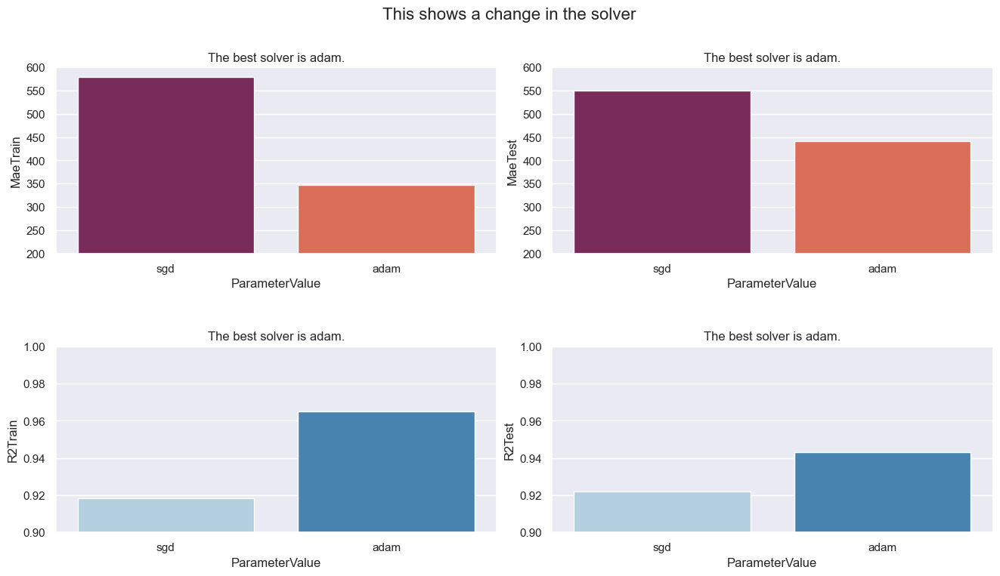

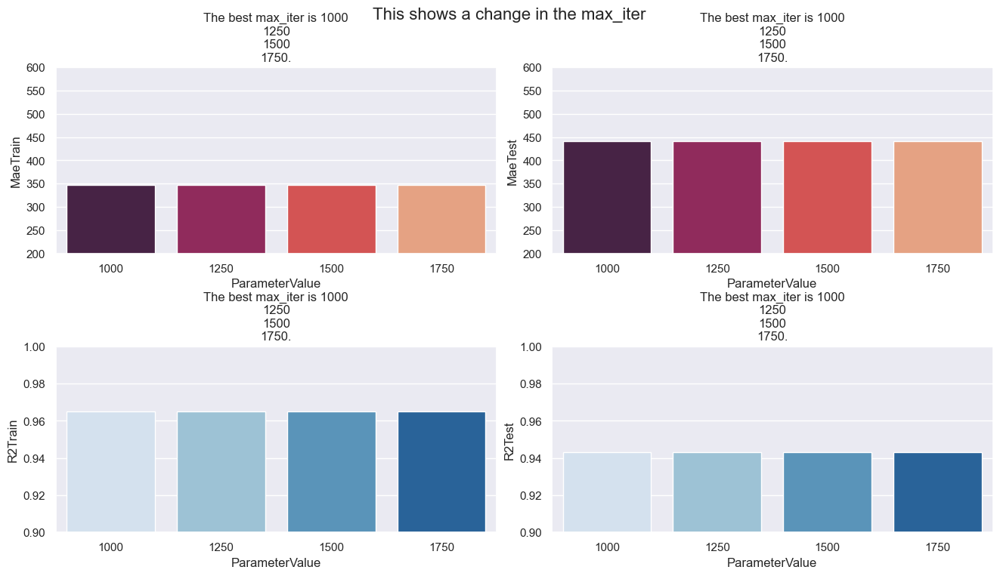

In [12]:
# apply the function to wanted parameters for comparison
plot_bars("MLP Regressor", "hidden_layer_size")
plot_bars("MLP Regressor", "activation")
plot_bars("MLP Regressor", "solver")
# plotting the iterations as a bar because there is no difference at the different iteration times if the rest is default
# it would not be possible to calculate the standardized version for the lineplot
plot_bars("MLP Regressor", "max_iter")

C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\1978361248.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTrain_std"] = standardize_df_col(plot_data["MaeTrain"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\1978361248.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTest_std"] = standardize_df_col(plot_data["MaeTest"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\1978361248.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

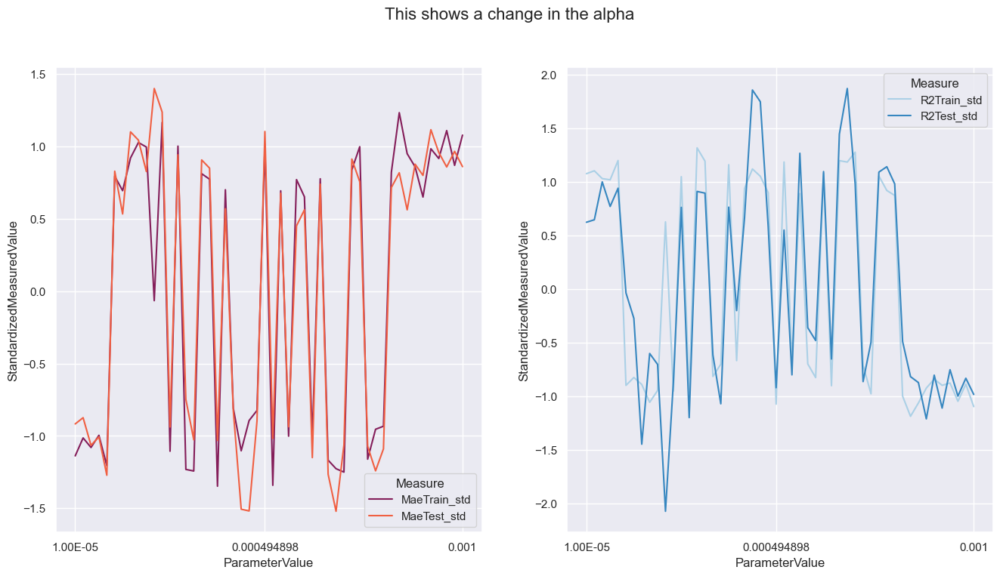

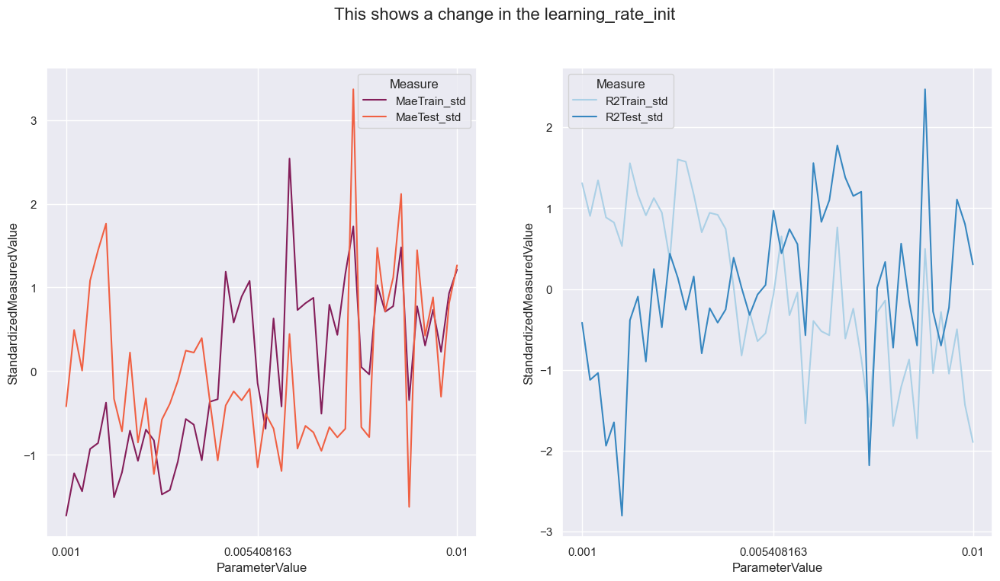

In [93]:
# apply the function to wanted parameters for comparison
plot_lines("MLP Regressor", "alpha")
plot_lines("MLP Regressor", "learning_rate_init")

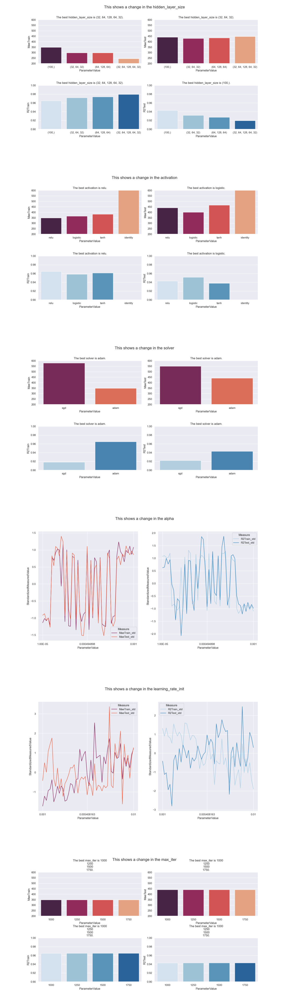

In [14]:
# Show all parameters from the saved pictures
show_images_parameter("MLP Regressor", names_parameters)

### 3. Optimize the Hyperparameters with the Findings above

In [20]:
# subsetting the data for the optimization of the hyperparameters
ped_subset = ped.sample(frac=0.1, random_state=1)

# Define a new X of the subset with the squared feature k = 0.99, 57+46
X_subset = np.array(ped_subset[ped_subset.columns[57:103]])

# Subset of the output to predict
y_subset = ped_subset["pedestrians count"]

# Split the subset into train and test sets
Xtrain_subset, Xtest_subset, ytrain_subset, ytest_subset = train_test_split(
    X_subset, y_subset, test_size=0.3, random_state=72)

In [21]:
# scale the data of the subset, so it is less sensitive to feature scaling 
# scale the inputs
scaler.fit(Xtrain_subset)
Xtrain_scaled_subset = scaler.transform(Xtrain_subset)
# apply the same transformation to the test data to have meaningful results
scaler.fit(Xtest_subset)
Xtest_scaled_subset = scaler.transform(Xtest_subset)
# scale the y different because we can't use standardscaler to a 1d array
mu_subset, sigma_subset = y_subset.mean(), y_subset.std()
ytest_scaled_subset = (ytest_subset - mu_subset) / sigma_subset
ytrain_scaled_subset = (ytrain_subset - mu_subset) /sigma_subset

In [22]:
# Definine a Base Model for the Subset
nnet_base_sub = MLPRegressor(random_state=42)
nnet_base_sub.fit(Xtrain_scaled_subset, ytrain_scaled_subset)

# Evaluate the basemodel for the Subset
scenario_fit_evaluate_scaled("MLP Regressor Subset", "Base Scenario", nnet_base_sub, 
    Xtrain_scaled_subset, ytrain_scaled_subset, Xtest_scaled_subset, ytest_scaled_subset)

                  Model       Scenario   MAE_train    MAE_test  R2_train  \
0         MLP Regressor  Base Scenario  346.964702  458.804790  0.965150   
1  MLP Regressor Subset  Base Scenario  164.727363  943.799061  0.991575   

    R2_test  
0  0.940915  
1  0.812095  


In [129]:
# defining the model and the parameters used in RandomizedSearchCV
nnet_randomsearch = MLPRegressor(random_state=42)

parameters_randomsearch = {
    # choosing the two best hidden layer sizes and a range around them
    "hidden_layer_sizes": [(50,), (100,), (150,), (9, 18, 6), (32, 64, 32), (12, 24, 12)],
    "activation": ["logistic", "relu"], # choosing the two activation functions based on analysis above
    "solver": ["adam"], # adam was clearly the best solver in the plot above
    "alpha": np.linspace(0.00005, 0.0005, 20),
    "learning_rate_init" : np.linspace(0.0005, 0.001, 20),
    "max_iter" : range(1000, 2000, 100) # we look if the iterations have an efffect if there are other parameters that change
}

# Calculating the possibilities this gives us
length = [len(values) for key, values in parameters_randomsearch.items()]
print(f"In total we have {np.prod(length)} possibilities")

In [132]:
# running the RandomizedSearchCV on the subset of the data
nnet_rndm_src = RandomizedSearchCV(estimator=nnet_randomsearch, param_distributions=parameters_randomsearch, cv=3)
nnet_rndm_src.fit(Xtrain_subset, ytrain_subset)
print(nnet_rndm_src.best_params_)
# {'solver': 'adam', 'max_iter': 1300, 'learning_rate_init': 0.0005, 'hidden_layer_sizes': (9, 18, 6), 'alpha': 0.00021578947368421054, 'activation': 'relu'}

c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1800) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1800) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1500) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\en

{'solver': 'adam',
 'max_iter': 1700,
 'learning_rate_init': 0.0006052631578947369,
 'hidden_layer_sizes': (9, 18, 6),
 'alpha': 0.00028684210526315793,
 'activation': 'relu'}

In [23]:
# creating a neural network with the results of the RandomSearchCV and the whole data and look at mae and r2
nnet_random = MLPRegressor(hidden_layer_sizes=(9, 18, 6), activation="relu", solver="adam", alpha=0.00021578947368421054,
    learning_rate_init=0.0005, max_iter=1300, random_state=42)

# fit the data and run the model with new parameters
scenario_fit_evaluate_scaled("MLP Regressor Subset", "RandomSearch", nnet_random, Xtrain_scaled_subset, ytrain_scaled_subset, Xtest_scaled_subset, ytest_scaled_subset)

                  Model       Scenario   MAE_train    MAE_test  R2_train  \
0         MLP Regressor  Base Scenario  346.964702  458.804790  0.965150   
1  MLP Regressor Subset  Base Scenario  164.727363  943.799061  0.991575   
2  MLP Regressor Subset   RandomSearch  422.899468  816.585346  0.958999   

    R2_test  
0  0.940915  
1  0.812095  
2  0.835115  


In [143]:
# use GridSearchCV to further optimize the parameters and run now all possibilities
# defining the model and the parameters used in GridSearchCV
nnet_gridsearch = MLPRegressor(random_state=42)

parameters_gridsearch = {
    "hidden_layer_sizes": [(9, 18, 6), (32, 64, 32)], # keeping (32, 64, 32) because it looked promising before and compare it to randomized optimum
    "activation": ["relu"],
    "solver": ["adam"],
    "alpha": np.append(np.linspace(0.0002, 0.0004, 3), [0.00021578947368421054]), # appending the best value of RandomSearch
    "learning_rate_init" : np.append(np.linspace(0.0004, 0.0006, 3), [0.0005]), # appending the best value of RandomSearch
    "max_iter" : range(1200, 1500, 100)
}


In [144]:
# running the GridSearchCV on the subset of the data
nnet_grid_src = GridSearchCV(estimator=nnet_gridsearch, param_grid=parameters_gridsearch, cv=3)
nnet_grid_src.fit(Xtrain_subset, ytrain_subset)
print(nnet_grid_src.best_params_)

# {'activation': 'relu', 'alpha': 0.00021578947368421054, 'hidden_layer_sizes': (32, 64, 32), 'learning_rate_init': 0.0006, 'max_iter': 1300, 'solver': 'adam'}

c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1400) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\envs\dsf\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1400) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\janag\miniconda3\en

{'activation': 'relu',
 'alpha': 0.0003,
 'hidden_layer_sizes': (32, 64, 32),
 'learning_rate_init': 0.0005,
 'max_iter': 1300,
 'solver': 'adam'}

In [24]:
# creating a neural network with the results of GridSearchCV and the whole data and look at mae and r2
nnet_grid = MLPRegressor(hidden_layer_sizes=(32, 64, 32), activation="relu", solver="adam", alpha=0.00021578947368421054,
    learning_rate_init=0.0006, max_iter=1300, random_state=42)

# fit the data and run the model with new parameters
scenario_fit_evaluate_scaled("MLP Regressor Subset", "GridSearch", nnet_grid, Xtrain_scaled_subset, ytrain_scaled_subset, Xtest_scaled_subset, ytest_scaled_subset)

                  Model       Scenario   MAE_train    MAE_test  R2_train  \
0         MLP Regressor  Base Scenario  346.964702  458.804790  0.965150   
1  MLP Regressor Subset  Base Scenario  164.727363  943.799061  0.991575   
2  MLP Regressor Subset   RandomSearch  422.899468  816.585346  0.958999   
3  MLP Regressor Subset     GridSearch  157.127540  939.964346  0.993650   

    R2_test  
0  0.940915  
1  0.812095  
2  0.835115  
3  0.816643  


## Comparing the results of the 3 neural networks

In [33]:
# reading the created dataframe and have a look at it to plot it later for the analysis
comparison_backup = pd.read_csv("outputs_backup/comparison_mae_r2.csv", sep=";")
comparison_backup


,Model,Scenario,MAE_train,MAE_test,R2_train,R2_test
0,MLP Regressor,Base Scenario,346.964702,458.804790,0.965150,0.940915
1,MLP Regressor Subset,Base Scenario,164.727363,943.799061,0.991575,0.812095
2,MLP Regressor Subset,RandomSearch,422.899468,816.585346,0.958999,0.835115
3,MLP Regressor Subset,GridSearch,157.127540,939.964346,0.993650,0.816643
4,MLP Regressor,GridSearch,304.198428,441.389594,0.970655,0.932543
5,MLP Regressor,Partly optimisation,415.745568,425.201080,0.939840,0.940928
6,Random Forest,Base Scenario,148.597667,339.997802,0.988607,0.942855
7,Random Forest Subset,Base Scenario,196.444005,571.199575,0.984530,0.897685
8,Random Forest Subset,RandomSearch,238.349159,588.154607,0.972960,0.890751
9,Random Forest Subset,GridSearch,238.349159,588.154607,0.972960,0.890751


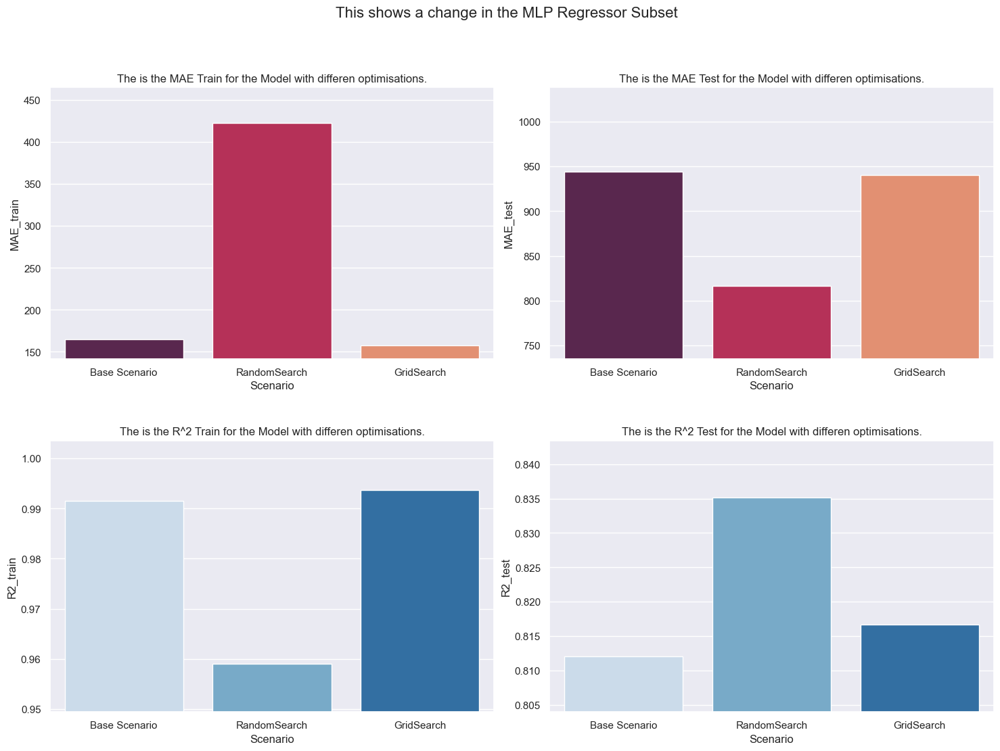

In [16]:
# Run a Function to plot the comparison of the models
plot_bars_comp("MLP Regressor Subset", comparison_backup)

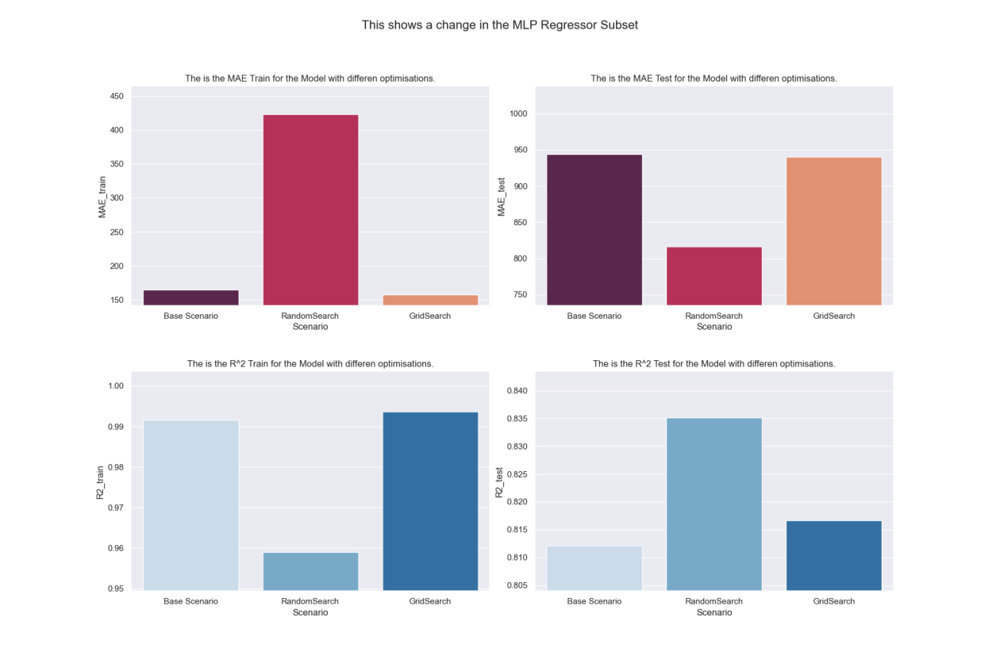

In [17]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("MLP Regressor Subset")

### Optimization for the whole dataset

In [25]:
# for comparison run the optimized parameters of the subset on the whole dataset and look at mae and r2
# fit the data and run the model with selected parameters

scenario_fit_evaluate_scaled("MLP Regressor", "GridSearch", nnet_grid, Xtrain_scaled, ytrain_scaled, Xtest_scaled, ytest_scaled)

                  Model       Scenario   MAE_train    MAE_test  R2_train  \
0         MLP Regressor  Base Scenario  346.964702  458.804790  0.965150   
1  MLP Regressor Subset  Base Scenario  164.727363  943.799061  0.991575   
2  MLP Regressor Subset   RandomSearch  422.899468  816.585346  0.958999   
3  MLP Regressor Subset     GridSearch  157.127540  939.964346  0.993650   
4         MLP Regressor     GridSearch  304.198428  441.389594  0.970655   

    R2_test  
0  0.940915  
1  0.812095  
2  0.835115  
3  0.816643  
4  0.932543  


In [ ]:
# Setting up the first Hyperparameters that should be tuned, due to the size of the Dataset only very few
# Number of trees in random forest
hidden_layer_sizes = [(9, 18, 6), (32, 64, 32)]
# to avoid overfittig
alpha = np.linspace(0.0002, 0.0004, 3)
# Method to controll complexity 
learning_rate_init = np.linspace(0.0004, 0.0006, 3)

param_grid = {"hidden_layer_sizes": hidden_layer_sizes,
               "alpha": alpha,
               "learning_rate_init": learning_rate_init}

param_standard = {"hidden_layer_sizes": (100,),
               "alpha": 0.0001,
               "learning_rate_init": 0.001}

In [ ]:
# Although they are influencing each other, this is too much for my Comuter, a proper optimization is shown above with a 
# subset and Cross validation takes too much computing power, due to the lage data:

best_hidden_layer_size = optimize_parameter_scaled("hidden_layer_sizes", hidden_layer_sizes, 0.0001 , 0.001, Xtrain_scaled, Xtest_scaled, ytrain_scaled, ytest_scaled, 
                    lambda value, value_fix1, value_fix2: MLPRegressor(hidden_layer_sizes=value, alpha=value_fix1, learning_rate_init=value_fix2, random_state=42))

best_alpha = optimize_parameter_scaled("alpha", alpha, best_hidden_layer_size, 0.001,  Xtrain_scaled, Xtest_scaled, ytrain_scaled, ytest_scaled,
                    lambda value, value_fix1, value_fix2: MLPRegressor(hidden_layer_sizes=value_fix1, alpha=value, learning_rate_init=value_fix2, random_state=42))

best_learning_rate = optimize_parameter_scaled("learning_rate_init", learning_rate_init, best_hidden_layer_size, best_alpha,  Xtrain_scaled, Xtest_scaled, ytrain_scaled, ytest_scaled,
                    lambda value, value_fix1, value_fix2: MLPRegressor(hidden_layer_sizes=value_fix1, alpha=value_fix2, learning_rate_init=value, random_state=42))

print(f"The best MAE Test is given with, hidden_layer_sizes: {best_hidden_layer_size}, alpha: {best_alpha}, learning_rate_init: {best_learning_rate}")
# The best MAE Test is given with, hidden_layer_sizes: (9, 18, 6), alpha: 0.0002, learning_rate_init: 0.0004

The best MAE Test is given with, hidden_layer_sizes: (9, 18, 6), alpha: 0.0002, learning_rate_init: 0.0004


In [26]:
# creating a neural network with the results of this optimization to look at the mae and r2
nnet_optimized = MLPRegressor(random_state=42, hidden_layer_sizes= (9, 18, 6), alpha = 0.0002, learning_rate_init = 0.0004)

# fit the data and run the model with new parameters
scenario_fit_evaluate_scaled("MLP Regressor", "Partly optimisation", nnet_optimized, Xtrain_scaled, ytrain_scaled, Xtest_scaled, ytest_scaled)


                  Model             Scenario   MAE_train    MAE_test  \
0         MLP Regressor        Base Scenario  346.964702  458.804790   
1  MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2  MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3  MLP Regressor Subset           GridSearch  157.127540  939.964346   
4         MLP Regressor           GridSearch  304.198428  441.389594   
5         MLP Regressor  Partly optimisation  415.745568  425.201081   

   R2_train   R2_test  
0  0.965150  0.940915  
1  0.991575  0.812095  
2  0.958999  0.835115  
3  0.993650  0.816643  
4  0.970655  0.932543  
5  0.939840  0.940928  


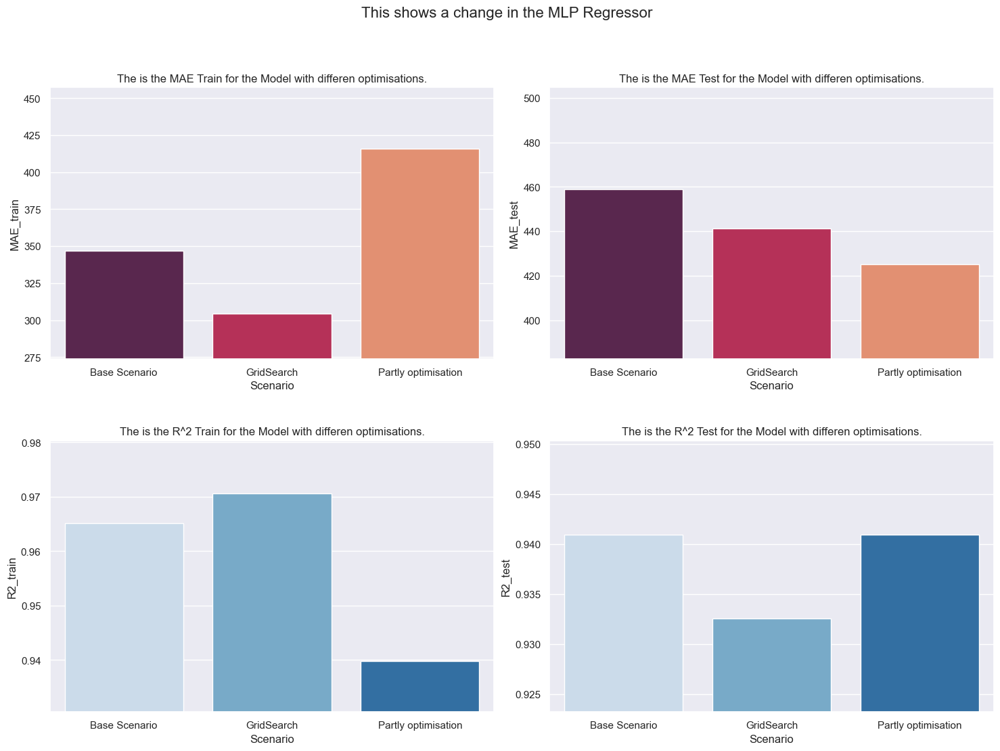

In [34]:
# plotting a comparison to the base model

plot_bars_comp("MLP Regressor", comparison_backup)

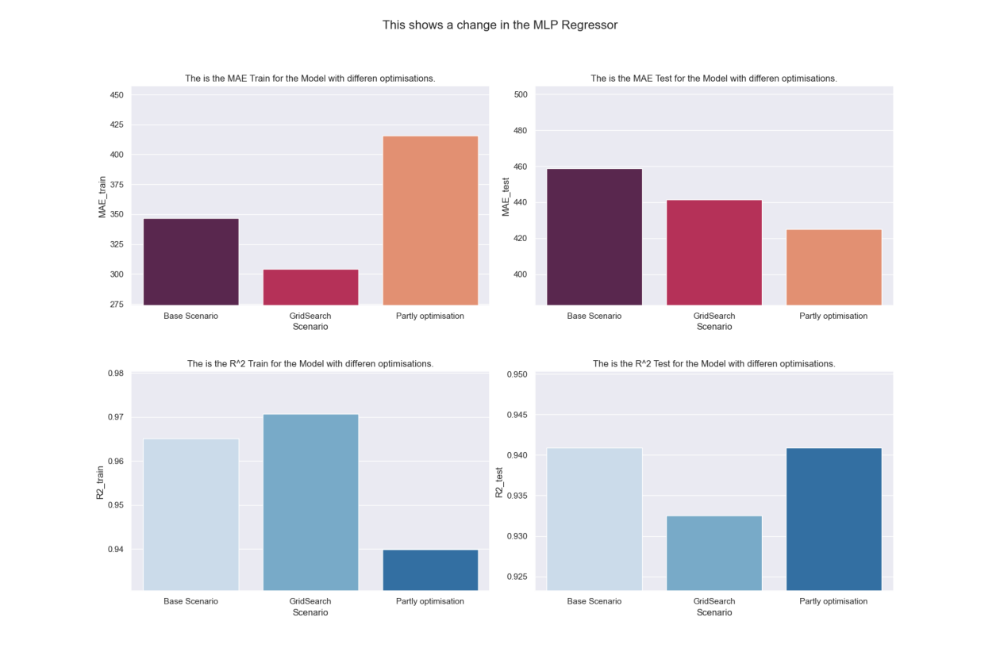

In [35]:
show_images_compa("MLP Regressor")

# Random Forest

In [36]:
# Importing the data and splitting it into a train and test set to work with
ped = pd.read_csv("data/data_clean_with_dummies.csv", index_col=0)

# Define a new X with the squared feature k = 0.99, 57+46
X = np.array(ped[ped.columns[57:103]])

# Output to predict
y = ped["pedestrians count"]

# Split the dataset into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(
    X, y, test_size=0.3, random_state=72)

## Hyperparameter Tuning

### 1. Establish Base Scenario

In [37]:
# Initialize a Random Forest with the default parameters 
forest_base = RandomForestRegressor(random_state=144,n_jobs=-1)

In [39]:
# Running the function to get the baseline values
scenario_fit_evaluate("Random Forest", "Base Scenario", forest_base, 
    Xtrain, ytrain, Xtest, ytest)

                  Model             Scenario   MAE_train    MAE_test  \
0         MLP Regressor        Base Scenario  346.964702  458.804790   
1  MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2  MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3  MLP Regressor Subset           GridSearch  157.127540  939.964346   
4         MLP Regressor           GridSearch  304.198428  441.389594   
5         MLP Regressor  Partly optimisation  415.745568  425.201081   
6         Random Forest        Base Scenario  148.597666  339.997802   

   R2_train   R2_test  
0  0.965150  0.940915  
1  0.991575  0.812095  
2  0.958999  0.835115  
3  0.993650  0.816643  
4  0.970655  0.932543  
5  0.939840  0.940928  
6  0.988607  0.942855  


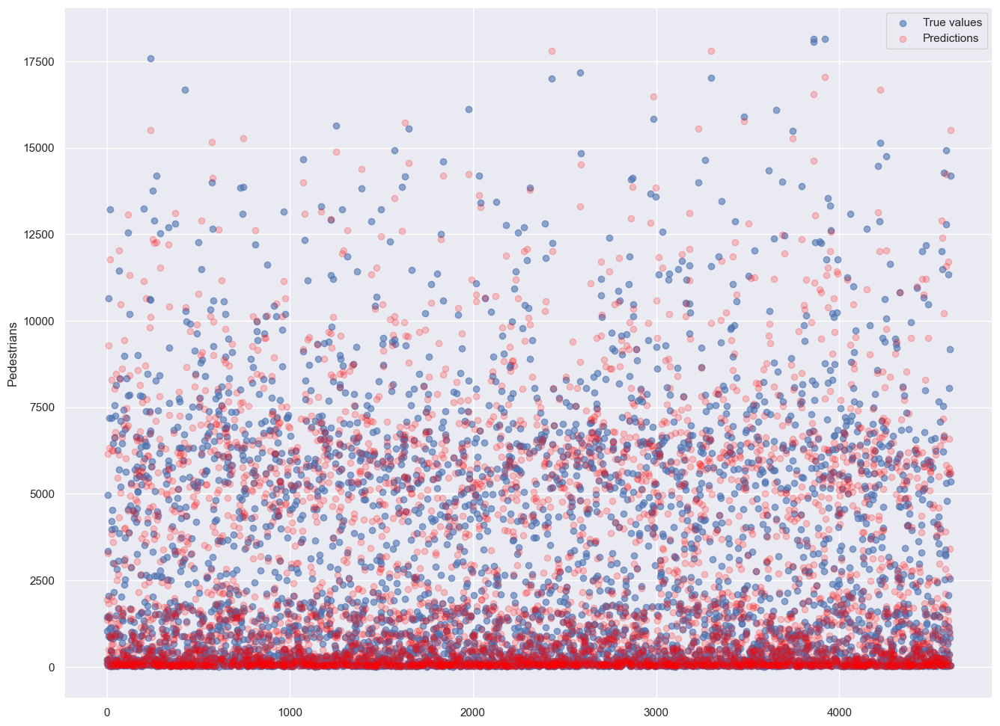

In [40]:
# Plot the Predictions and the Actual data for the Test set to get a first impression
plot_baseline(forest_base, Xtest, ytest)

### 2. Analyze the Influence of the Different Parameters

In [41]:
# Conduncting the parameter analysis on the most used parameters for optimization
# n_estimatorsgives how many trees are considered, Defalut = 100
n_estimators = [x for x in range(50, 800, 50)]
# ccp_alpha: is a complexity parameter,  Defalut = 0
ccp_alpha = [x for x in np.linspace(0, 0.3, 30)]
#max_depth:  gives the longest path possible in a tree, Defalut = None
max_depth = [x for x in range(10, 30, 2)]
max_depth2 = [x for x in range(30, 201, 10)]
max_depth.extend(max_depth2)
# max_features: gives the maximum features provided to each tree, Defalut = 1.0
max_features = [x for x in range(1, 41, 2)]
# max_features_deciaml: gives the maximum features provided to each tree (a floater is multiplyed by all features), Defalut = 1.0
max_features_decimal = [x for x in np.linspace(0.01, 1, 20)]
# min_sample_split: is the minimum required number of observations in node to split it, Defalut = 2
min_samples_split = [x for x in range(2, 30, 1)]
# min_samples_leaf: is the minimum number of samples that should be present in the leaf node after splitting, Defalut = 1
min_samples_leaf = [x for x in range(1, 15, 1)]

names_parameters = ["n_estimators","ccp_alpha", "max_depth", "max_features", "max_features_decimal", "min_samples_split", "min_samples_leaf"]

In [11]:
# if True: # Remove the 2 first lines to run the code, this is just a safeguard
#      raise Exception("Remove these two lines first")



# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # 



# Apply the function to the different parameters
test_parameter("Random Forest", "n_estimators", n_estimators, lambda value: RandomForestRegressor(n_estimators=value, random_state=144,n_jobs=-1))
test_parameter("Random Forest", "ccp_alpha", ccp_alpha, lambda value: RandomForestRegressor(ccp_alpha=value, random_state=144,n_jobs=-1))
test_parameter("Random Forest", "max_depth", max_depth, lambda value: RandomForestRegressor(max_depth=value, random_state=144,n_jobs=-1))
test_parameter("Random Forest", "max_features", max_features, lambda value: RandomForestRegressor(max_features=value, random_state=144,n_jobs=-1))
test_parameter("Random Forest", "max_features_decimal", max_features_decimal, lambda value: RandomForestRegressor(max_features=value, random_state=144,n_jobs=-1))
test_parameter("Random Forest", "min_samples_split", min_samples_split, lambda value: RandomForestRegressor(min_samples_split=value, random_state=144,n_jobs=-1))
test_parameter("Random Forest", "min_samples_leaf", min_samples_leaf, lambda value: RandomForestRegressor(min_samples_leaf=value, random_state=144,n_jobs=-1))

# Merging results into dataframe and safe it as csv to work with it later on
results = results.reset_index().drop(columns="index")
results.to_csv("outputs/param_testing.csv", sep=";", index=False)


In [6]:
# Reading the created dataframe (backup)
param_testing = pd.read_csv("outputs_backup/param_testing.csv", sep=";")
param_testing



,Model,Parameter,ParameterValue,MaeTrain,MaeTest,R2Train,R2Test
0,MLP Regressor,hidden_layer_size,"(100,)",347.696832,441.015175,0.964892,0.943029
1,MLP Regressor,hidden_layer_size,"(32, 64, 32)",297.319744,429.473338,0.972019,0.931705
2,MLP Regressor,hidden_layer_size,"(64, 128, 64)",297.511867,434.913581,0.973874,0.927148
3,MLP Regressor,hidden_layer_size,"(32, 64, 128, 64, 32)",244.434975,447.374537,0.979625,0.919673
4,MLP Regressor,activation,relu,347.696832,441.015175,0.964892,0.943029
...,...,...,...,...,...,...,...
574,XGBoost,reg_alpha,118,205.452598,377.914050,0.987959,0.942433
575,XGBoost,reg_alpha,125,204.813405,378.590579,0.987925,0.941044
576,XGBoost,reg_alpha,132,208.734329,378.854142,0.987365,0.940950
577,XGBoost,reg_alpha,139,207.663434,383.651855,0.987695,0.940475


C:\Users\Biebert\AppData\Local\Temp\ipykernel_25968\4004677908.py:282: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTrain_std"] = standardize_df_col(plot_data["MaeTrain"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_25968\4004677908.py:283: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTest_std"] = standardize_df_col(plot_data["MaeTest"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_25968\4004677908.py:284: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

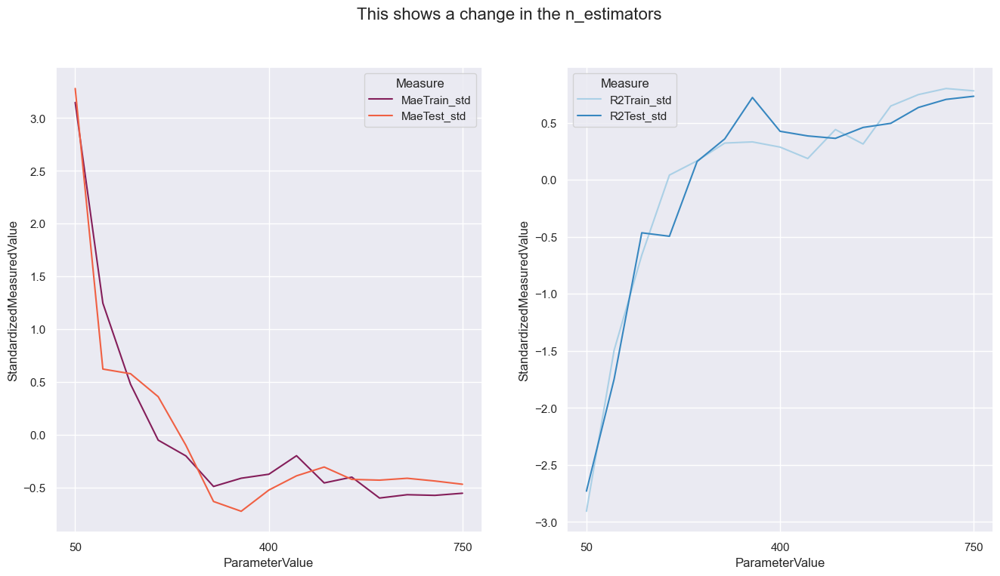

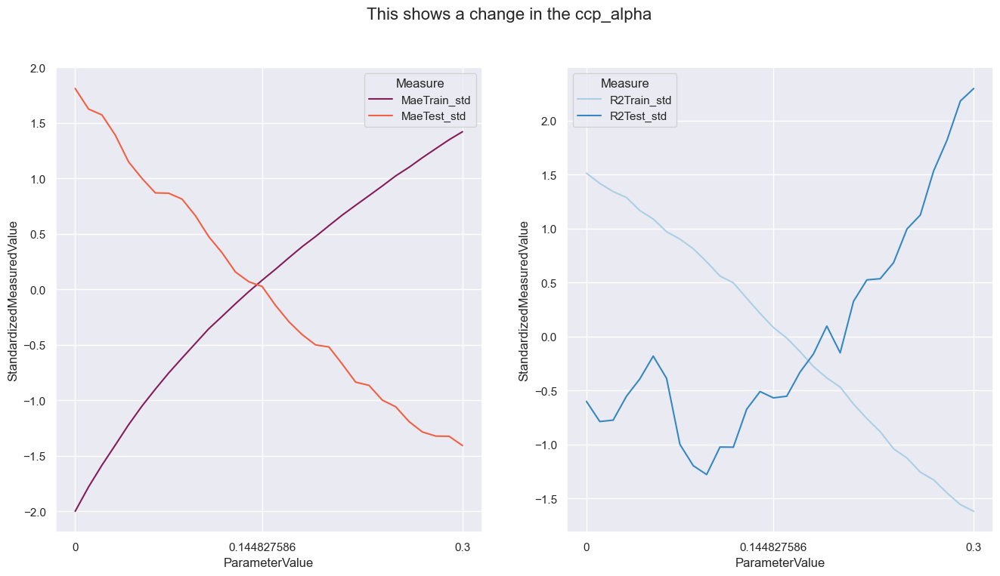

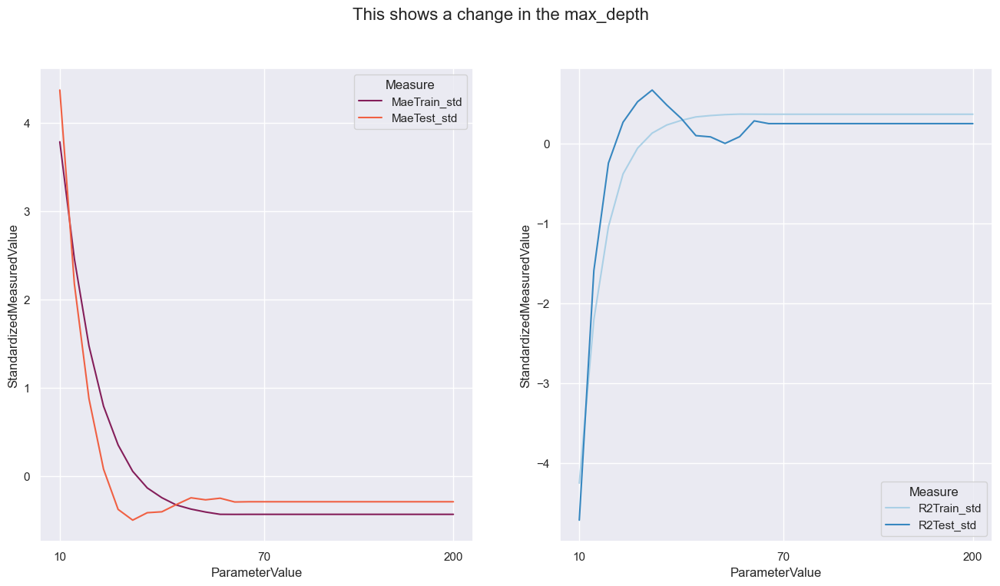

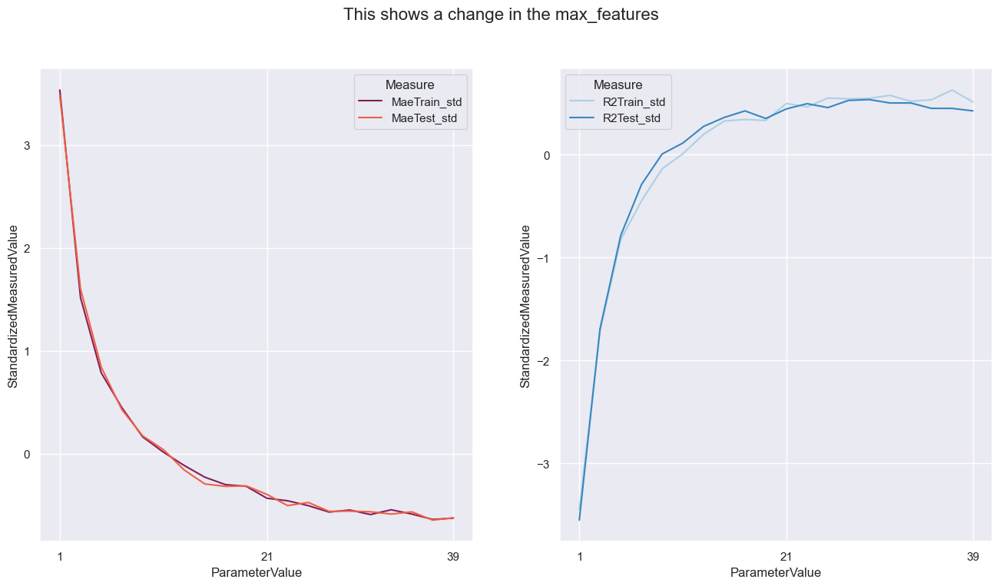

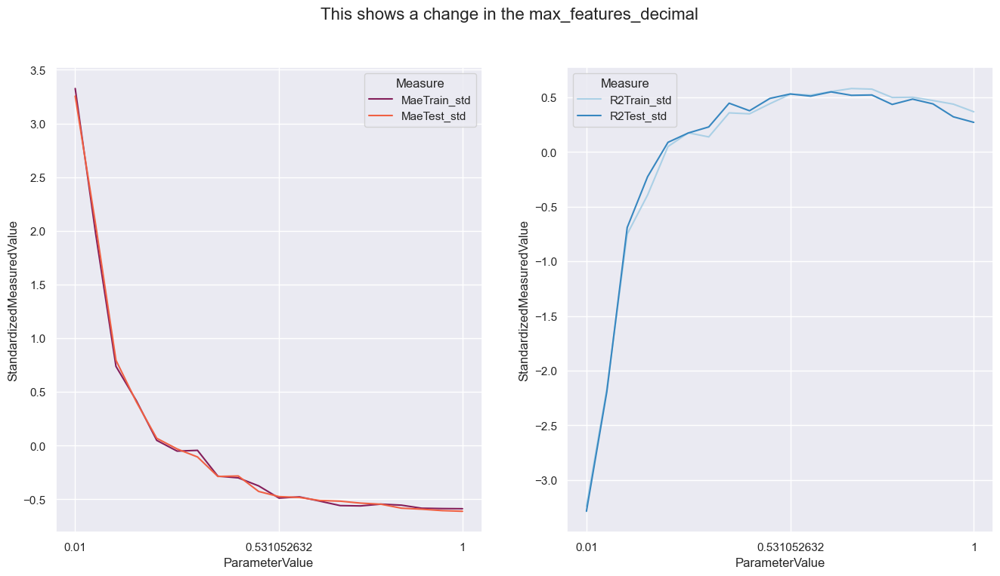

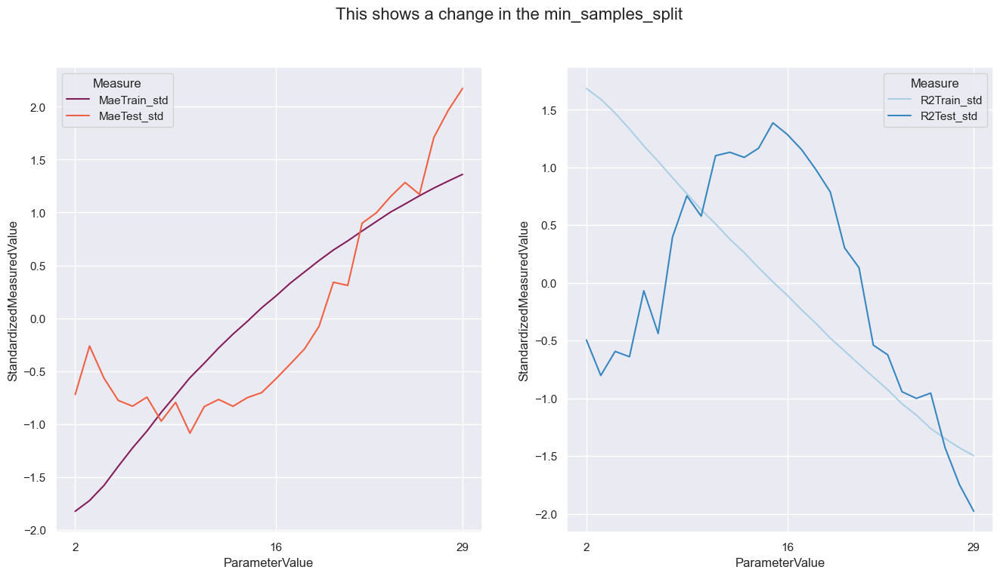

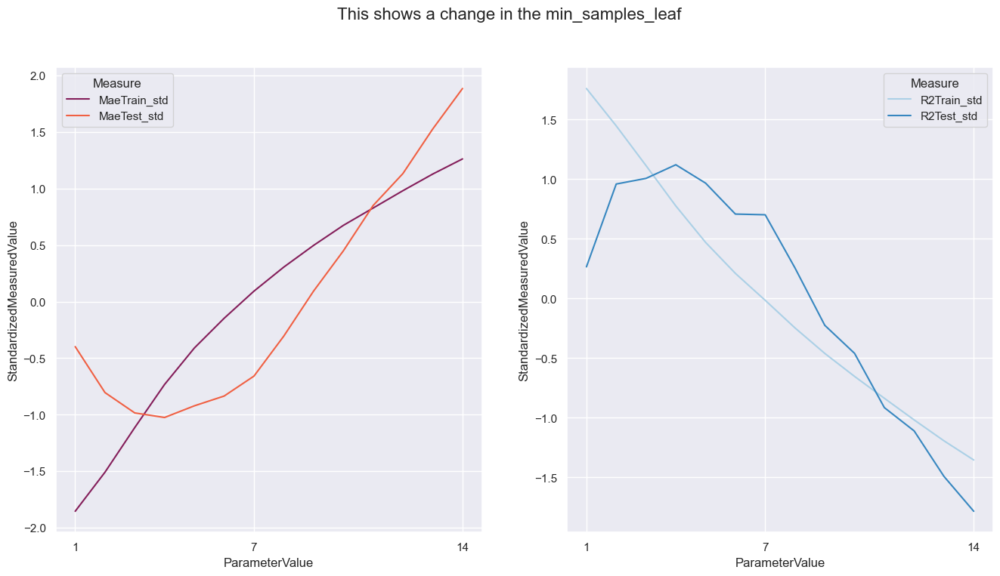

In [7]:
# apply the function to wanted parameters for comparison
plot_lines("Random Forest", "n_estimators")
plot_lines("Random Forest", "ccp_alpha")
plot_lines("Random Forest", "max_depth")
plot_lines("Random Forest", "max_features")
plot_lines("Random Forest", "max_features_decimal")
plot_lines("Random Forest", "min_samples_split")
plot_lines("Random Forest", "min_samples_leaf")

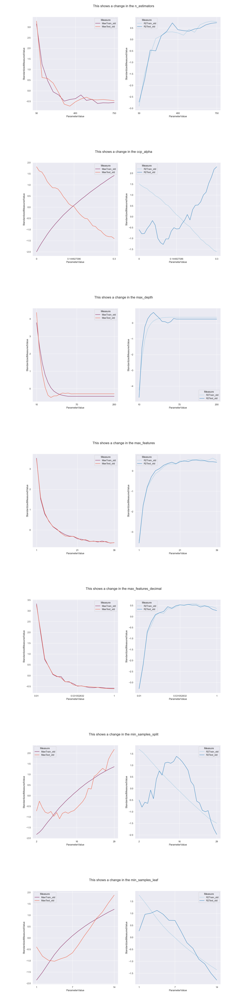

In [94]:
# Show the plots from the backup
show_images_parameter("Random Forest", names_parameters)


### 3. Optimize the Hyperparameters with the Findings above

In [95]:
# Subsetting the data for the optimization of the hyperparameters
ped_subset = ped.sample(frac=0.1, random_state=1)

# Define a new X of the subset with the squared feature k = 0.99, 57+46
X_subset = np.array(ped_subset[ped_subset.columns[57:103]])

# Subset of the output to predict
y_subset = ped_subset["pedestrians count"]

# Split the subset into train and test sets
Xtrain_subset, Xtest_subset, ytrain_subset, ytest_subset = train_test_split(
    X_subset, y_subset, test_size=0.3, random_state=72)

In [96]:
# Definint a Base Model for the Subset
forest_base_sub = RandomForestRegressor(random_state=144,n_jobs=-1)
forest_base_sub.fit(Xtrain_subset, ytrain_subset)

# Evaluate the basemodel for the Subset
scenario_fit_evaluate("Random Forest Subset", "Base Scenario", forest_base_sub, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

                  Model             Scenario   MAE_train    MAE_test  \
0         MLP Regressor        Base Scenario  346.964702  458.804790   
1  MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2  MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3  MLP Regressor Subset           GridSearch  157.127540  939.964346   
4         MLP Regressor           GridSearch  304.198428  441.389594   
5         MLP Regressor  Partly optimisation  415.745568  425.201081   
6         Random Forest        Base Scenario  148.597666  339.997802   
7  Random Forest Subset        Base Scenario  196.444005  571.199575   

   R2_train   R2_test  
0  0.965150  0.940915  
1  0.991575  0.812095  
2  0.958999  0.835115  
3  0.993650  0.816643  
4  0.970655  0.932543  
5  0.939840  0.940928  
6  0.988607  0.942855  
7  0.984530  0.897685  


In [17]:
# Setting up the parameter that should be tuned, orientated at the visualisation above
n_estimators = [x for x in range(300, 601, 50)]
ccp_alpha = [x for x in np.linspace(0.0, 0.2, 10)]
max_depth = [int(x) for x in range(5, 30, 5)]
max_depth.append(None)
max_features = [x for x in np.linspace(0.0, 1, 5)]
max_features.extend([None])
min_samples_split = [int(x) for x in range(5, 20, 5)]
min_samples_leaf = [x for x in range(1, 8, 2)]
bootstrap = [True, False]

# Create the param grid
param_distributions = {"n_estimators": n_estimators,
               "ccp_alpha": ccp_alpha,
               "max_depth": max_depth,
               "max_features": max_features,
               "min_samples_leaf": min_samples_leaf,
               "min_samples_split":min_samples_split,
               "bootstrap": bootstrap
            }

# In total 60480 possibileties
length = [len(values) for key, values in param_distributions.items()]
print(f"In total we have {np.prod(length)} possibleties")
#
# Print Results: In total we have 60480 possibleties
#


In total we have 60480 possibleties


In [18]:
# Set up a Forest for the Optimisation
forest = RandomForestRegressor(random_state=144)

# Run grid search cross validation
random_search_forest_subset = RandomizedSearchCV(estimator = forest, param_distributions = param_distributions, verbose=2,n_iter = 5000, n_jobs = -1, cv = 4)
random_search_forest_subset.fit(Xtrain_subset, ytrain_subset)
# Finding out best parameteers
print(random_search_forest_subset.best_params_)
#
# Print Results: {'bootstrap': False,
#                   'ccp_alpha': 0.2,
#                   'max_depth': 25,
#                   'max_features': 0.75,
#                   'min_samples_leaf': 5,
#                   'min_samples_split': 15,
#                   'n_estimators': 500}
#


Fitting 4 folds for each of 5000 candidates, totalling 20000 fits


c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
3552 fits failed out of a total of 20000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1780 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\sklearn\ensemble\_forest.py", line 476, in fit
    trees = Parallel(
  File "c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\joblib\parallel.py", line 1085, in __call__
    if self.dispatch_one_batch(iterator)

{'n_estimators': 450, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': 20, 'ccp_alpha': 0.2, 'bootstrap': False}


In [97]:
# Creating a Random Forest with the results of the RandomSearchCV and the subset to look at the mae and r2
forest_random =RandomForestRegressor(random_state=144, n_jobs = -1, n_estimators= 500, min_samples_split= 15, min_samples_leaf = 5, max_features = 0.75, 
                                                max_depth= 25, ccp_alpha =0.2, bootstrap= False)

# fit the data and run the model with new parameters
scenario_fit_evaluate("Random Forest Subset", "RandomSearch", forest_random, Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

                  Model             Scenario   MAE_train    MAE_test  \
0         MLP Regressor        Base Scenario  346.964702  458.804790   
1  MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2  MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3  MLP Regressor Subset           GridSearch  157.127540  939.964346   
4         MLP Regressor           GridSearch  304.198428  441.389594   
5         MLP Regressor  Partly optimisation  415.745568  425.201081   
6         Random Forest        Base Scenario  148.597666  339.997802   
7  Random Forest Subset        Base Scenario  196.444005  571.199575   
8  Random Forest Subset         RandomSearch  238.349159  588.154607   

   R2_train   R2_test  
0  0.965150  0.940915  
1  0.991575  0.812095  
2  0.958999  0.835115  
3  0.993650  0.816643  
4  0.970655  0.932543  
5  0.939840  0.940928  
6  0.988607  0.942855  
7  0.984530  0.897685  
8  0.972960  0.890751  


### More Specific with GridSearchCV

In [1]:
# Set up a GridSearch to further optimize our Model orientated at the Random Search and the base model, since that was better than the search.
# But due to the limited capacity, we can not calculate more possibility in RandomSearch and fore some reasons Grid search as well
# Randomized was 500
n_estimators = [550,500]
# Randomized was 0.2 (upper bound)
ccp_alpha = [0.3, 0.2]
#Randomized was 25
max_depth = [25, None]
# Randomized was 0.75
max_features = [0.75, None]
# Randomized was 15
min_samples_split = [15, 2]
# Randomized was 5
min_samples_leaf = [5, 1]
# Randomized was False
bootstrap = [False, True]

# Create the param grid
param_distributions = {"n_estimators": n_estimators,
               "ccp_alpha": ccp_alpha,
               "max_depth": max_depth,
               "max_features": max_features,
               "min_samples_leaf": min_samples_leaf,
               "min_samples_split":min_samples_split,
               "bootstrap": bootstrap
            }

# In total possibileties
length = [len(values) for key, values in param_distributions.items()]
print(f"In total we have {np.prod(length)} possibilities")
#
# Print Results: In total we have 128 possibilities
#

NameError: name 'np' is not defined

In [21]:
# Set up a Forest for the Optimisation
forest = RandomForestRegressor(random_state=144)

# Run GridSearchCV on the subset of the data
grid_search_forest_subset = GridSearchCV(estimator = forest, param_grid = param_distributions, verbose=2, n_jobs = -1, cv = 5)
grid_search_forest_subset.fit(Xtrain_subset, ytrain_subset)
# Finding out best parameteers
print(grid_search_forest_subset.best_params_)
#
# Print Results: {'bootstrap': True,
#                   'ccp_alpha': 0.2,
#                   'max_depth': None,
#                   'max_features': None,
#                   'min_samples_leaf': 1,
#                   'min_samples_split': 2,
#                   'n_estimators': 550}
#

Fitting 5 folds for each of 128 candidates, totalling 640 fits
{'bootstrap': True, 'ccp_alpha': 0.2, 'max_depth': None, 'max_features': 0.75, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 550}


In [98]:
# creating a random forest with the results of GridSearchCV and the subset to look at the mae and r2
forest_grid =RandomForestRegressor(random_state=144, n_jobs = -1, n_estimators= 550, min_samples_split= 2, min_samples_leaf = 1, 
                                        max_features = None, max_depth= None, ccp_alpha =0.2, bootstrap= True)

# fit the data and run the model with new parameters
scenario_fit_evaluate("Random Forest Subset", "GridSearch", forest_grid, Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

                  Model             Scenario   MAE_train    MAE_test  \
0         MLP Regressor        Base Scenario  346.964702  458.804790   
1  MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2  MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3  MLP Regressor Subset           GridSearch  157.127540  939.964346   
4         MLP Regressor           GridSearch  304.198428  441.389594   
5         MLP Regressor  Partly optimisation  415.745568  425.201081   
6         Random Forest        Base Scenario  148.597666  339.997802   
7  Random Forest Subset        Base Scenario  196.444005  571.199575   
8  Random Forest Subset         RandomSearch  238.349159  588.154607   
9  Random Forest Subset           GridSearch  192.292330  563.034369   

   R2_train   R2_test  
0  0.965150  0.940915  
1  0.991575  0.812095  
2  0.958999  0.835115  
3  0.993650  0.816643  
4  0.970655  0.932543  
5  0.939840  0.940928  
6  0.988607  0.942855  
7  0.984530  0.

## Comparing the results of the 3 Random Forests

In [198]:
# reading the created dataframe and have a look at it to plot it later for the analysis
comparison_backup = pd.read_csv("outputs_backup/comparison_mae_r2.csv", sep=";")
comparison_backup


,Model,Scenario,MAE_train,MAE_test,R2_train,R2_test
0,MLP Regressor,Base Scenario,346.964702,458.804790,0.965150,0.940915
1,MLP Regressor Subset,Base Scenario,164.727363,943.799061,0.991575,0.812095
2,MLP Regressor Subset,RandomSearch,422.899468,816.585346,0.958999,0.835115
3,MLP Regressor Subset,GridSearch,157.127540,939.964346,0.993650,0.816643
4,MLP Regressor,Partly optimisation,415.745568,425.201080,0.939840,0.940928
5,NaN,NaN,NaN,NaN,NaN,NaN
6,Random Forest,Base Scenario,148.597667,339.997802,0.988607,0.942855
7,Random Forest Subset,Base Scenario,196.444005,571.199575,0.984530,0.897685
8,Random Forest Subset,RandomSearch,238.349159,588.154607,0.972960,0.890751
9,Random Forest Subset,GridSearch,238.349159,588.154607,0.972960,0.890751


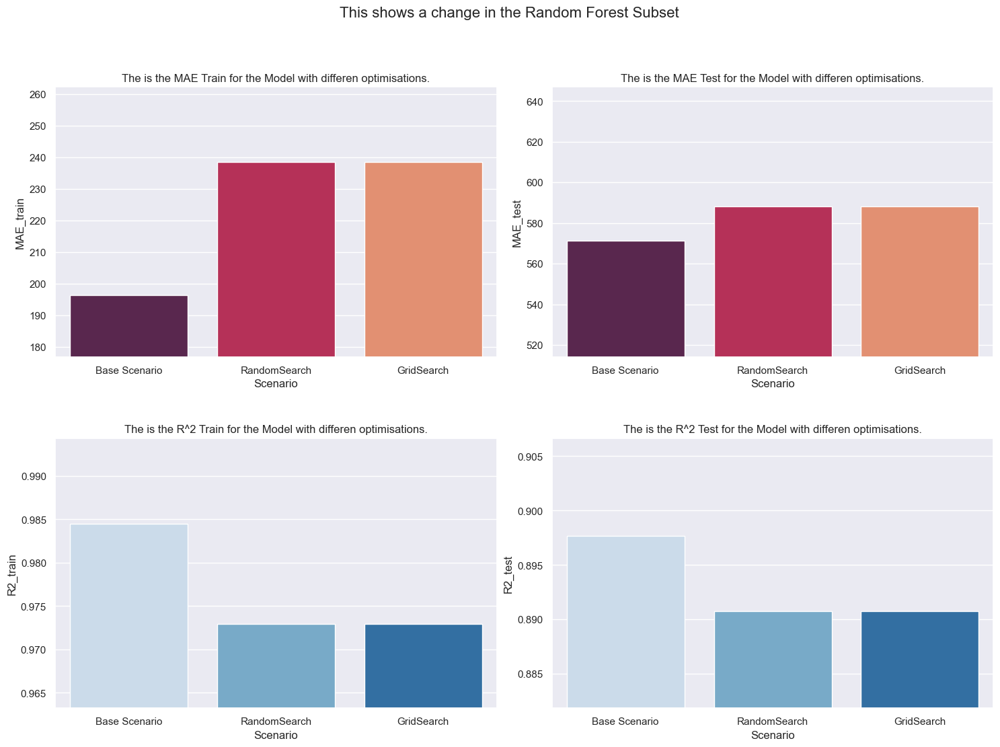

In [101]:
# Run a Function to plot the comparison of the models
plot_bars_comp("Random Forest Subset", comparison_backup)


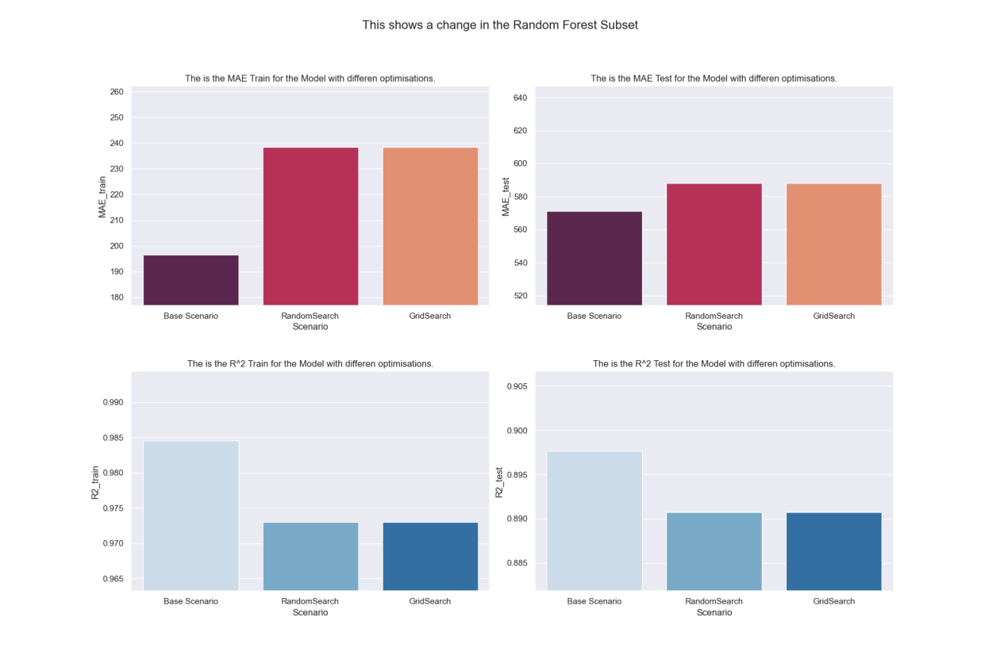

In [102]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("Random Forest Subset")

### Optimisation for the whole Dataset

In [103]:
# for comparison run the optimized parameters of the subset on the whole dataset and look at mae and r2
# fit the data and run the model with selected parameters
forest_grid =RandomForestRegressor(random_state=144, n_jobs = -1, n_estimators= 550, min_samples_split= 2, min_samples_leaf = 1, 
                                        max_features = None, max_depth= None, ccp_alpha =0.2, bootstrap= True)

# fit the data and run the model with new parameters
scenario_fit_evaluate("Random Forest", "GridSearch", forest_grid, Xtrain, ytrain, Xtest, ytest)

                   Model             Scenario   MAE_train    MAE_test  \
0          MLP Regressor        Base Scenario  346.964702  458.804790   
1   MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2   MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3   MLP Regressor Subset           GridSearch  157.127540  939.964346   
4          MLP Regressor           GridSearch  304.198428  441.389594   
5          MLP Regressor  Partly optimisation  415.745568  425.201081   
6          Random Forest        Base Scenario  148.597666  339.997802   
7   Random Forest Subset        Base Scenario  196.444005  571.199575   
8   Random Forest Subset         RandomSearch  238.349159  588.154607   
9   Random Forest Subset           GridSearch  192.292330  563.034369   
10         Random Forest           GridSearch  148.252711  338.585548   

    R2_train   R2_test  
0   0.965150  0.940915  
1   0.991575  0.812095  
2   0.958999  0.835115  
3   0.993650  0.816643 

In [26]:
# Setting up the first Hyperparameters that should be tuned, due to the size of the Dataset only very few
# Number of trees in random forest
n_estimators = [int(x) for x in range(100, 501, 50)]
# Number of features to consider at every split
max_features = [0.25, 0.5, 1.0, None]
# Method to controll complexity 
ccp_alpha = [0, 0.001, 0.01, 0.1, 0.2, 0.3]

param_grid = {"n_estimators": n_estimators,
               "max_features": max_features,
               "ccp_alpha": ccp_alpha}

param_standard = {"n_estimators": 100,
               "max_features": 1.0,
               "ccp_alpha": 0}



In [27]:
# Although they are influencing each other, this is too much for my Comuter, a proper optimization is shown below with a 
# subset and Cross validation takes too much computing power, due to the lage data:
best_n_estimator = optimize_parameter("n_estimators", n_estimators, 1.0 , 0,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2: RandomForestRegressor(n_estimators=value, max_features=value_fix1, ccp_alpha=value_fix2, random_state=144,n_jobs=-1))

best_max_feat = optimize_parameter("max_features", max_features, best_n_estimator, 0,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2: RandomForestRegressor(n_estimators=value_fix1, max_features=value, ccp_alpha=value_fix2, random_state=144,n_jobs=-1))

best_ccp = optimize_parameter("ccp_alpha", ccp_alpha, best_n_estimator, best_max_feat,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2: RandomForestRegressor(n_estimators=value_fix1, max_features=value_fix2, ccp_alpha=value, random_state=144,n_jobs=-1))

print(f"The best MAE Test is given with, n_estimators: {best_n_estimator}, max_features: {best_max_feat}, ccp_alpha: {best_ccp}")
#
# Printing Result: The best MAE Test is given with, n_estimators: 350, max_features: 1.0, ccp_alpha: 0.3
#

The best MAE Test is given with, n_estimators: 100, max_features: 0.25, ccp_alpha: 0


In [104]:
# creating a random forest with the results of GridSearchCV and the subset to look at the mae and r2
forest_partly =RandomForestRegressor(random_state=144, n_jobs = -1, n_estimators= 350, max_features = 1.0, ccp_alpha =0.3)

# fit the data and run the model with new parameters
scenario_fit_evaluate("Random Forest", "Partly optimisation", forest_partly, Xtrain, ytrain, Xtest, ytest)

                   Model             Scenario   MAE_train    MAE_test  \
0          MLP Regressor        Base Scenario  346.964702  458.804790   
1   MLP Regressor Subset        Base Scenario  164.727363  943.799061   
2   MLP Regressor Subset         RandomSearch  422.899468  816.585346   
3   MLP Regressor Subset           GridSearch  157.127540  939.964346   
4          MLP Regressor           GridSearch  304.198428  441.389594   
5          MLP Regressor  Partly optimisation  415.745568  425.201081   
6          Random Forest        Base Scenario  148.597666  339.997802   
7   Random Forest Subset        Base Scenario  196.444005  571.199575   
8   Random Forest Subset         RandomSearch  238.349159  588.154607   
9   Random Forest Subset           GridSearch  192.292330  563.034369   
10         Random Forest           GridSearch  148.252711  338.585548   
11         Random Forest  Partly optimisation  148.602726  338.188603   

    R2_train   R2_test  
0   0.965150  0.940915  


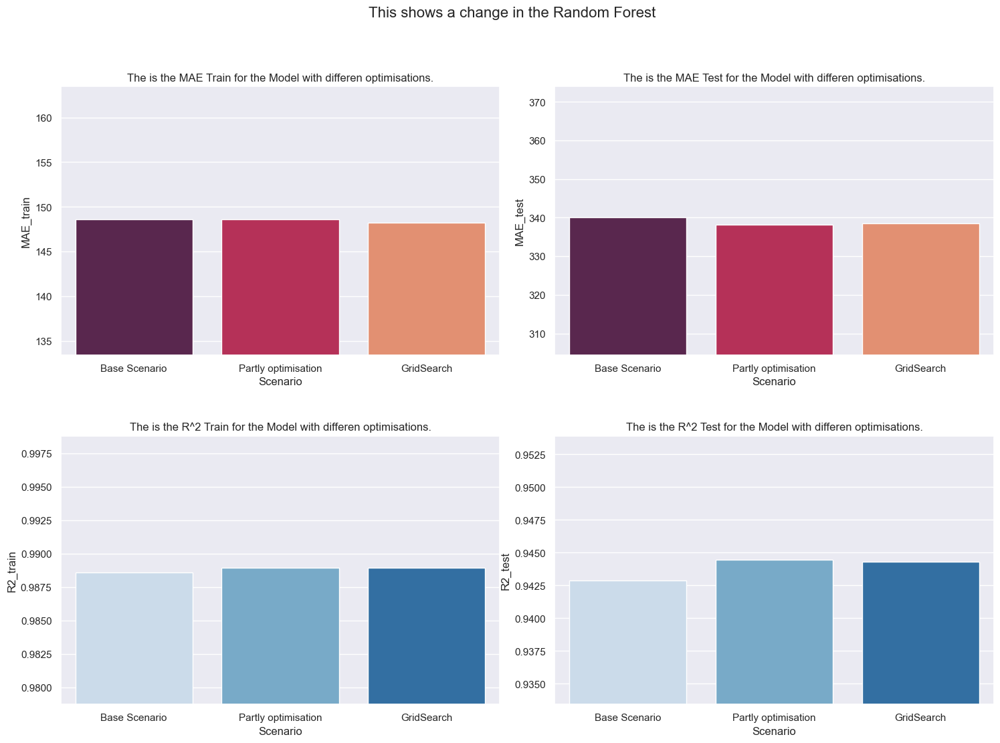

In [105]:
plot_bars_comp("Random Forest", comparison_backup)

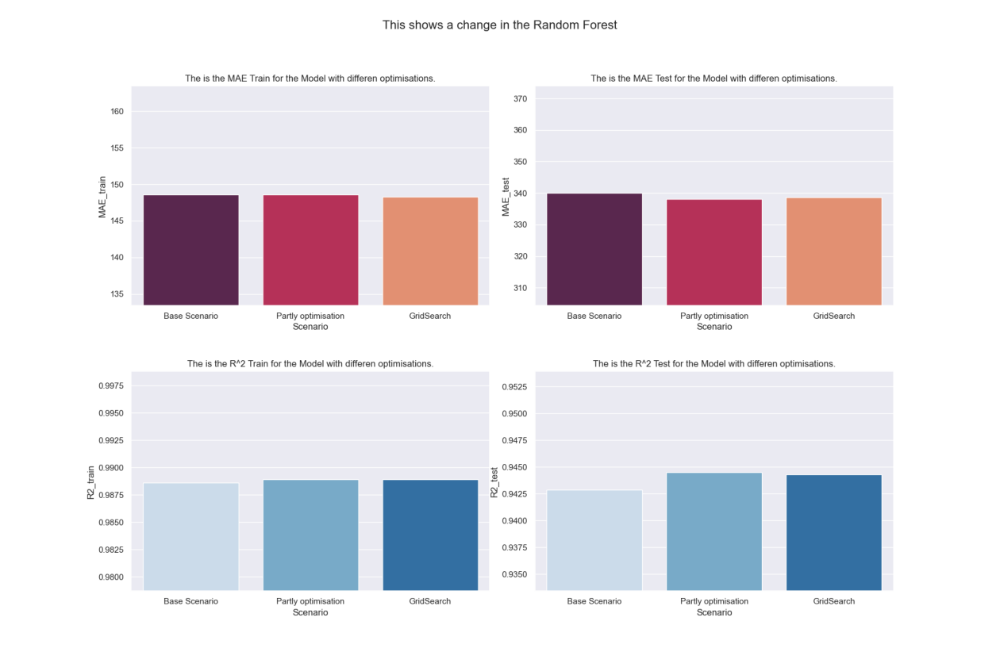

In [106]:
show_images_compa("Random Forest")

# LightGBM

In [225]:
# Importing the data and splitting it into a train and test set to work with
ped = pd.read_csv("data_clean_with_dummies.csv", index_col=0)

# Define a new X with the squared feature k = 0.99, 57+46
X = np.array(ped[ped.columns[57:103]])

# Output to predict
y = ped["pedestrians count"]

# Split the dataset into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(
    X, y, test_size=0.3, random_state=72)

### 1. Establish Base Scenario

##### 1. Python API

In [249]:
#Setting parameters
lgbm_params = {}
# Running the function to get the baseline values
scenario_fit_evaluate_python_api("LGBM", "Base Scenario Python API", lgbm_params, 
    Xtrain, ytrain, Xtest, ytest)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11730
[LightGBM] [Info] Number of data points in the train set: 10750, number of used features: 46
[LightGBM] [Info] Start training from score 2614.380000
  Model                  Scenario   MAE_train    MAE_test  R2_train   R2_test
0  LGBM  Base Scenario Python API  159.050221  346.932964  0.990525  0.948697


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11730
[LightGBM] [Info] Number of data points in the train set: 10750, number of used features: 46
[LightGBM] [Info] Start training from score 2614.380000


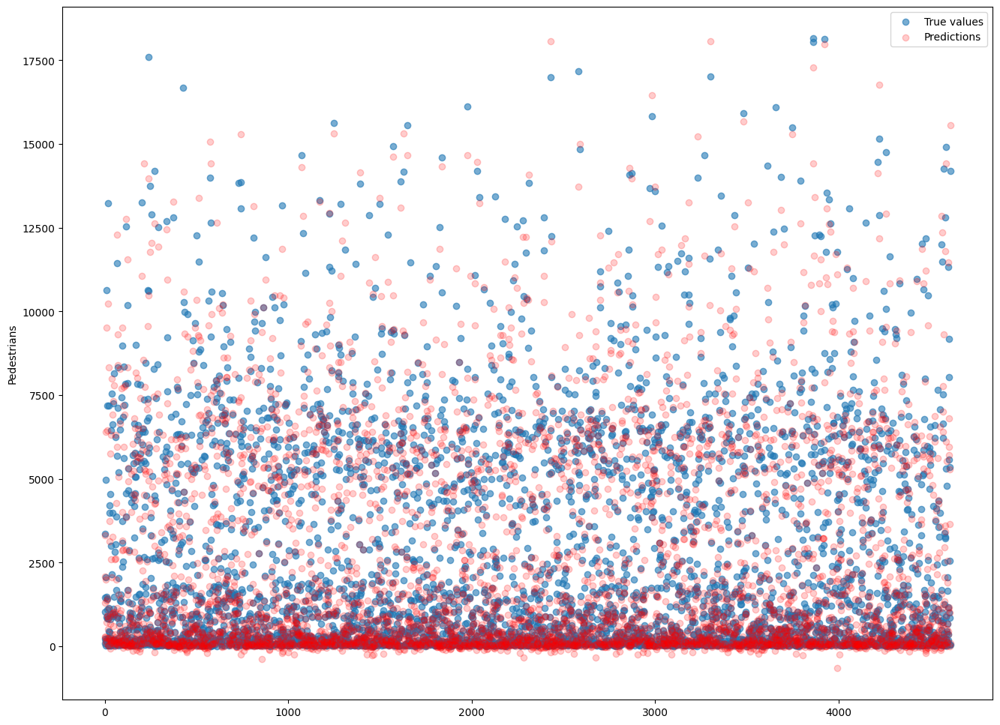

In [17]:
# Plot the Predictions and the Actual data for the Test set to get a first impression
plot_baseline_python_api(lgbm_params, Xtest, ytest)

##### 2. LGBMRegressor

In [251]:
# Initialize a Random Forest with the default parameters 
LGBM_Regressor = lgb.LGBMRegressor()
# Running the function to get the baseline values
scenario_fit_evaluate_lgbmreg("LGBM", "Base Scenario LGBMRegressor", LGBM_Regressor, 
    Xtrain, ytrain, Xtest, ytest)

  Model                     Scenario   MAE_train    MAE_test  R2_train  \
0  LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1  LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   

    R2_test  
0  0.948697  
1  0.951250  


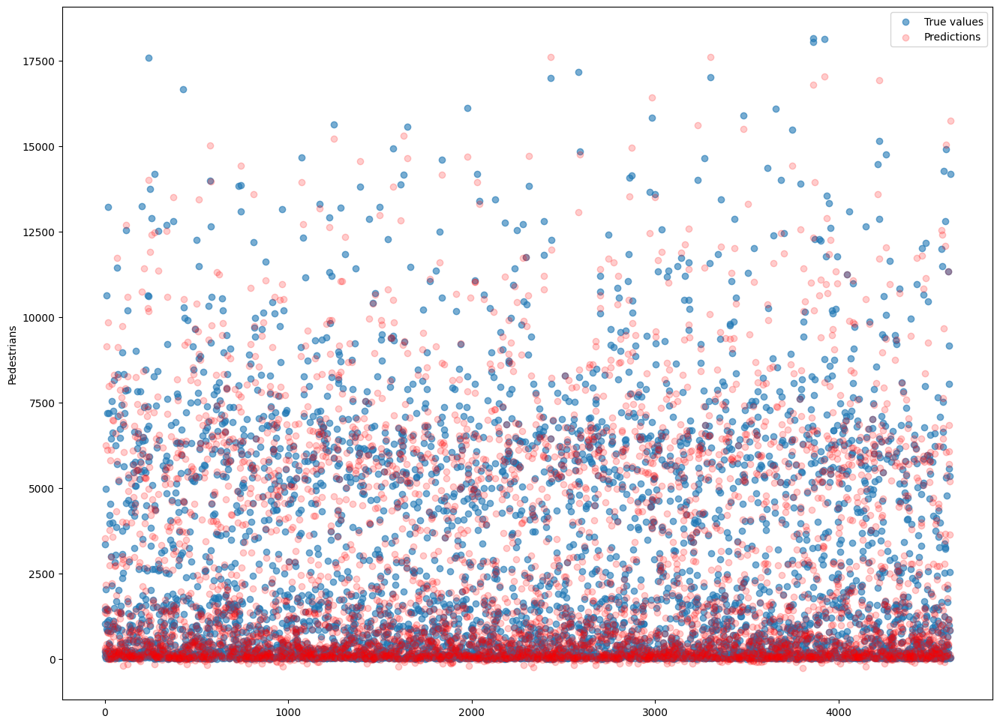

In [21]:
# Plot the Predictions and the Actual data for the Test set to get a first impression
plot_baseline(LGBM_Regressor, Xtest, ytest)

### 2. Analyze the Influence of the Different Parameters

In [238]:
# conduncting the parameter analysis on the most used parameters for optimization
#num_leaves: sets the maximum number of nodes per tree, Default = 31
num_leaves = [int(x) for x in range(25, 700, 10)]
#learning_rate,  Defalut = 0.1
learning_rate = [x for x in np.linspace(0.1, 0.9, 50)]
#The max_depth of a tree in LGBM is defined as the longest path between the root node and the leaf node  Defalut = -1, only measurabel, when using high numbers
max_depth = [int(x) for x in range(10, 100, 2)]
#The min_data_in_leaf describes the minimum number of observations that must fall into a tree node for it to be added, Default = 20
min_data_in_leaf = [int(x) for x in range(10, 100, 10)]

#Create a dict with all parameters
all_parameters_dict = {"num_leaves":num_leaves, "max_depth":max_depth, "learning_rate":learning_rate,
                        "min_data_in_leaf":min_data_in_leaf}

In [244]:
# apply the function to the different parameters
test_parameter_no_neg("LGBM", "num_leaves", num_leaves, lambda value: lgb.LGBMRegressor(num_leaves=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("LGBM", "max_depth", max_depth, lambda value: lgb.LGBMRegressor(max_depth=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("LGBM", "learning_rate", learning_rate, lambda value: lgb.LGBMRegressor(learning_rate=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("LGBM", "min_data_in_leaf", min_data_in_leaf, lambda value: lgb.LGBMRegressor(min_data_in_leaf=value, random_state=144,n_jobs=-1))

# merging results into dataframe and safe it as csv to work with it later on
results = results.reset_index().drop(columns="index")
results.to_csv("param_testing.csv", sep=";", index=False)



KeyboardInterrupt: 

In [234]:
# reading the created dataframe and have a look at it to plot it later for the analysis (backup)
param_testing = pd.read_csv("outputs_backup/param_testing.csv", sep=";")
param_testing

,Model,Parameter,ParameterValue,MaeTrain,MaeTest,R2Train,R2Test
0,MLP Regressor,hidden_layer_size,"(100,)",347.696832,441.015175,0.964892,0.943029
1,MLP Regressor,hidden_layer_size,"(32, 64, 32)",297.319744,429.473338,0.972019,0.931705
2,MLP Regressor,hidden_layer_size,"(64, 128, 64)",297.511867,434.913581,0.973874,0.927148
3,MLP Regressor,hidden_layer_size,"(32, 64, 128, 64, 32)",244.434975,447.374537,0.979625,0.919673
4,MLP Regressor,activation,relu,347.696832,441.015175,0.964892,0.943029
...,...,...,...,...,...,...,...
436,LGBM,min_data_in_leaf,50,323.602930,390.178977,0.964925,0.945154
437,LGBM,min_data_in_leaf,60,326.178668,392.810118,0.963902,0.946082
438,LGBM,min_data_in_leaf,70,335.444667,401.299877,0.961807,0.942236
439,LGBM,min_data_in_leaf,80,344.234735,406.241955,0.960077,0.942352


C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\2142620631.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTrain_std"] = standardize_df_col(plot_data["MaeTrain"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\2142620631.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTest_std"] = standardize_df_col(plot_data["MaeTest"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\2142620631.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

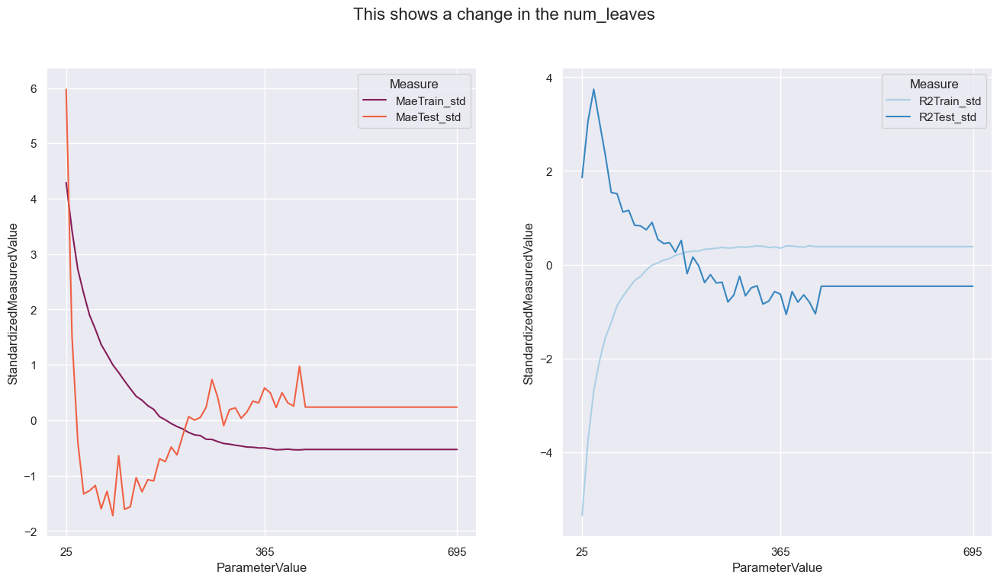

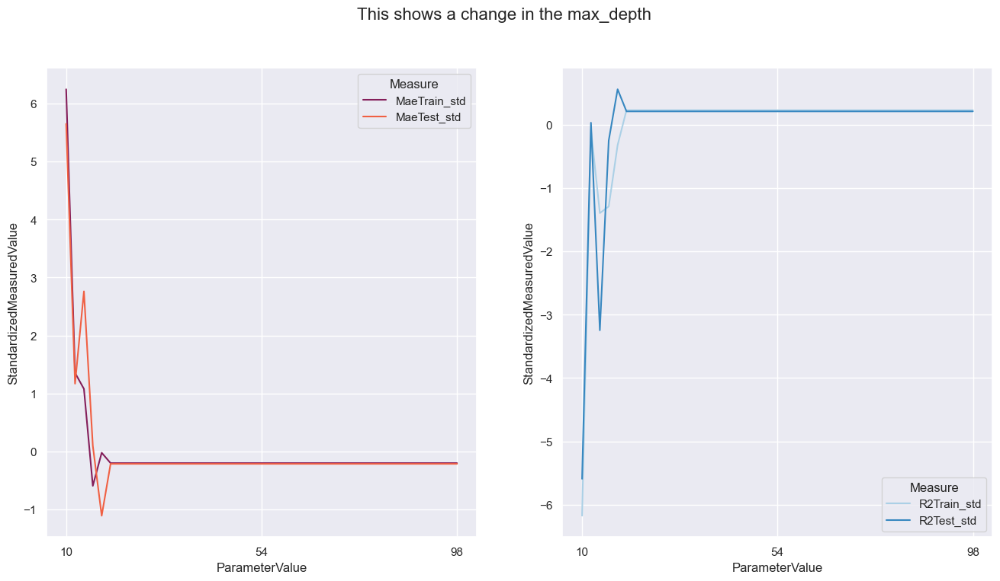

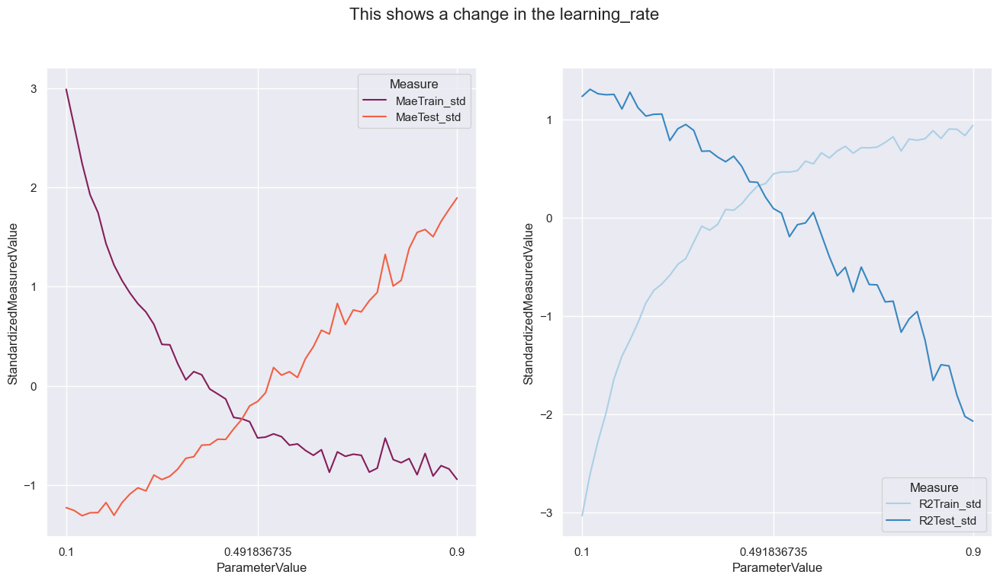

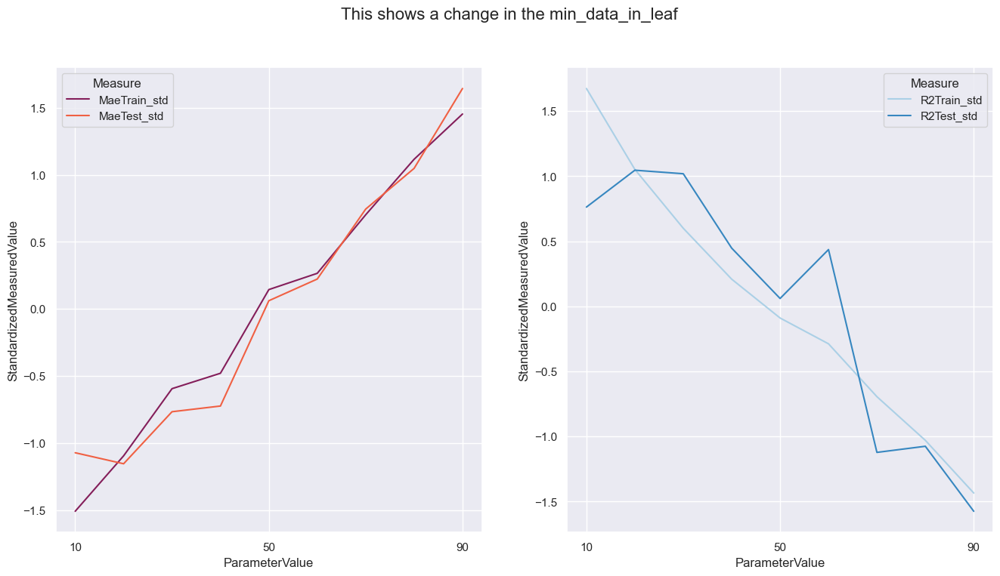

In [236]:
# apply the function to wanted parameters for comparison
plot_lines("LGBM", "num_leaves")
plot_lines("LGBM", "max_depth")
plot_lines("LGBM", "learning_rate")
plot_lines("LGBM", "min_data_in_leaf")


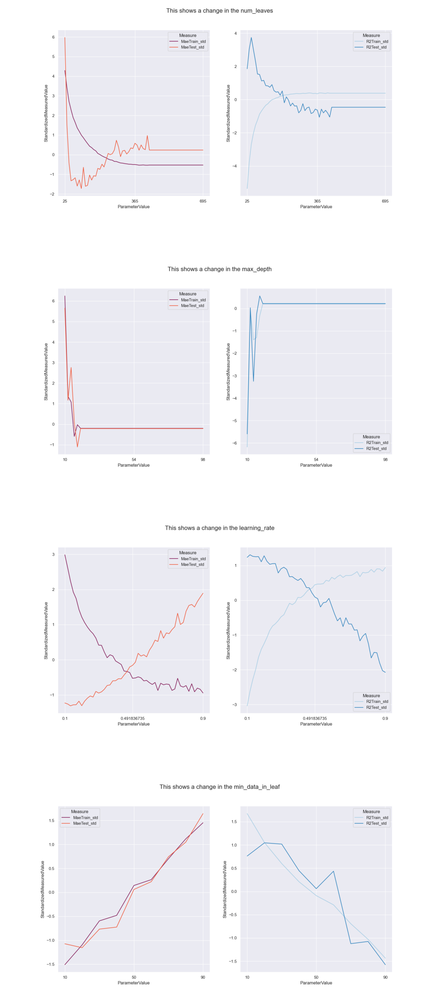

In [240]:
# Define a function to create figure frome saved pictures
show_images_parameter("LGBM", all_parameters_dict)

### 3. Optimize the Hyperparameters with the Findings above

In [22]:
# Subsetting the data for the optimization of the hyperparameters
ped_subset = ped.sample(frac=0.1, random_state=1)

# Define a new X of the subset with the squared feature k = 0.99, 57+46
X_subset = np.array(ped_subset[ped_subset.columns[57:103]])

# Subset of the output to predict
y_subset = ped_subset["pedestrians count"]

# Split the subset into train and test sets
Xtrain_subset, Xtest_subset, ytrain_subset, ytest_subset = train_test_split(
    X_subset, y_subset, test_size=0.3, random_state=72)

### Establish baseline (with Subset)

##### 1. Python API Baseline

In [252]:
# Running the function to get the baseline values
scenario_fit_evaluate_python_api("LGBM Subset", "Base Scenario Python API", lgbm_params, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11730
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 46
[LightGBM] [Info] Start training from score 2505.162791
         Model                     Scenario   MAE_train    MAE_test  R2_train  \
0         LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1         LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   
2  LGBM Subset     Base Scenario Python API   11.366746  625.012415  0.999837   

    R2_test  
0  0.948697  
1  0.951250  
2  0.901195  


##### 2. LGBMRegressor

In [253]:
# Running the function to get the baseline values
scenario_fit_evaluate_lgbmreg("LGBM Subset", "Base Scenario LGBMRegressor", LGBM_Regressor, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

         Model                     Scenario   MAE_train    MAE_test  R2_train  \
0         LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1         LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   
2  LGBM Subset     Base Scenario Python API   11.366746  625.012415  0.999837   
3  LGBM Subset  Base Scenario LGBMRegressor  141.845840  625.651454  0.993160   

    R2_test  
0  0.948697  
1  0.951250  
2  0.901195  
3  0.896809  


#### RandomizedSearchCV

In [ ]:
import pandas as pd
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV

params = {"num_leaves": [int(x) for x in range(25, 120, 10)],
        "learning_rate": [x for x in np.linspace(0.01, 0.05, 15)],
        "max_depth": [int(x) for x in range(4, 25, 2)],
        "min_data_in_leaf": [int(x) for x in range(1, 20, 2)],
        }
        # conduncting the parameter analysis on the most used parameters for optimization


lgbr = lgb.LGBMRegressor(seed = 20)
clf = RandomizedSearchCV(estimator=lgbr,
                         param_distributions=params,
                         n_iter=5000,
                         verbose=1,
                         cv = 4)

clf.fit(X_subset, y_subset)

print("Best parameters:", clf.best_params_)


In [ ]:
#dict for the best parameter
best_parameter_randCV = {'num_leaves': 65,
 'min_data_in_leaf': 19,
 'max_depth': 14,
 'learning_rate': 0.05}

##### 1. Python API

In [254]:
#rename the dict for the best parameter
lgbm_params_randCV = {'num_leaves': 65,
 'min_data_in_leaf': 19,
 'max_depth': 14,
 'learning_rate': 0.05}

# Running the function to get the baseline values
scenario_fit_evaluate_python_api("LGBM Subset", "RandomSearch Python API", lgbm_params_randCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11730
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 46
[LightGBM] [Info] Start training from score 2505.162791
         Model                     Scenario   MAE_train    MAE_test  R2_train  \
0         LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1         LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   
2  LGBM Subset     Base Scenario Python API   11.366746  625.012415  0.999837   
3  LGBM Subset  Base Scenario LGBMRegressor  141.845840  625.651454  0.993160   
4  LGBM Subset      RandomSearch Python API   11.366746  625.012415  0.999837   

    R2_test  
0  0.948697  
1  0.951250  
2  0.901195  
3  0.896809  
4  0.901195  


##### 2. LGBMRegressor

In [255]:
# tialize a Random Forest with the default parameters 
LGBMRegressor_randCV = lgb.LGBMRegressor(num_leaves = 65, min_data_in_leaf = 19,
                                         max_depth = 14, learning_rate = 0.05)

# Running the function to get the baseline values
scenario_fit_evaluate_lgbmreg("LGBM Subset", "RandomSearch LGBMRegressor", LGBMRegressor_randCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

[LightGBM] [Warning] min_data_in_leaf is set=19, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=19
         Model                     Scenario   MAE_train    MAE_test  R2_train  \
0         LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1         LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   
2  LGBM Subset     Base Scenario Python API   11.366746  625.012415  0.999837   
3  LGBM Subset  Base Scenario LGBMRegressor  141.845840  625.651454  0.993160   
4  LGBM Subset      RandomSearch Python API   11.366746  625.012415  0.999837   
5  LGBM Subset   RandomSearch LGBMRegressor  234.515612  623.507950  0.978647   

    R2_test  
0  0.948697  
1  0.951250  
2  0.901195  
3  0.896809  
4  0.901195  
5  0.891091  


#### GridSearch CV

In [ ]:
params = {"num_leaves": [int(x) for x in range(60, 80)],
          "learning_rate": [x for x in np.linspace(0.03, 0.08, 5)],
          "max_depth": [int(x) for x in range(10, 18)],
          "min_data_in_leaf": [int(x) for x in range(15, 22)]}
        # conduncting the parameter analysis on the most used parameters for optimization


lgbr = lgb.LGBMRegressor(seed = 20)
clf = GridSearchCV(estimator=lgbr, 
                   param_grid=params,
                   verbose=1,
                   cv = 5)

clf.fit(X_subset, y_subset)

print("Best parameters:", clf.best_params_)
#


In [ ]:
#dict for the best parameter
best_parameter_gridCV = {'learning_rate': 0.08,
 'max_depth': 10,
 'min_data_in_leaf': 21,
 'num_leaves': 60}

##### 1. Python API

In [256]:
#rename the dict for the best parameter
lgbm_params_gridCV = {'learning_rate': 0.08,
 'max_depth': 10,
 'min_data_in_leaf': 21,
 'num_leaves': 60}

# Running the function to get the baseline values
scenario_fit_evaluate_python_api("LGBM Subset", "GridSearch Python API", lgbm_params_gridCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11730
[LightGBM] [Info] Number of data points in the train set: 1075, number of used features: 46
[LightGBM] [Info] Start training from score 2505.162791
         Model                     Scenario   MAE_train    MAE_test  R2_train  \
0         LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1         LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   
2  LGBM Subset     Base Scenario Python API   11.366746  625.012415  0.999837   
3  LGBM Subset  Base Scenario LGBMRegressor  141.845840  625.651454  0.993160   
4  LGBM Subset      RandomSearch Python API   11.366746  625.012415  0.999837   
5  LGBM Subset   RandomSearch LGBMRegressor  234.515612  623.507950  0.978647   
6  LGBM Subset        GridSearch Python API   11.366746  625.012415  0.999837   

   

##### 2. LGBMRegressor

In [257]:
# Initialize a Random Forest with the default parameters 
LGBMRegressor_gridCV = lgb.LGBMRegressor(num_leaves = 60, min_data_in_leaf = 21,
                                         max_depth = 10, learning_rate = 0.08)

# Running the function to get the baseline values
scenario_fit_evaluate_lgbmreg("LGBM Subset", "GridSearch LGBMRegressor", LGBMRegressor_gridCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=21
         Model                     Scenario   MAE_train    MAE_test  R2_train  \
0         LGBM     Base Scenario Python API  159.050221  346.932964  0.990525   
1         LGBM  Base Scenario LGBMRegressor  285.831105  356.186954  0.972580   
2  LGBM Subset     Base Scenario Python API   11.366746  625.012415  0.999837   
3  LGBM Subset  Base Scenario LGBMRegressor  141.845840  625.651454  0.993160   
4  LGBM Subset      RandomSearch Python API   11.366746  625.012415  0.999837   
5  LGBM Subset   RandomSearch LGBMRegressor  234.515612  623.507950  0.978647   
6  LGBM Subset        GridSearch Python API   11.366746  625.012415  0.999837   
7  LGBM Subset     GridSearch LGBMRegressor  209.455210  620.857019  0.985593   

    R2_test  
0  0.948697  
1  0.951250  
2  0.901195  
3  0.896809  
4  0.901195  
5  0.891091  
6  0.901195  
7  0.895172  


## Comparing the results of the Models with Subsets

In [270]:
# reading the created dataframe and have a look at it to plot it later for the analysis
# Using the Backup
comparison_backup = pd.read_csv("outputs_backup/comparison_mae_r2.csv", sep=";")
comparison_backup

,Model,Scenario,MAE_train,MAE_test,R2_train,R2_test
0,MLP Regressor,Base Scenario,346.964702,458.804790,0.965150,0.940915
1,MLP Regressor Subset,Base Scenario,164.727363,943.799061,0.991575,0.812095
2,MLP Regressor Subset,RandomSearch,422.899468,816.585346,0.958999,0.835115
3,MLP Regressor Subset,GridSearch,157.127540,939.964346,0.993650,0.816643
4,MLP Regressor,GridSearch,304.198428,441.389594,0.970655,0.932543
5,MLP Regressor,Partly optimisation,415.745568,425.201080,0.939840,0.940928
6,Random Forest,Base Scenario,148.597667,339.997802,0.988607,0.942855
7,Random Forest Subset,Base Scenario,196.444005,571.199575,0.984530,0.897685
8,Random Forest Subset,RandomSearch,238.349159,588.154607,0.972960,0.890751
9,Random Forest Subset,GridSearch,238.349159,588.154607,0.972960,0.890751


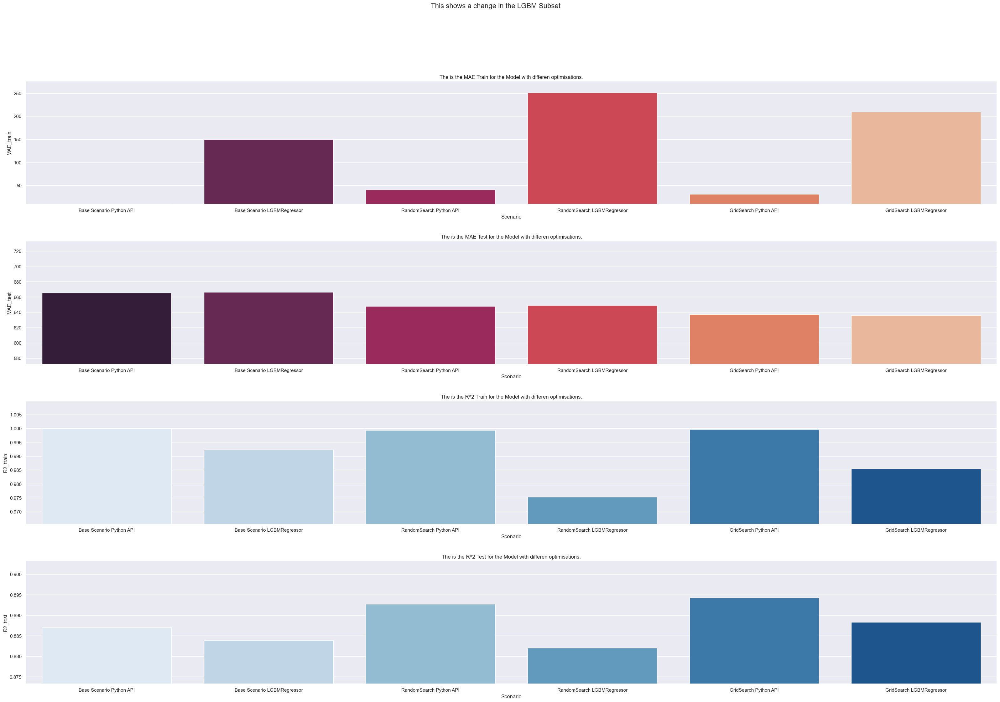

In [271]:
# Run a Function to plot the comparison of the models
plot_bars_comp("LGBM Subset", comparison_backup)

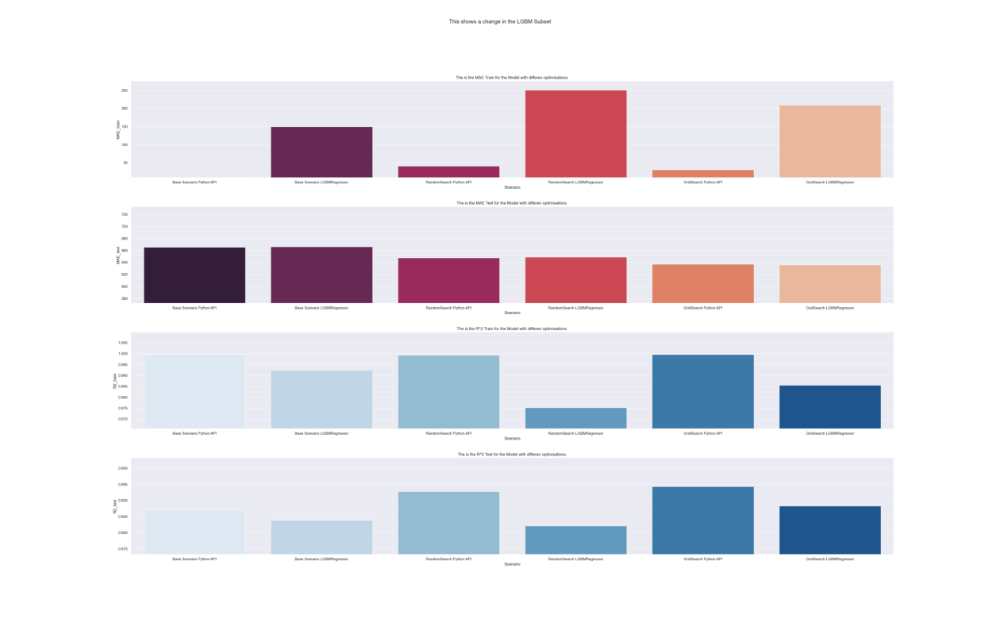

In [272]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("LGBM Subset")

### Optimisation for the whole Dataset

In [273]:
# conduncting the parameter analysis on the most used parameters for optimization
# Setting up the first Hyperparameters that should be tuned, due to the size of the Dataset only very few

#num_leaves: sets the maximum number of nodes per tree, Default = 31
num_leaves = [57, 60, 63, 65, 67]
#The max_depth of a tree in LGBM is defined as the longest path between the root node and the leaf node  Defalut = -1, only measurabel, when using high numbers
max_depth = [8, 10, 12, 14, 16]
#The min_data_in_leaf describes the minimum number of observations that must fall into a tree node for it to be added, Default = 20
min_data_in_leaf = [15, 17, 19, 20, 21]
#learning_rate,  Defalut = 0.1
learning_rate = [0.03, 0.05, 0.08, 0.1, 0.13]


param_grid = {"num_leaves": num_leaves,
               "max_depth": max_depth,
               "min_data_in_leaf": min_data_in_leaf,
               "learning_rate": learning_rate}

param_standard = {"num_leaves": 31,
               "max_depth": -1,
               "min_data_in_leaf": 20,
               "learning_rate": 0.1}



In [ ]:
# Although they are influencing each other, this is too much for my Comuter, a proper optimization is shown below with a 
# subset and Cross validation takes too much computing power, due to the lage data:

best_num_leaves = optimize_parameter_no_neg("num_leaves", num_leaves, -1, 20, 0.1,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3: LGBMRegressor(num_leaves=value, max_depth=value_fix1, min_data_in_leaf=value_fix2, learning_rate=value_fix3, random_state=144,n_jobs=-1))

best_max_depth = optimize_parameter_no_neg("max_depth", max_depth, best_num_leaves, 20, 0.1,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3: LGBMRegressor(num_leaves=value_fix1, max_depth=value, min_data_in_leaf=value_fix2, learning_rate=value_fix3, random_state=144,n_jobs=-1))

best_min_data_in_leaf = optimize_parameter_no_neg("min_data_in_leaf", min_data_in_leaf, best_num_leaves, best_max_depth, 0.1,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3: LGBMRegressor(num_leaves=value_fix1, max_depth=value_fix2, min_data_in_leaf=value, learning_rate=value_fix3, random_state=144,n_jobs=-1))

best_lr = optimize_parameter_no_neg("learning_rate", learning_rate, best_num_leaves, best_max_depth, best_min_data_in_leaf,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3: LGBMRegressor(num_leaves=value_fix1, max_depth=value_fix2, min_data_in_leaf=value_fix3, learning_rate=value, random_state=144,n_jobs=-1))

print(f"The best MAE Test is given with, num_leaves: {best_num_leaves}, max_depth: {best_max_depth}, min_data_in_leaf: {best_min_data_in_leaf}, learning_rate: {best_lr}.")
#
# Printing Result: The best MAE Test is given with, num_leaves: 60, learning_rate: 0.03, max_depth: 10, min_data_in_leaf: 17.
#

In [274]:
params_partly = {"num_leaves": 57, "max_depth": 8, "min_data_in_leaf": 15, "learning_rate": 0.03}
# Running the function to get the baseline values
scenario_fit_evaluate_python_api("LGBM", "Partly Optimisation Python API", params_partly, 
    Xtrain, ytrain, Xtest, ytest)


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11730
[LightGBM] [Info] Number of data points in the train set: 10750, number of used features: 46
[LightGBM] [Info] Start training from score 2614.380000
         Model                        Scenario   MAE_train    MAE_test  \
0         LGBM        Base Scenario Python API  159.050221  346.932964   
1         LGBM     Base Scenario LGBMRegressor  285.831105  356.186954   
2  LGBM Subset        Base Scenario Python API   11.366746  625.012415   
3  LGBM Subset     Base Scenario LGBMRegressor  141.845840  625.651454   
4  LGBM Subset         RandomSearch Python API   11.366746  625.012415   
5  LGBM Subset      RandomSearch LGBMRegressor  234.515612  623.507950   
6  LGBM Subset           GridSearch Python API   11.366746  625.012415   
7  LGBM Subset        GridSearch LGBMRegressor  209.455210 

In [275]:
params_LGBMReg_partly = LGBMRegressor(num_leaves = 60, learning_rate = 0.03, max_depth = 10, min_data_in_leaf = 17)
# Running the function to get the baseline values
scenario_fit_evaluate_lgbmreg("LGBM", "Partly Optimisation LGBMRegressor", params_LGBMReg_partly, 
    Xtrain, ytrain, Xtest, ytest)

[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=17
          Model                           Scenario   MAE_train    MAE_test  \
0          LGBM           Base Scenario Python API  159.050221  346.932964   
1          LGBM        Base Scenario LGBMRegressor  285.831105  356.186954   
2   LGBM Subset           Base Scenario Python API   11.366746  625.012415   
3   LGBM Subset        Base Scenario LGBMRegressor  141.845840  625.651454   
4   LGBM Subset            RandomSearch Python API   11.366746  625.012415   
5   LGBM Subset         RandomSearch LGBMRegressor  234.515612  623.507950   
6   LGBM Subset              GridSearch Python API   11.366746  625.012415   
7   LGBM Subset           GridSearch LGBMRegressor  209.455210  620.857019   
8          LGBM     Partly Optimisation Python API  159.050221  346.932964   
9          LGBM  Partly Optimisation LGBMRegressor  376.423987  422.233718   
10         LGBM  Par

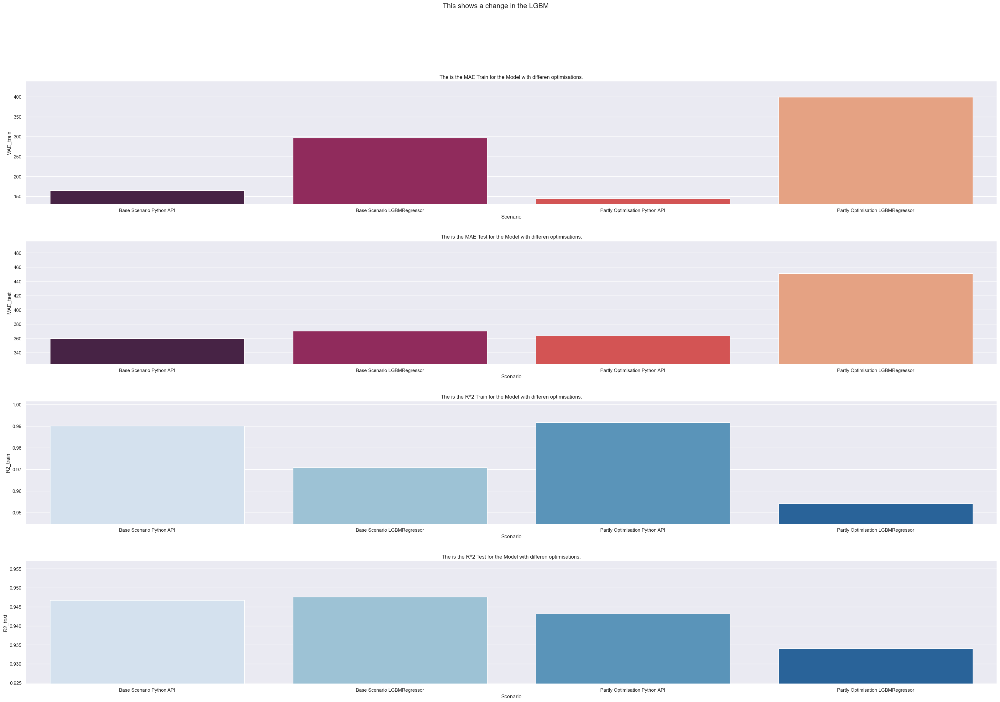

In [276]:
plot_bars_comp("LGBM", comparison_backup)

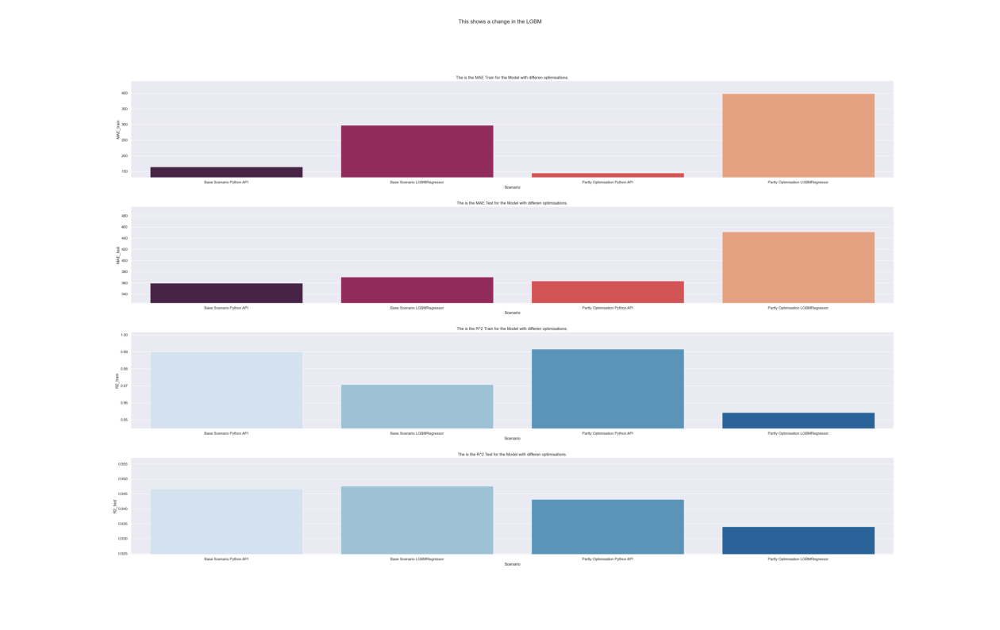

In [278]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("LGBM")

# XGBoost

### Establish baseline

##### 1. Python API

In [280]:
#Import lightgbm
import xgboost as xgb

#Setting parameters
xgb_params = {}

In [282]:
# Running the function to get the baseline values
scenario_fit_evaluate_python_api_xgb("XGBoost", "Base Scenario Python API", xgb_params, 
    Xtrain, ytrain, Xtest, ytest)

     Model                  Scenario  MAE_train    MAE_test  R2_train  \
0  XGBoost  Base Scenario Python API  74.749916  378.152291  0.995945   

    R2_test  
0  0.938387  


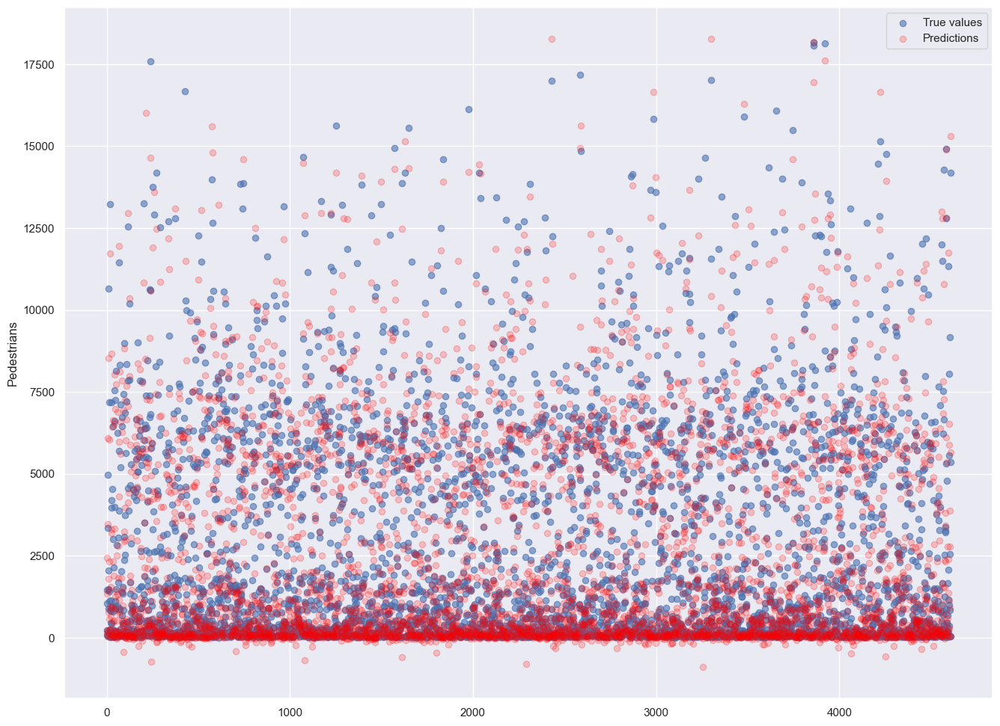

In [283]:
# Plot the Predictions and the Actual data for the Test set to get a first impression
plot_baseline_python_api_xgb(xgb_params, Xtest, ytest)

##### 2. Scikit-Learn API

In [286]:
# Initialize a Random Forest with the default parameters 
XGB_Regressor = xgb.XGBRegressor()
# Running the function to get the baseline values
scenario_fit_evaluate_regressor("XGBoost", "Base Scenario LGBMRegressor", XGB_Regressor, 
    Xtrain, ytrain, Xtest, ytest)

     Model                     Scenario   MAE_train    MAE_test  R2_train  \
0  XGBoost     Base Scenario Python API   74.749916  378.152291  0.995945   
1  XGBoost  Base Scenario LGBMRegressor  216.463624  379.302584  0.986507   

    R2_test  
0  0.938387  
1  0.943499  


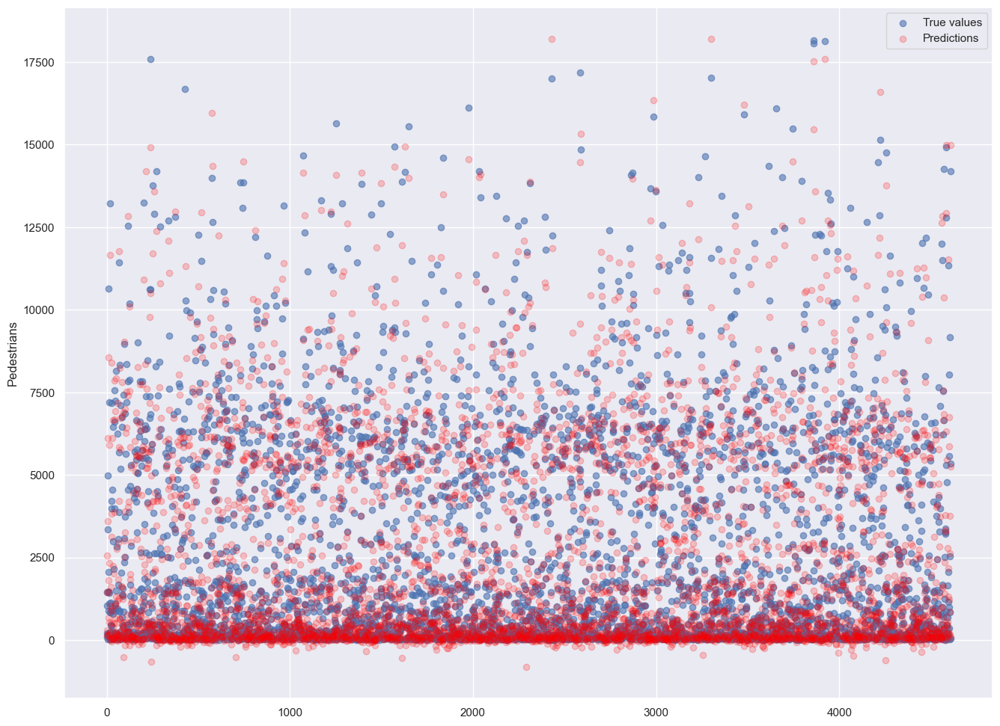

In [287]:
# Plot the Predictions and the Actual data for the Test set to get a first impression
plot_baseline(XGB_Regressor, Xtest, ytest)

### Analyse the Influence of the Different Parameters

##### Creating lists for possible values of hyperparameter

In [356]:
#eta: learning rate,  Defalut = 0.1
eta = [x for x in np.linspace(0.01, 0.2, 40)]
#The max_depth of a tree in Random Forest is Maximum tree depth for base learners, Defalut = 6
max_depth = [int(x) for x in range(5, 200, 5)]
# This is the Minimum sum of instance weight(hessian) needed in a child,  Defalut = 3
min_child_weight = [int(x) for x in range(1, 150, 10)]
# reg_lambda: L2 regularization term on weights, default = 1
reg_lambda = [x for x in np.linspace(0.01, 0.9, 25)]
#reg_aplha: L1 regularization term on weights, default = 0
reg_alpha = [int(x) for x in range(20, 150, 7)]

#Create a dict with all parameters
all_parameters_dict = { "min_child_weight":min_child_weight, "eta":eta, "max_depth":max_depth, 
                        "reg_lambda" : reg_lambda, "reg_alpha" : reg_alpha}

In [ ]:

# apply the function to the different parameters
test_parameter_no_neg("XGBoost", "min_child_weight", min_child_weight, lambda value: xgb.XGBRegressor(min_child_weight=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("XGBoost", "eta", eta, lambda value: xgb.XGBRegressor(eta=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("XGBoost", "max_depth", max_depth, lambda value: xgb.XGBRegressor(max_depth=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("XGBoost", "reg_lambda", reg_lambda, lambda value: xgb.XGBRegressor(reg_lambda=value, random_state=144,n_jobs=-1))
test_parameter_no_neg("XGBoost", "reg_alpha", reg_alpha, lambda value: xgb.XGBRegressor(reg_alpha=value, random_state=144,n_jobs=-1))

# merging results into dataframe and safe it as csv to work with it later on
results = results.reset_index().drop(columns="index")
results.to_csv("outputs/param_testing.csv", sep=";", index=False)



In [342]:
# reading the created dataframe and have a look at it to plot it later for the analysis
param_testing = pd.read_csv("outputs_backup/param_testing.csv", sep=";")
param_testing

,Model,Parameter,ParameterValue,MaeTrain,MaeTest,R2Train,R2Test
0,MLP Regressor,hidden_layer_size,"(100,)",347.696832,441.015175,0.964892,0.943029
1,MLP Regressor,hidden_layer_size,"(32, 64, 32)",297.319744,429.473338,0.972019,0.931705
2,MLP Regressor,hidden_layer_size,"(64, 128, 64)",297.511867,434.913581,0.973874,0.927148
3,MLP Regressor,hidden_layer_size,"(32, 64, 128, 64, 32)",244.434975,447.374537,0.979625,0.919673
4,MLP Regressor,activation,relu,347.696832,441.015175,0.964892,0.943029
...,...,...,...,...,...,...,...
574,XGBoost,reg_alpha,118,205.452598,377.914050,0.987959,0.942433
575,XGBoost,reg_alpha,125,204.813405,378.590579,0.987925,0.941044
576,XGBoost,reg_alpha,132,208.734329,378.854142,0.987365,0.940950
577,XGBoost,reg_alpha,139,207.663434,383.651855,0.987695,0.940475


C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\4224547287.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTrain_std"] = standardize_df_col(plot_data["MaeTrain"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\4224547287.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["MaeTest_std"] = standardize_df_col(plot_data["MaeTest"])
C:\Users\Biebert\AppData\Local\Temp\ipykernel_27112\4224547287.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

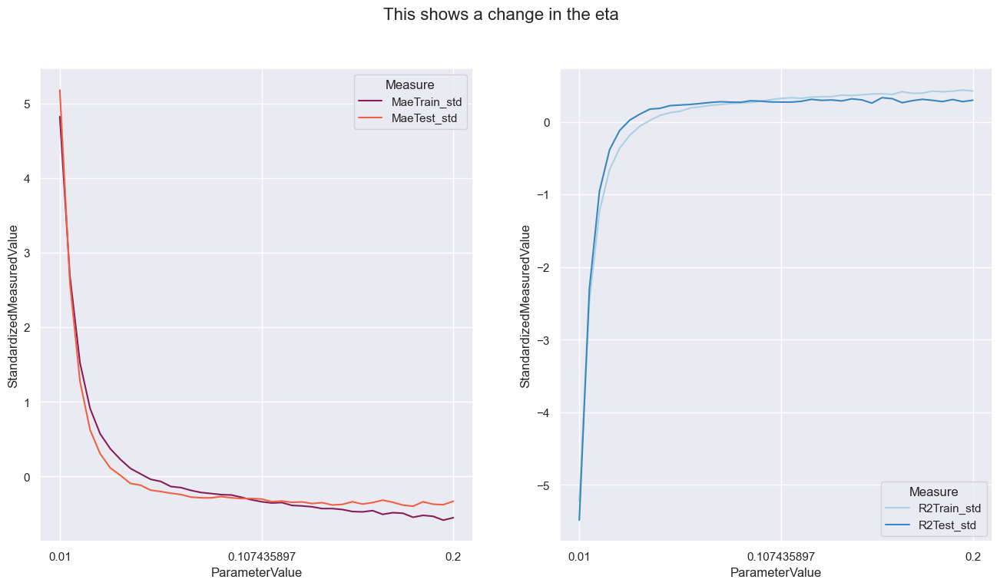

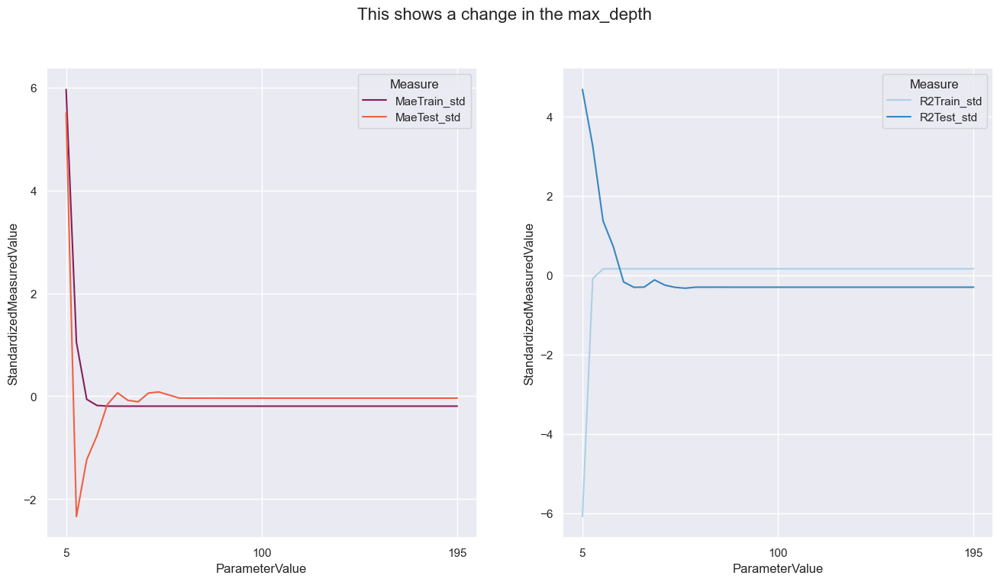

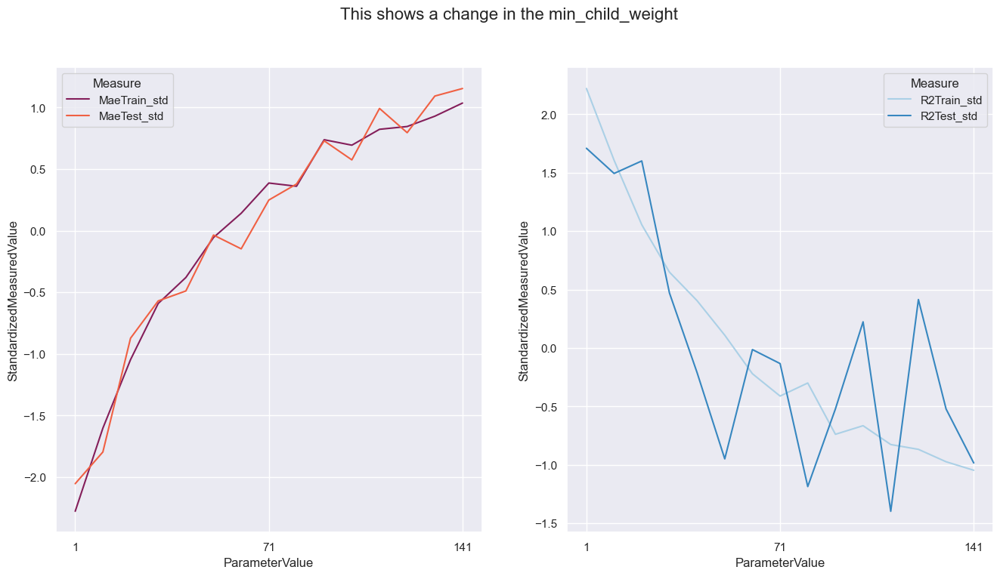

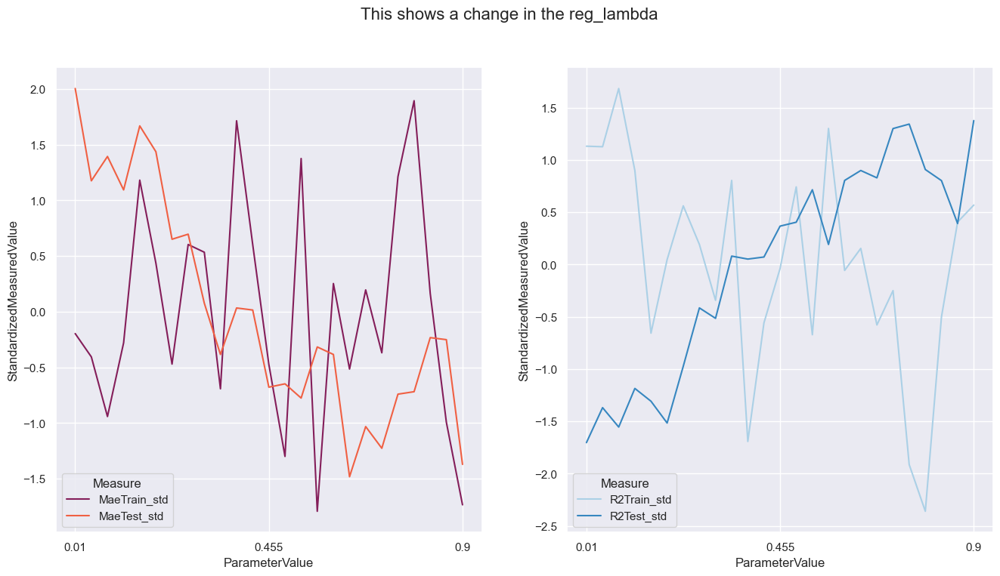

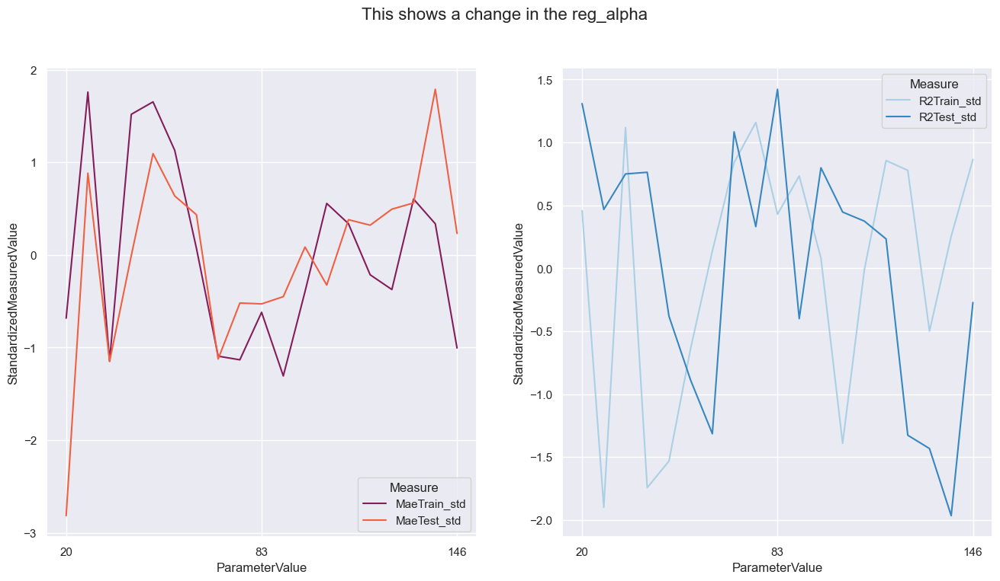

In [350]:
# apply the function to wanted parameters for comparison
plot_lines("XGBoost", "eta")
plot_lines("XGBoost", "max_depth")
plot_lines("XGBoost", "min_child_weight")
plot_lines("XGBoost", "reg_lambda")
plot_lines("XGBoost", "reg_alpha")


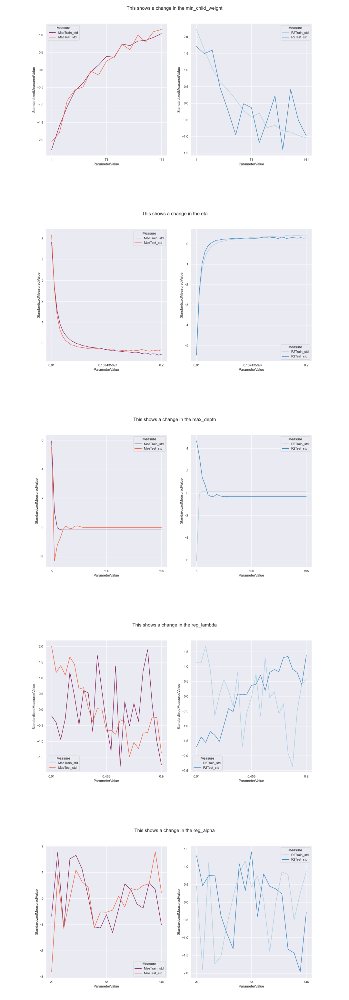

In [357]:
show_images_parameter("XGBoost", all_parameters_dict)

## Hyperparameter tuning (with Subset)

In [ ]:
# Subsetting the data for the optimization of the hyperparameters
ped_subset = ped.sample(frac=0.1, random_state=1)

# Define a new X of the subset with the squared feature k = 0.99, 57+46
X_subset = np.array(ped_subset[ped_subset.columns[57:103]])

# Subset of the output to predict
y_subset = ped_subset["pedestrians count"]

# Split the subset into train and test sets
Xtrain_subset, Xtest_subset, ytrain_subset, ytest_subset = train_test_split(
    X_subset, y_subset, test_size=0.3, random_state=72)

### Establish baseline (Subset)

##### 1. Python API

In [ ]:
#Import lightgbm
import xgboost as xgb

#Setting parameters
xgb_params = {}

In [ ]:
# Running the function to get the baseline values
scenario_fit_evaluate_python_api_xgb("XGBoost Subset", "Base Scenario Python API", xgb_params, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  


##### 2. Scikit-Learn API

In [ ]:
# Initialize a Random Forest with the default parameters 
XGB_Regressor = xgb.XGBRegressor()
# Running the function to get the baseline values
scenario_fit_evaluate_regressor("XGBoost Subset", "Base Scenario LGBMRegressor", XGB_Regressor, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  


### I. Hyperparameter tuning with Bayesian Optimization using Hyperopt

##### Setting parameter range

In [ ]:


space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'reg_alpha' : hp.quniform('reg_alpha', 40, 180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

##### Calculating best hyperparameter with objective function

In [ ]:
# Seting up parameters (and use objective function)
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

SCORE:                                                 
0.0                                                    
SCORE:                                                 
0.0                                                                
SCORE:                                                             
0.0                                                                
SCORE:                                                             
0.0                                                                
SCORE:                                                             
0.0                                                                
SCORE:                                                             
0.0                                                                
SCORE:                                                             
0.0                                                                
SCORE:                                                             
0.0             

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                             
0.0                                                                
SCORE:                                                             
0.0                                                                
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 


c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 29%|██▉       | 29/100 [00:00<00:01, 35.59trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
                                                                    

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 41%|████      | 41/100 [00:01<00:01, 31.21trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 46%|████▌     | 46/100 [00:01<00:01, 30.93trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 53%|█████▎    | 53/100 [00:01<00:01, 29.30trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 57%|█████▋    | 57/100 [00:01<00:01, 28.61trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 62%|██████▏   | 62/100 [00:01<00:01, 27.94trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 68%|██████▊   | 68/100 [00:02<00:01, 26.54trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 72%|███████▏  | 72/100 [00:02<00:01, 25.63trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 77%|███████▋  | 77/100 [00:02<00:00, 24.58trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 83%|████████▎ | 83/100 [00:02<00:00, 24.39trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 86%|████████▌ | 86/100 [00:02<00:00, 23.93trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 92%|█████████▏| 92/100 [00:03<00:00, 24.04trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
 96%|█████████▌| 96/100 [00:03<00:00, 23.46trial/s, best loss: -0.0]

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
SCORE:                                                              
0.0                                                                 
100%|██████████| 100/100 [00:03<00:00, 28.29trial/s, best loss: -0.0]


c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(

c:\Users\Keno\miniconda3\envs\dsf\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constr

##### Results for best hyperparameter

In [ ]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)
# The best hyperparameters are :  

# {'colsample_bytree': 0.9311936969653779,'max_depth': 18, 'min_child_weight': 1,'reg_alpha': 52, 'reg_lambda': 0.8965733050651049}
# {'colsample_bytree': 0.9421353689801355,'max_depth': 5.0, 'min_child_weight': 1.0,'reg_alpha': 90.0, 'reg_lambda': 0.010887432308117395}

The best hyperparameters are :  

{'colsample_bytree': 0.9421353689801355, 'max_depth': 5.0, 'min_child_weight': 1.0, 'reg_alpha': 90.0, 'reg_lambda': 0.010887432308117395}


In [ ]:
hyperopt_best_parameter = {'colsample_bytree': 0.9421353689801355,
                           'max_depth': 5.0, 'min_child_weight': 1.0,
                           'reg_alpha': 90.0, 'reg_lambda': 0.010887432308117395}

#### Best parameter settings

##### 1. Python API

In [ ]:
#Import lightgbm
import xgboost as xgb

#Setting parameters
xgb_params_hyperopt = {'colsample_bytree': 0.9421353689801355,
                           'max_depth': 5, 'min_child_weight': 1,
                           'reg_alpha': 90, 'reg_lambda': 0.010887432308117395}

In [ ]:
# Running the function to get the baseline values
scenario_fit_evaluate_python_api_xgb("XGBoost Subset", "Hyperopt Python API", xgb_params_hyperopt, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   
4  XGBoost Subset          Hyperopt Python API    7.554810  604.638774   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  
4  0.999912  0.892926  


##### 2. Scikit-Learn API

In [ ]:
# Initialize a Random Forest with the default parameters 
XGB_Regressor_hyperopt = xgb.XGBRegressor(colsample_bytree = 0.9421353689801355, max_depth = 5, min_child_weight = 1,
                                reg_alpha = 90, reg_lambda = 0.010887432308117395)

In [ ]:
# Running the function to get the optimised values
scenario_fit_evaluate_regressor("XGBoost Subset", "Hyperopt LGBMRegressor", XGB_Regressor_hyperopt, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   
4  XGBoost Subset          Hyperopt Python API    7.554810  604.638774   
5  XGBoost Subset       Hyperopt LGBMRegressor   47.702186  608.634856   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  
4  0.999912  0.892926  
5  0.999552  0.892079  


### II. Hyperparameter tuning with Randomized/GridSearchCV

#### RandomizedSearchCV

In [ ]:
params = { 'eta': [x for x in np.linspace(0.01, 0.1, 20)],
           'max_depth': [int(x) for x in range(5, 30, 2)],
           'min_child_weight': [int(x) for x in range(1, 15)],
           'reg_lambda': [x for x in np.linspace(0.5, 0.9, 25)],
           'reg_alpha': [int(x) for x in range(20, 90, 5)]
           }  


xgbr = xgb.XGBRegressor(seed = 20)
clf = RandomizedSearchCV(estimator=xgbr,
                         param_distributions=params,
                         n_iter=5000,
                         verbose=1,
                         cv = 4)

clf.fit(X_subset, y_subset)

print("Best parameters:", clf.best_params_)

Fitting 4 folds for each of 5000 candidates, totalling 20000 fits
Best parameters: {'reg_lambda': 0.7833333333333333, 'reg_alpha': 55, 'min_child_weight': 14, 'max_depth': 11, 'eta': 0.09526315789473684}


In [ ]:
#dict for the best parameter
best_parameter_randCV = {'reg_lambda': 0.7833333333333333,
 'reg_alpha': 55,
 'min_child_weight': 14,
 'max_depth': 11,
 'eta': 0.09526315789473684}

##### Valuation of "tuned" parameter

##### 1. Python API

In [ ]:
#Import lightgbm
import xgboost as xgb

#Setting parameters
xgb_params_randCV = {'reg_lambda': 0.7833333333333333,
 'reg_alpha': 55,
 'min_child_weight': 14,
 'max_depth': 11,
 'eta': 0.09526315789473684}

In [ ]:
# Running the function to get the baseline values
scenario_fit_evaluate_python_api_xgb("XGBoost Subset", "RandomSearch Python API", xgb_params_randCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   
4  XGBoost Subset          Hyperopt Python API    7.554810  604.638774   
5  XGBoost Subset       Hyperopt LGBMRegressor   47.702186  608.634856   
6  XGBoost Subset      RandomSearch Python API   11.079212  570.089833   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  
4  0.999912  0.892926  
5  0.999552  0.892079  
6  0.999887  0.906464  


##### 2. Scikit-Learn API

In [ ]:
# Initialize a Random Forest with the default parameters 
XGB_Regressor_randCV = XGBRegressor(eta = 0.09526315789473684, max_depth = 11,
                                    min_child_weight = 14, reg_lambda = 0.7833333333333333,
                                    reg_alpha = 55)

In [ ]:
# Running the function to get the baseline values
scenario_fit_evaluate_regressor("XGBoost Subset", "RandomSearch LGBMRegressor", XGB_Regressor_randCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   
4  XGBoost Subset          Hyperopt Python API    7.554810  604.638774   
5  XGBoost Subset       Hyperopt LGBMRegressor   47.702186  608.634856   
6  XGBoost Subset      RandomSearch Python API   11.079212  570.089833   
7  XGBoost Subset   RandomSearch LGBMRegressor  123.263454  574.482513   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  
4  0.999912  0.892926  
5  0.999552  0.892079  
6  0.999887  0.906464  
7  0.994749  0.902565  


#### GridSearchCV

In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

params = { 'eta': [x for x in np.linspace(0.08, 0.2, 6)],
           'max_depth': [int(x) for x in range(9, 16)],
           'min_child_weight': [int(x) for x in range(13, 16)],
           'reg_lambda': [x for x in np.linspace(0.6, 0.999, 4)],
           'reg_alpha': [int(x) for x in range(50, 70, 2)]
           }

xgbr = xgb.XGBRegressor(seed = 20)
clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params, 
                   verbose=1,
                   cv = 5)
                   
clf.fit(X_subset, y_subset)

print("Best parameters:", clf.best_params_)

Fitting 5 folds for each of 6720 candidates, totalling 33600 fits
Best parameters: {'eta': 0.1785714285714286, 'max_depth': 11, 'min_child_weight': 14, 'reg_alpha': 64, 'reg_lambda': 0.866}


In [ ]:
#dict for the best parameter
clf.best_params_
best_parameter_gridCV = {'eta': 0.176,
 'max_depth': 12,
 'min_child_weight': 13,
 'reg_alpha': 62,
 'reg_lambda': 0.866}

##### Valuation of "tuned" parameter

##### 1. Python API

In [ ]:
#Import lightgbm
import xgboost as xgb

#Setting parameters
xgb_params_gridCV = {'eta': 0.176,
 'max_depth': 12,
 'min_child_weight': 13,
 'reg_alpha': 62,
 'reg_lambda': 0.866}

In [ ]:
# Running the function to get the baseline values
scenario_fit_evaluate_python_api_xgb("XGBoost Subset", "GridSearch Python API", xgb_params_gridCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   
4  XGBoost Subset          Hyperopt Python API    7.554810  604.638774   
5  XGBoost Subset       Hyperopt LGBMRegressor   47.702186  608.634856   
6  XGBoost Subset      RandomSearch Python API   11.079212  570.089833   
7  XGBoost Subset   RandomSearch LGBMRegressor  123.263454  574.482513   
8  XGBoost Subset        GridSearch Python API    4.070932  575.271735   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  
4  0.999912  0.892926  
5  0.999552  0.892079  
6  0.999887  0.906464  
7  0.994749  0.902565  
8  0.999916  0.902110  


##### 2. Scikit-Learn API

In [ ]:
# Initialize a Random Forest with the default parameters 
XGB_Regressor_gridCV = XGBRegressor(eta = 0.176, max_depth = 12, min_child_weight = 13, reg_alpha = 62, reg_lambda = 0.866)

In [ ]:
# Running the function to get the baseline values
scenario_fit_evaluate_regressor("XGBoost Subset", "GridSearch LGBMRegressor", XGB_Regressor_gridCV, 
    Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

            Model                     Scenario   MAE_train    MAE_test  \
0         XGBoost     Base Scenario Python API   74.749916  373.672587   
1         XGBoost  Base Scenario LGBMRegressor  216.463624  374.315936   
2  XGBoost Subset     Base Scenario Python API    2.463074  629.855648   
3  XGBoost Subset  Base Scenario LGBMRegressor   26.666297  630.264828   
4  XGBoost Subset          Hyperopt Python API    7.554810  604.638774   
5  XGBoost Subset       Hyperopt LGBMRegressor   47.702186  608.634856   
6  XGBoost Subset      RandomSearch Python API   11.079212  570.089833   
7  XGBoost Subset   RandomSearch LGBMRegressor  123.263454  574.482513   
8  XGBoost Subset        GridSearch Python API    4.070932  575.271735   
9  XGBoost Subset     GridSearch LGBMRegressor   47.696129  575.723999   

   R2_train   R2_test  
0  0.995945  0.938653  
1  0.986507  0.943725  
2  0.999917  0.882124  
3  0.999801  0.881995  
4  0.999912  0.892926  
5  0.999552  0.892079  
6  0.999887  0.90

In [358]:
# reading the created dataframe and have a look at it to plot it later for the analysis (from Backup)
comparison_backup = pd.read_csv("outputs_backup/comparison_mae_r2.csv", sep=";")
comparison_backup

,Model,Scenario,MAE_train,MAE_test,R2_train,R2_test
0,MLP Regressor,Base Scenario,346.964702,458.804790,0.965150,0.940915
1,MLP Regressor Subset,Base Scenario,164.727363,943.799061,0.991575,0.812095
2,MLP Regressor Subset,RandomSearch,422.899468,816.585346,0.958999,0.835115
3,MLP Regressor Subset,GridSearch,157.127540,939.964346,0.993650,0.816643
4,MLP Regressor,GridSearch,304.198428,441.389594,0.970655,0.932543
5,MLP Regressor,Partly optimisation,415.745568,425.201080,0.939840,0.940928
6,Random Forest,Base Scenario,148.597667,339.997802,0.988607,0.942855
7,Random Forest Subset,Base Scenario,196.444005,571.199575,0.984530,0.897685
8,Random Forest Subset,RandomSearch,238.349159,588.154607,0.972960,0.890751
9,Random Forest Subset,GridSearch,238.349159,588.154607,0.972960,0.890751


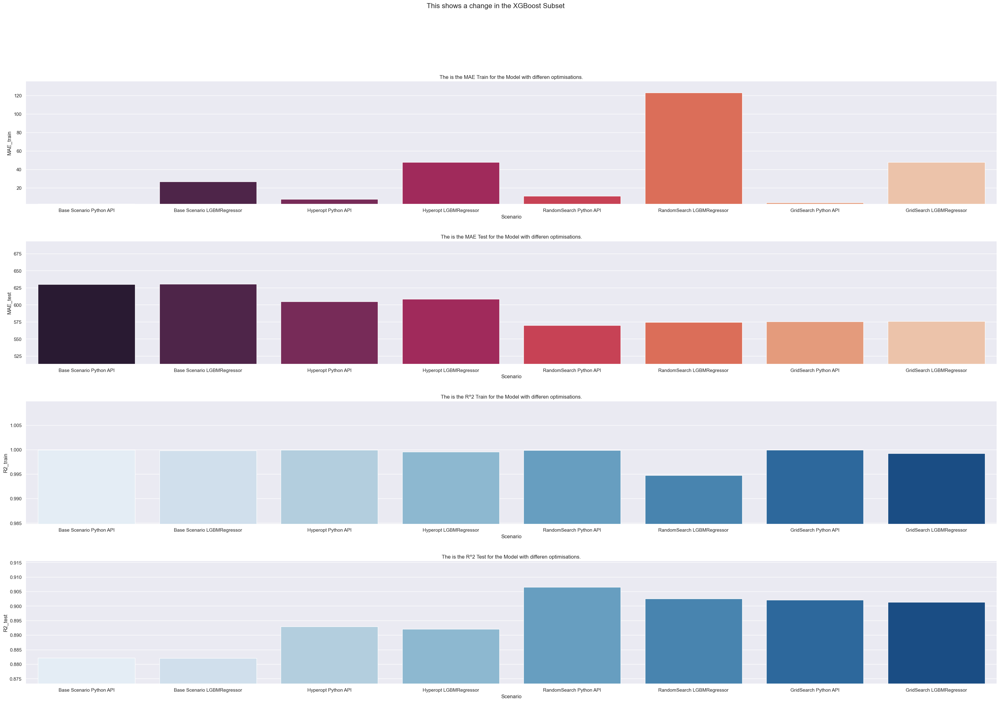

In [360]:
# Run a Function to plot the comparison of the models
plot_bars_comp("XGBoost Subset", comparison_backup)

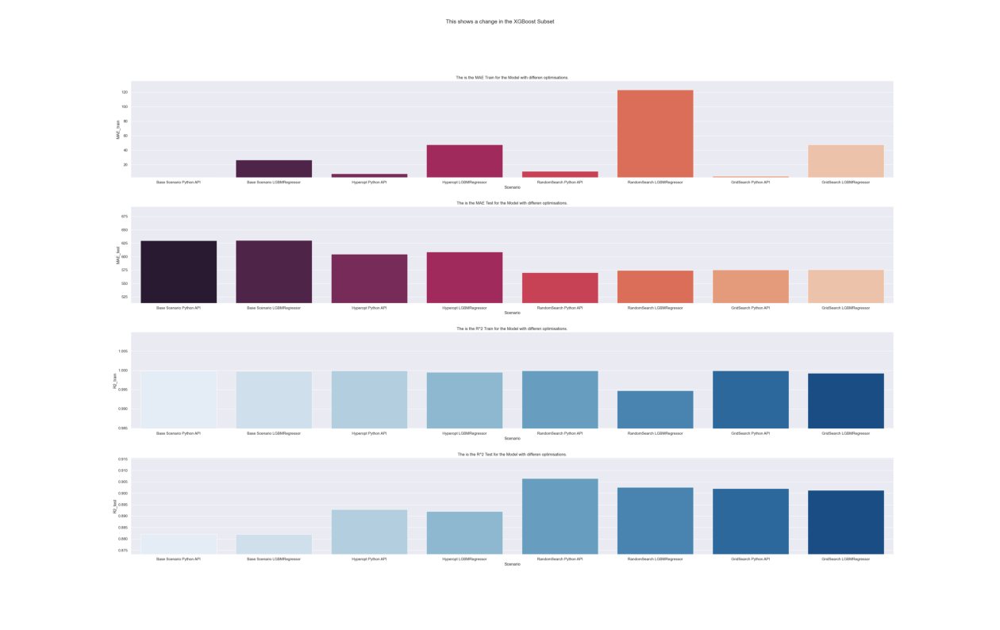

In [361]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("XGBoost Subset")

#### Partly Optimization

In [ ]:
# Setting up the first Hyperparameters that should be tuned, due to the size of the Dataset only very few

#eta: learning rate,  Defalut = 0.1
eta = [0.03, 0.095, 0.13, 0.176]
#The max_depth of a tree in Random Forest is Maximum tree depth for base learners, Defalut = 6
max_depth = [11, 12, 15, 18]
# This is the Minimum sum of instance weight(hessian) needed in a child,  Defalut = 3
min_child_weight = [1, 6, 13, 14, 16]
# reg_lambda: L2 regularization term on weights, default = 1
reg_lambda = [0.78, 0.866, 0.9]
#reg_aplha: L1 regularization term on weights, default = 0
reg_alpha = [52, 55, 58, 62]

param_grid = {"eta": eta,
               "max_depth": max_depth,
               "min_child_weight": min_child_weight,
               "reg_lambda": reg_lambda,
               "reg_alpha": reg_alpha}

param_standard = {"eta": 0.1,
               "max_depth": 6,
               "min_child_weight": 3,
               "reg_lambda": 1,
               "reg_alpha": 0}



In [ ]:
# Although they are influencing each other, this is too much for my Comuter, a proper optimization is shown below with a 
# subset and Cross validation takes too much computing power, due to the lage data:

best_eta = optimize_parameter_no_neg("eta", eta, 6 , 3, 1, 0,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3, value_fix4: XGBRegressor(best_eta=value, best_max_depth=value_fix1, min_child_weight=value_fix2, reg_lambda=value_fix3, reg_alpha=value_fix4, random_state=144,n_jobs=-1))

best_max_depth = optimize_parameter_no_neg("max_depth", max_depth, best_eta, 3, 1, 0, Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3, value_fix4: XGBRegressor(best_eta=value_fix1, best_max_depth=value, min_child_weight=value_fix2, reg_lambda=value_fix3, reg_alpha=value_fix4, random_state=144,n_jobs=-1))

best_min_child_weight = optimize_parameter_no_neg("min_child_weight", min_child_weight, best_eta, best_max_depth, 1, 0,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3, value_fix4: XGBRegressor(best_eta=value_fix1, best_max_depth=value_fix2, min_child_weight=value, reg_lambda=value_fix3, reg_alpha=value_fix4, random_state=144,n_jobs=-1))

best_reg_lambda = optimize_parameter_no_neg("reg_lambda", reg_lambda, best_eta, best_max_depth, best_min_child_weight, 0,  Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3, value_fix4: XGBRegressor(best_eta=value_fix1, best_max_depth=value_fix2, min_child_weight=value_fix3, reg_lambda=value, reg_alpha=value_fix4, random_state=144,n_jobs=-1))

best_reg_alpha = optimize_parameter_no_neg("reg_alpha", reg_alpha, best_eta, best_max_depth, best_min_child_weight, best_reg_lambda, Xtest, ytest,
                    lambda value, value_fix1, value_fix2, value_fix3, value_fix4: XGBRegressor(best_eta=value_fix1, best_max_depth=value_fix2, min_child_weight=value_fix3, reg_lambda=value_fix4, reg_alpha=value, random_state=144,n_jobs=-1))

print(f"The best MAE Test is given with, eta: {best_eta}, max_depth: {best_max_depth}, min_child_weight: {best_min_child_weight}, reg_lambda: {best_reg_lambda}, reg_alpha: {best_reg_alpha}.")
#
# Printing Result: The best MAE Test is given with, eta: 0.03, max_depth: 11, min_child_weight: 1, reg_lambda: 0.78, reg_alpha: 52.
#

The best MAE Test is given with, eta: 0.03, max_depth: 11, min_child_weight: 1, reg_lambda: 0.78, reg_alpha: 52.


In [ ]:
params_partly = {"eta" : 0.03, "max_depth" : 11, "min_child_weight": 1, "reg_lambda": 0.78, "reg_aplha": 52}
# Running the function to get the baseline values
scenario_fit_evaluate_python_api_xgb("XGBoost", "Partly Optimisation Python API", params_partly, 
    Xtrain, ytrain, Xtest, ytest)

params_XGBReg_partly = XGBRegressor(eta = 0.03, max_depth = 11, min_child_weight = 1, reg_lambda = 0.78, reg_alpha = 52)
# Running the function to get the baseline values
scenario_fit_evaluate_regressor("XGBoost", "Partly Optimisation LGBMRegressor", params_XGBReg_partly, 
    Xtrain, ytrain, Xtest, ytest)

             Model                        Scenario   MAE_train    MAE_test  \
0          XGBoost        Base Scenario Python API   74.749916  373.672587   
1          XGBoost     Base Scenario LGBMRegressor  216.463624  374.315936   
2   XGBoost Subset        Base Scenario Python API    2.463074  629.855648   
3   XGBoost Subset     Base Scenario LGBMRegressor   26.666297  630.264828   
4   XGBoost Subset             Hyperopt Python API    7.554810  604.638774   
5   XGBoost Subset          Hyperopt LGBMRegressor   47.702186  608.634856   
6   XGBoost Subset         RandomSearch Python API   11.079212  570.089833   
7   XGBoost Subset      RandomSearch LGBMRegressor  123.263454  574.482513   
8   XGBoost Subset           GridSearch Python API    4.070932  575.271735   
9   XGBoost Subset        GridSearch LGBMRegressor   47.696129  575.723999   
10         XGBoost  Partly Optimisation Python API   60.261861  352.185860   

    R2_train   R2_test  
0   0.995945  0.938653  
1   0.986507 

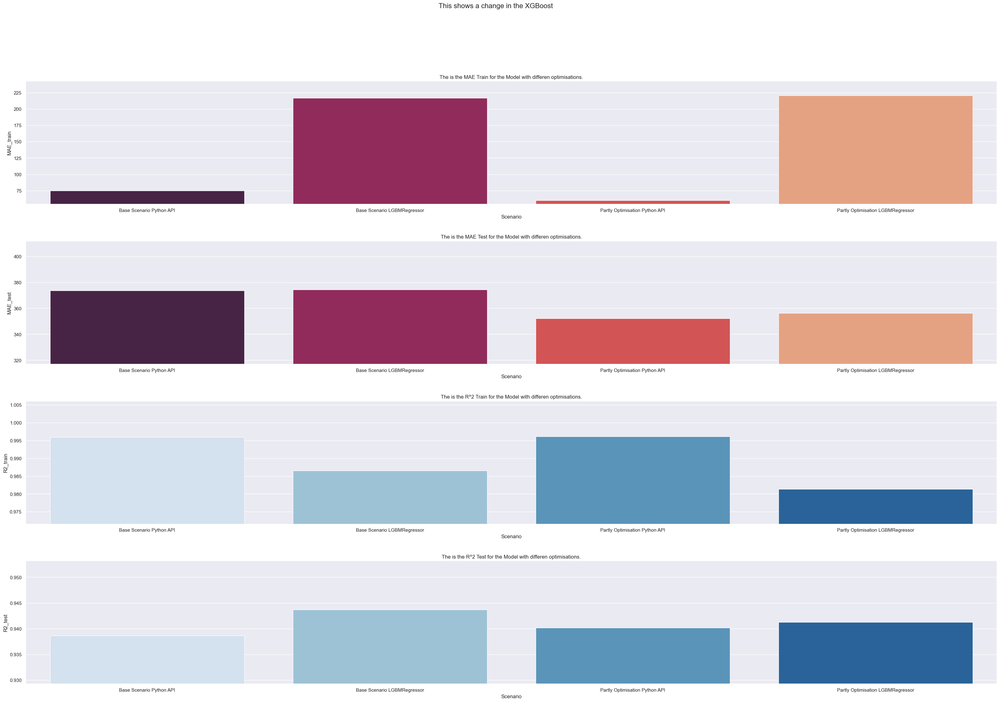

In [362]:
# Run a Function to plot the comparison of the models
plot_bars_comp("XGBoost", comparison_backup)

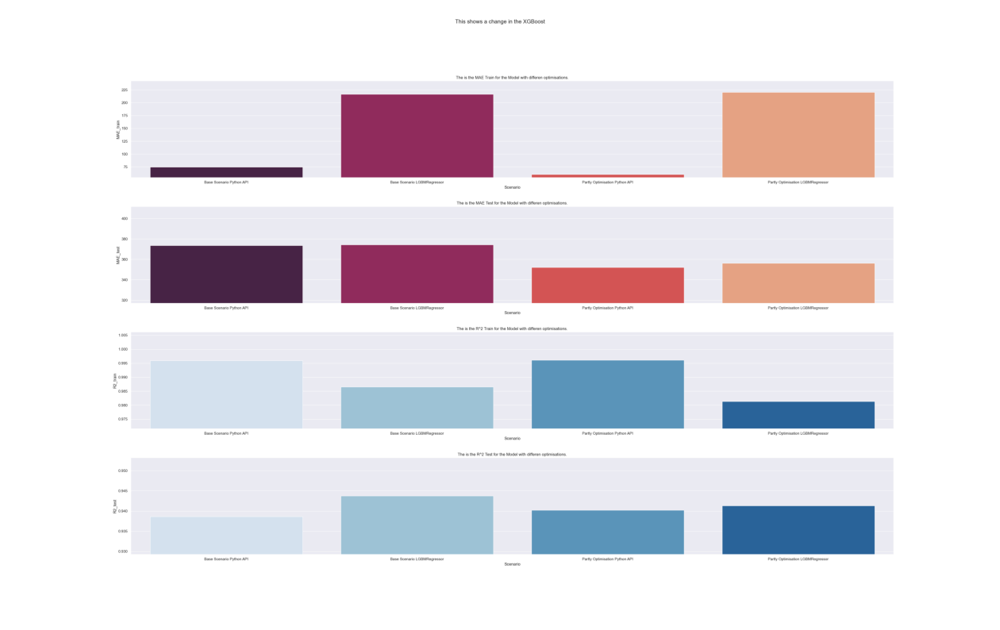

In [363]:
# Load the backup Image
show_images_compa("XGBoost")

# Tenserflow

In [5]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow import keras
from tensorflow_addons.metrics import RSquare
from keras import layers
import keras_tuner as kt
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")

In [6]:
#Define df as our Dataset and drop not needed columns
df = pd.read_csv("data_clean_with_dummies.csv")
df = df.drop(["Unnamed: 0"], axis = 1)

#Define X and y, with X holding the Features and y the correspoding Count of pedestrians
#Features with PCA k=0.99 (PC1 - PC46)
X = df[df.columns[57:103]]

# The targetvariable we try to predict is the pedestrian count
y = df["pedestrians count"]

# Split the dataset into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(
    X, y, test_size=0.3, random_state=72)

## Hyperparameter Tuning

### 1. Establish Base Scenario

In [35]:
#Define Baseline Neural Network model

#Create a Keras Sequential class to hold the different layers of our Neural Network
tensorflow_base_model = keras.Sequential()

tensorflow_base_model.add(keras.Input(shape=X.shape[1])) #Add a Input layer and define the Input shape of it (which is the column lenght of the feature Dataset X)
tensorflow_base_model.add(layers.Dense(100, activation="relu")) #Add a Hidden layer with 100 neurones with Dense. Dense takes the output from our Input layer applies a weight matrix and than applies a activation function (in this case relu).
tensorflow_base_model.add(layers.Dense(50, activation="relu")) #Add a second Hidden layer with 50 Neurones with Dense. Dense takes the output from our first hidden layer applies a weight matrix and than applies a activation function (in this case relu).
tensorflow_base_model.add(layers.Dense(50, activation="relu")) #Add a third Hidden layer with 50 neurones with Dense. 
tensorflow_base_model.add(layers.Dense(50, activation="relu")) #Add a third Hidden layer with 50 neurones with Dense. 
tensorflow_base_model.add(layers.Dense(25, activation="relu")) #Add a fourth Hidden layer with 25 neurones with Dense. 
tensorflow_base_model.add(layers.Dense(10, activation="relu")) #Add a fourth Hidden layer with 10 neurones with Dense. 
tensorflow_base_model.add(layers.Dense(10, activation="relu")) #Add a fourth Hidden layer with 10 neurones with Dense. 
tensorflow_base_model.add(layers.Dense(1, activation="relu")) # Add a output layer with 1 Neuron because we only have one output --> predicted pedestrian count

tensorflow_base_model.summary()#Display an overview of the model 


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               4700      
                                                                 
 dense_1 (Dense)             (None, 50)                5050      
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 50)                2550      
                                                                 
 dense_4 (Dense)             (None, 25)                1275      
                                                                 
 dense_5 (Dense)             (None, 10)                260       
                                                                 
 dense_6 (Dense)             (None, 10)                1

In [38]:
#Specify the training configuration for the Neural Network
tensorflow_base_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),  # Adam Optimizer that minimizes our loss function (f.e SGD or Adam) with a learning rate of 0.001
    loss=keras.losses.mae,  # Loss function the Optimizer minimizes --> Mean absolute error 
    metrics=["mae", RSquare()], # List of metrics to monitor
)


#Fit the model an the training data and use a validation split evaluate the model on
tensorflow_base_history = tensorflow_base_model.fit(
    Xtrain, # Fit the model on the train data 
    ytrain, #The target variable used to calculate the mean absolut error between the target variable and the predictions of the model 
    epochs=250, # 1 epoch is one training iteration - for each epoch the Neural Network processes the entire training data and updates the weights (backpropagation)
    callbacks = def_callbacks(stope_p=20), #Stop training when training is no longer improving Mean absolute error of the validation data (20% of the training data) within 20 epochs(--> def_callbacks Function)
    validation_split=0.2, #Reserve 20% of the training data for validation at the end of each epoch
)

c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\keras\engine\data_adapter.py:1696: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


Epoch 1/250
269/269 [==============================] - 6s 3ms/step - loss: 1883.1691 - mae: 1883.1691 - r_square: 0.0462 - val_loss: 1028.3938 - val_mae: 1028.3938 - val_r_square: 0.7267 - lr: 0.0010
Epoch 2/250
269/269 [==============================] - 1s 2ms/step - loss: 832.6393 - mae: 832.6393 - r_square: 0.7861 - val_loss: 694.7693 - val_mae: 694.7693 - val_r_square: 0.8411 - lr: 0.0010
Epoch 3/250
269/269 [==============================] - 1s 2ms/step - loss: 653.4721 - mae: 653.4721 - r_square: 0.8505 - val_loss: 584.6147 - val_mae: 584.6147 - val_r_square: 0.8744 - lr: 0.0010
Epoch 4/250
269/269 [==============================] - 1s 2ms/step - loss: 559.2800 - mae: 559.2800 - r_square: 0.8809 - val_loss: 527.9590 - val_mae: 527.9590 - val_r_square: 0.8970 - lr: 0.0010
Epoch 5/250
269/269 [==============================] - 1s 2ms/step - loss: 486.6003 - mae: 486.6003 - r_square: 0.9033 - val_loss: 473.5503 - val_mae: 473.5503 - val_r_square: 0.9074 - lr: 0.0010
Epoch 6/250
269/

#### Basemodel Evaluation

In [40]:
scenario_evaluate_tensor("Tensorflow", "Basemodel", tensorflow_base_model, Xtrain, ytrain, Xtest, ytest)

336/336 [==============================] - 0s 1ms/step - loss: 267.6870 - mae: 267.6870 - r_square: 0.9505
        Model   Scenario   MAE_train    MAE_test  R2_train   R2_test
0  Tensorflow  Basemodel  267.687012  305.749878  0.950513  0.955548


144/144 [==============================] - 3s 1ms/step


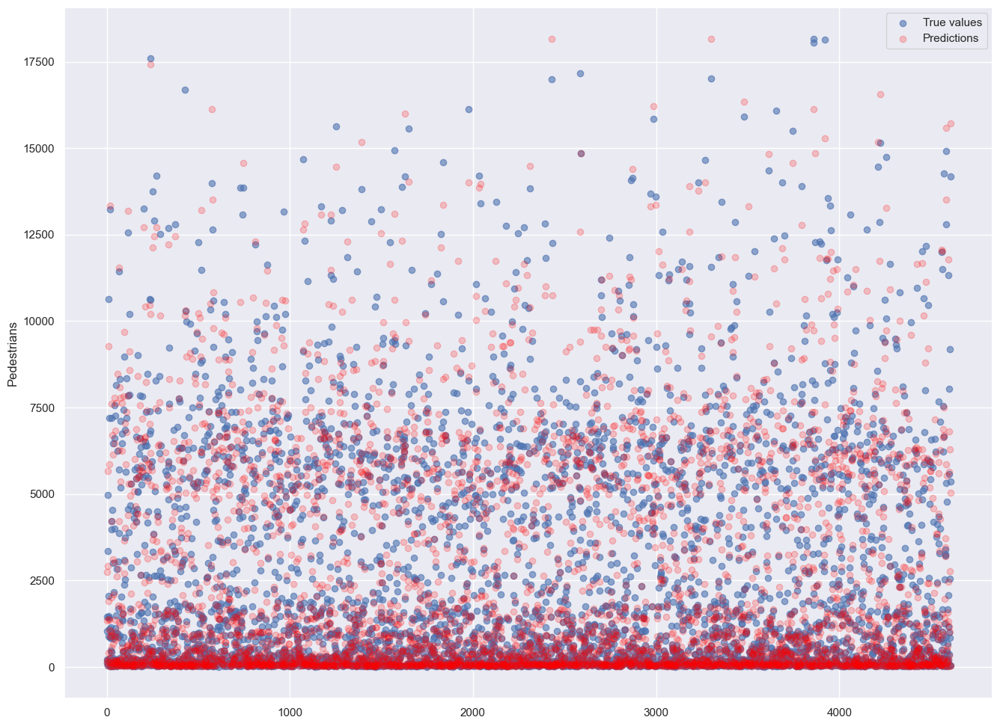

In [41]:
# Plot the Predictions and the Actual data for the Test set to get a first impression
plot_baseline(tensorflow_base_model, Xtest, ytest)

In [ ]:
#Run a function to plot the MAE on the training data against the mae on the validation split of the Training data over time, 
#aswell as the MAE and R-squared on the Trainind data, validation data and Test Data

tensorflow_history_plot(history=tensorflow_base_history, model=tensorflow_base_model, testdataX=Xtest, testdatay=ytest, name="Basemodel")

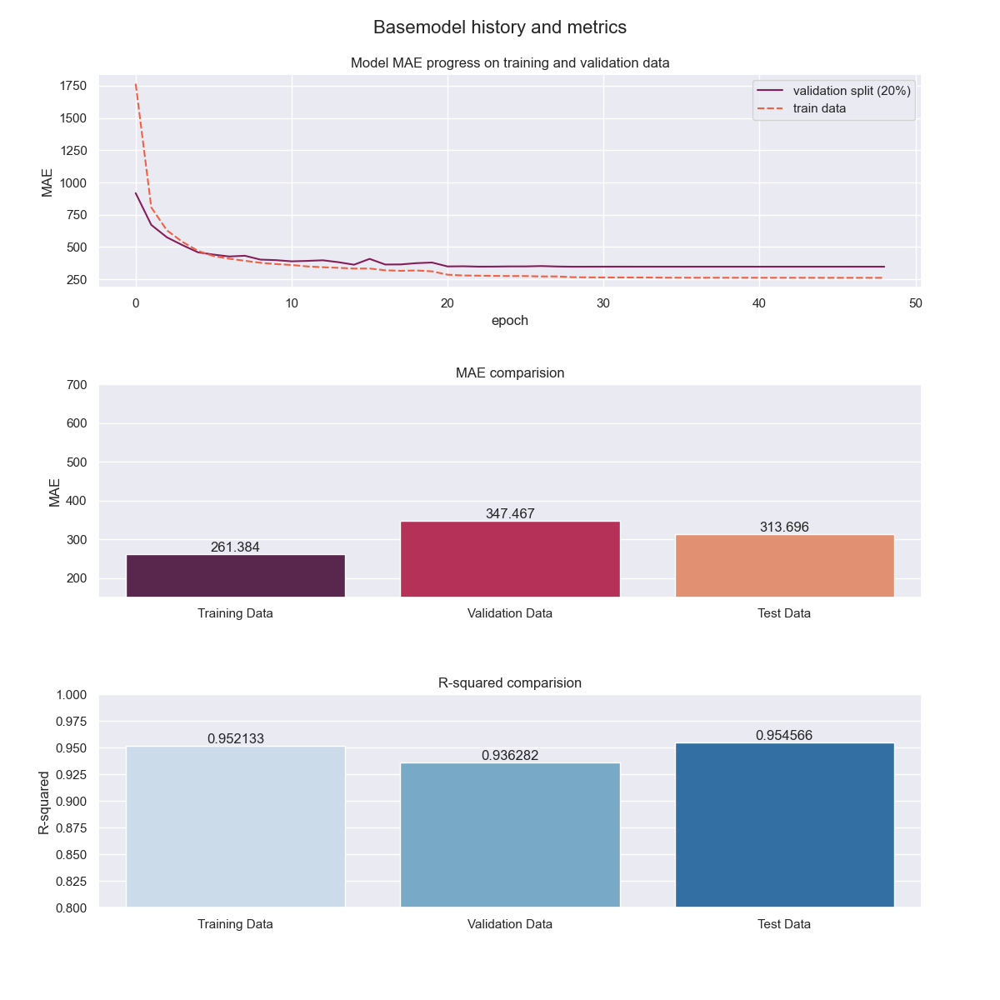

In [289]:
# Show backup
Image.open(f"plots_backup/Basemodel history_comparisson.png")

### 3. Optimize the Hyperparameters

In [42]:
# Subsetting the data for the optimization of the hyperparameters
ped_subset = ped.sample(frac=0.1, random_state=1)

# Define a new X of the subset with the squared feature k = 0.99, 57+46
X_subset = np.array(ped_subset[ped_subset.columns[57:103]])

# Subset of the output to predict
y_subset = ped_subset["pedestrians count"]

# Split the subset into train and test sets
Xtrain_subset, Xtest_subset, ytrain_subset, ytest_subset = train_test_split(
    X_subset, y_subset, test_size=0.3, random_state=72)

In [43]:
#Basemodel on 10% data

#Create a Keras Sequential class to hold the different layers of our Neural Network
tensorflow_base2_model = keras.Sequential()

tensorflow_base2_model.add(keras.Input(shape=X.shape[1])) #Add a Input layer and define the Input shape of it (which is the column lenght of the feature Dataset X)
tensorflow_base2_model.add(layers.Dense(100, activation="relu")) #Add a Hidden layer with 100 neurones with Dense. Dense takes the output from our Input layer applies a weight matrix and than applies a activation function (in this case relu).
tensorflow_base2_model.add(layers.Dense(50, activation="relu")) #Add a second Hidden layer with 50 Neurones with Dense. Dense takes the output from our first hidden layer applies a weight matrix and than applies a activation function (in this case relu).
tensorflow_base2_model.add(layers.Dense(50, activation="relu")) #Add a third Hidden layer with 50 neurones with Dense. 
tensorflow_base2_model.add(layers.Dense(50, activation="relu")) #Add a third Hidden layer with 50 neurones with Dense. 
tensorflow_base2_model.add(layers.Dense(25, activation="relu")) #Add a fourth Hidden layer with 25 neurones with Dense. 
tensorflow_base2_model.add(layers.Dense(10, activation="relu")) #Add a fourth Hidden layer with 10 neurones with Dense. 
tensorflow_base2_model.add(layers.Dense(10, activation="relu")) #Add a fourth Hidden layer with 10 neurones with Dense. 
tensorflow_base2_model.add(layers.Dense(1, activation="relu")) # Add a output layer with 1 Neuron because we only have one output --> predicted pedestrian count

tensorflow_base2_model.summary()#Display an overview of the model 


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 100)               4700      
                                                                 
 dense_9 (Dense)             (None, 50)                5050      
                                                                 
 dense_10 (Dense)            (None, 50)                2550      
                                                                 
 dense_11 (Dense)            (None, 50)                2550      
                                                                 
 dense_12 (Dense)            (None, 25)                1275      
                                                                 
 dense_13 (Dense)            (None, 10)                260       
                                                                 
 dense_14 (Dense)            (None, 10)               

In [44]:
#Specify the training configuration for the Neural Network
tensorflow_base2_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),  # Adam Optimizer that minimizes our loss function (f.e SGD or Adam) with a learning rate of 0.001
    loss=keras.losses.mae,  # Loss function the Optimizer minimizes --> Mean absolute error 
    metrics=["mae", RSquare()], # List of metrics to monitor
)

#Fit the model an the training data and use a validation split evaluate the model on
tensorflow_base2_history = tensorflow_base2_model.fit(
    Xtrain_subset, # Fit the model on the train data subset (10%)
    ytrain_subset, #The target variable used to calculate the mean absolut error between the target variable and the predictions of the model. Subset (10% of data)
    epochs=250, # 1 epoch is one training iteration - for each epoch the Neural Network processes the entire training data and updates the weights 
    callbacks = def_callbacks(stope_p=20), #Stop training when training is no longer improving Mean absolute error of the validation data (20% of the training data) within 20 epochs(--> def_callbacks Function)
    validation_split=0.2, #Reserve 20% of the training data for validation at the end of each epoch
)

Epoch 1/250


c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\keras\engine\data_adapter.py:1696: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


27/27 [==============================] - 2s 12ms/step - loss: 2413.2236 - mae: 2413.2236 - r_square: -0.6172 - val_loss: 2870.9780 - val_mae: 2870.9780 - val_r_square: -0.6855 - lr: 0.0010
Epoch 2/250
27/27 [==============================] - 0s 4ms/step - loss: 2407.2913 - mae: 2407.2913 - r_square: -0.6143 - val_loss: 2851.0471 - val_mae: 2851.0471 - val_r_square: -0.6759 - lr: 0.0010
Epoch 3/250
27/27 [==============================] - 0s 4ms/step - loss: 2336.9624 - mae: 2336.9624 - r_square: -0.5648 - val_loss: 2686.8372 - val_mae: 2686.8372 - val_r_square: -0.5473 - lr: 0.0010
Epoch 4/250
27/27 [==============================] - 0s 4ms/step - loss: 2100.1812 - mae: 2100.1812 - r_square: -0.2664 - val_loss: 2330.5337 - val_mae: 2330.5337 - val_r_square: -0.1174 - lr: 0.0010
Epoch 5/250
27/27 [==============================] - 0s 5ms/step - loss: 1801.4847 - mae: 1801.4847 - r_square: 0.1284 - val_loss: 2015.3785 - val_mae: 2015.3785 - val_r_square: 0.1402 - lr: 0.0010
Epoch 6/250
2

In [45]:
scenario_evaluate_tensor("Tensorflow Subset", "Basemodel subset", tensorflow_base2_model, Xtrain, ytrain, Xtest, ytest)

336/336 [==============================] - 0s 1ms/step - loss: 619.0535 - mae: 619.0535 - r_square: 0.8670
               Model          Scenario   MAE_train    MAE_test  R2_train  \
0         Tensorflow         Basemodel  267.687012  305.749878  0.950513   
1  Tensorflow subset  Basemodel subset  619.053528  607.199463  0.867025   

    R2_test  
0  0.955548  
1  0.877426  


#### Hypertuned model: Optimal number of layers and nodes on 10% of the data 

In [50]:
## Hyperparametertuning (due to its singulare nature left in the code)

def tensorflow_h0_model(hp): 
 
    #Create a Keras Sequential class to hold the different layers of our Neural Network
    model = keras.Sequential()
    model.add(keras.layers.Flatten()) #Add an input layer 
    
# Tune the number of hidden layers and units (Nodes)
    # Number of hidden layers: 1 - 16
    for i in range(hp.Int("num_layers", 1, 16)):
        
        # Number of Nodes: 32 - 256 with stepsize of 32
        model.add(
            keras.layers.Dense(
                units=hp.Int("units_" + str(i), min_value=32, max_value=256, step=32), #Define a Hyperparameter as a integer between 32 and 256 as different amount of Nodes 
                activation="relu") #Using relu as an activation function. Could also be defined as a Hyperparameter but in order to reduce the computing time, this will be done in the next Hyperparameter tuning
            )
    
    # Add output layer
    model.add(keras.layers.Dense(units=1, activation="relu"))
    
    #Here setting learning rate as a Hyperparameter would be better but it would take a lot longer since the Tuner would also have to tune the learning rate adding a huge amout of options.
    # Define optimizer, loss, and metrics
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                  loss=keras.losses.mae,
                  metrics=["mae", RSquare()]) 
    
    return model

# Using the Hyperband tuner which selects different Hyperparameter combinations when the have promising results after a few epochs and tunes them further
tensorflow_h0_tuner = kt.Hyperband(hypermodel=tensorflow_h0_model, #Select the model that should be tuned
                     objective='val_mae', #Objective to minimize, in this case the validation split Mean average error
                     max_epochs=30, #Maximum number of epochs to train 1 model configuration 
                     hyperband_iterations=2, #the number of times to iterate over the full Hyperband algorithm
                     overwrite=True, #to be able to overwrite prior tuner entries
                     directory='kt_dir', #create a dictionary to store the tries and metrics 
                     project_name='kt_Hyperband0') #Name of the project in the directory

#Start the Hyperparamter search on the smaller subset data (10%) 
tensorflow_h0_tuner.search(Xtrain_subset, ytrain_subset, epochs=30, validation_split=0.2, callbacks=def_callbacks(reducelr_lr=0.000001, reducelr_p=3))


Search: Running Trial #1

Value             |Best Value So Far |Hyperparameter
13                |?                 |num_layers
192               |?                 |units_0
2                 |?                 |tuner/epochs
0                 |?                 |tuner/initial_epoch
3                 |?                 |tuner/bracket
0                 |?                 |tuner/round

Epoch 1/2
23/27 [========================>.....] - ETA: 0s - loss: 1962.9874 - mae: 1962.9874 - r_square: -0.2259 

NotFoundError: {{function_node __wrapped__SaveV2_dtypes_87_device_/job:localhost/replica:0/task:0/device:CPU:0}} Failed to create a NewWriteableFile: kt_dir\kt_Hyperband0\trial_0000\checkpoint_temp/part-00000-of-00001.data-00000-of-00001.tempstate17761697878478730695 : Das System kann den angegebenen Pfad nicht finden.
; No such process [Op:SaveV2]

In [ ]:
#Safe the best Hyperparamter configurations
h0_best_hps = tensorflow_h0_tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The first hyperparameter search on the smaller dataset is complete. The optimal number of layers is {h0_best_hps.get('num_layers')}.
Summary:
""")

#Display the best 10 Hypermodel configurations found by the tuner
tensorflow_h0_tuner.results_summary()

#
# Result:
# The first hyperparameter search on the smaller dataset is complete.
# The optimal number of layers is 8. 
#
# The result summary shows exact details. The configurations of the best NN ist choosen for the next tuner. 

#### Hypertuned model: Tuning Optimzer, learning rate and activation function (Hyperparameter)

In [ ]:
#Find the best Optimizer, activation function and learning rate for the best Model the above Tuner has found

def tensorflow_h1_model(hp): 
 
#Create a Keras Sequential class to hold the different layers of our Neural Network
    model = keras.Sequential()

    #Tune activation function
    hp_activation = hp.Choice('activation', values=['relu', 'tanh', 'selu']) #Define a Hyperparameter as a choiche (option) for different activation functions. The tuner will try these, to find the best one (lowest validation MAE)

    #Best Neural Network configuration found by the first Hyperparameter tuner
    model.add(keras.layers.Flatten()) #Add a Input layer and use flatten to get a 1 dimensional input
    model.add(layers.Dense(160, activation=hp_activation))  
    model.add(layers.Dense(192, activation=hp_activation)) 
    model.add(layers.Dense(64, activation=hp_activation)) 
    model.add(layers.Dense(160, activation=hp_activation))
    model.add(layers.Dense(128, activation=hp_activation)) 
    model.add(layers.Dense(160, activation=hp_activation))  
    model.add(layers.Dense(64, activation=hp_activation))  
    model.add(layers.Dense(224, activation=hp_activation))   
    model.add(layers.Dense(1, activation=hp_activation))  #Add an output layer

    #Tune learning rate 
    hp_learning_rate = hp.Choice("learning_rate", values=[1e-2, 1e-3, 1e-4])  # Define a Hyperparameter as a choice to tune learning rate with the values 0.01, 0.001, 0.0001

    #Create a dictionary to hold the different optimization functions 
    optimizers_dict = {
        "Adam":    keras.optimizers.Adam(learning_rate=hp_learning_rate),
        "SGD":     keras.optimizers.SGD(learning_rate=hp_learning_rate),
        "Adagrad": keras.optimizers.Adagrad(learning_rate=hp_learning_rate),
        "Adadelta": keras.optimizers.Adadelta(learning_rate=hp_learning_rate),
        "RMSprop": keras.optimizers.RMSprop(learning_rate=hp_learning_rate)
        }

    hp_optimizers = hp.Choice( #Define a Hyperparameter as a choice to tune the optimizer 
        'optimizer', values=["Adam", "SGD", "Adagrad", "Adadelta", "RMSprop"] #Options the tuner will try, that correspond to the optimizer dictionary keys 
        )


    model.compile(optimizer=optimizers_dict[hp_optimizers], #Complie the model and use the optimizer choice as input for the optimizer 
                  loss=keras.losses.mae, #Loss function is Mean average error 
                  metrics=["mae", RSquare()]) #Metrics to monitor
    
    return model

In [51]:
#Random search tuner because we only have 5 different Optimizer options, 3 learning rate optimizations and 3 activation functions, 
# so randomly selecting is okay because no matter what we will try every combination in a rather short time
tensorflow_h1_tuner = kt.RandomSearch(hypermodel = tensorflow_h1_model, #The model the Randomsearch tuner will tune 
                       objective = 'val_mae', #Objetive the tuner will try to minimize 
                       max_trials =100 , #The total number of model configurations to test at most 
                       directory = 'kt_dir', #create a dictionary to store the tries and metrics 
                       overwrite=True, #To be able to overwrite prior tuner entries
                       project_name = 'kt_RandomSearch') #Name of the project in the directory

NameError: name 'tensorflow_h1_model' is not defined

In [ ]:
#Initiate the tuner with the Train data
#Tune for 20 epochs with a validation split of 20% and a possible minimum learning rate of 0.00001 for the Reduce learning rate callback function
tensorflow_h1_tuner.search(Xtrain_subset, ytrain_subset, epochs=20, validation_split=0.2, callbacks=def_callbacks(reducelr_lr=0.00001)) 

In [ ]:
#Create a new Model with the best Hyperparameters found by the tuner
h1_best_hps = tensorflow_h1_tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The second hyperparameter search is complete. The best optimizer is {h1_best_hps.get('optimizer')}, the best activation function is 
{h1_best_hps.get("activation")} and the optimal learning rate for the optimizer is {h1_best_hps.get('learning_rate')}.
Summary:
""")

#Display the best 10 Hypermodel configurations found by the tuner
tensorflow_h1_tuner.results_summary() 

#Create a new Hypertuned Model to tune further, with the best Hyperparameter configurations the tuner has found.
tensorflow_hypertuned_model = tensorflow_h1_tuner.hypermodel.build(h1_best_hps)
#Fit the model on the training data subset and create a new history for the model to compare it with the Baseline histroy 
tensorflow_hypertuned_history = tensorflow_hypertuned_model.fit(Xtrain_subset, ytrain_subset, epochs=250, validation_split=0.2,
                    callbacks=def_callbacks(reducelr_lr=0.000001))

# Print:
# The second hyperparameter search is complete. The best optimizer is Adagrad, 
# the best activation function is 
# selu and the optimal learning rate for the optimizer is 0.01.

#### Hypertuned model Evaluation

In [ ]:
#Evaluate model on test set using the above created function to save the results in the comparisson dataframe
scenario_evaluate_tensor("Tensorflow Subset", "Hypertuned model subset", tensorflow_hypertuned_model, Xtrain_subset, ytrain_subset, Xtest_subset, ytest_subset)

## Comparing the results of the Subsets

In [9]:
# reading the created dataframe and have a look at it to plot it later for the analysis (Backup)
comparison_backup = pd.read_csv("outputs_backup/comparison_mae_r2.csv", sep=";")
comparison_backup

,Model,Scenario,MAE_train,MAE_test,R2_train,R2_test
0,MLP Regressor,Base Scenario,346.964702,458.804790,0.965150,0.940915
1,MLP Regressor Subset,Base Scenario,164.727363,943.799061,0.991575,0.812095
2,MLP Regressor Subset,RandomSearch,422.899468,816.585346,0.958999,0.835115
3,MLP Regressor Subset,GridSearch,157.127540,939.964346,0.993650,0.816643
4,MLP Regressor,GridSearch,304.198428,441.389594,0.970655,0.932543
5,MLP Regressor,Partly optimisation,415.745568,425.201080,0.939840,0.940928
6,Random Forest,Base Scenario,148.597667,339.997802,0.988607,0.942855
7,Random Forest Subset,Base Scenario,196.444005,571.199575,0.984530,0.897685
8,Random Forest Subset,RandomSearch,238.349159,588.154607,0.972960,0.890751
9,Random Forest Subset,GridSearch,238.349159,588.154607,0.972960,0.890751


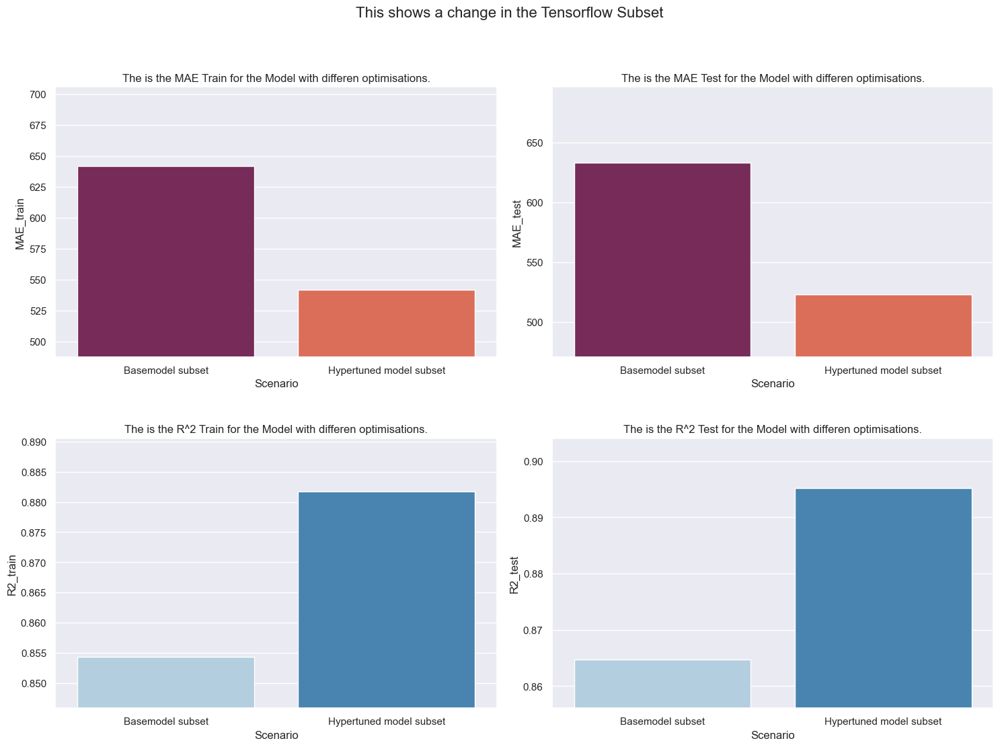

In [291]:
# Run a Function to plot the comparison of the models
plot_bars_comp("Tensorflow Subset", comparison_backup)


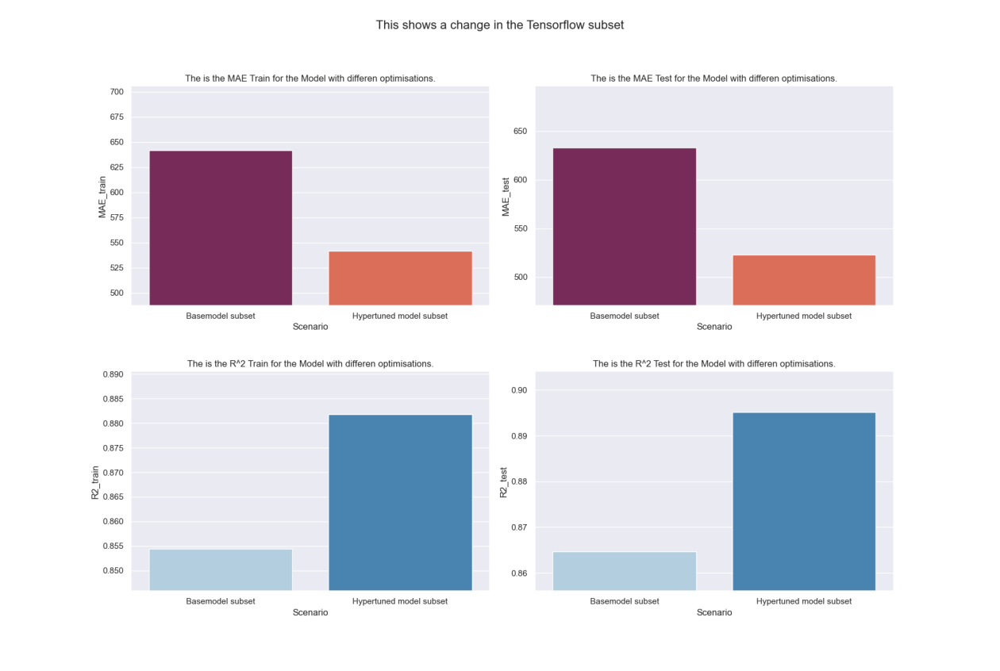

In [293]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("Tensorflow Subset")

### Hypertuned model fit on 100% of the dataset

In [52]:
#Create a second Hypertuned Model to tune further, with the best Hyperparameter configurations the tuner has found.
tensorflow_full_hypertuned_model = tensorflow_h1_tuner.hypermodel.build(h1_best_hps)

#Fitting the hypertuned model on 100% of the data. In order to compare it to the baseline model which was fitted on 100% of the data.
#This approach is choosen to reduce computing time, if this was not of concern the tuning would have been done on the whole dataset
tensorflow_full_hypertuned_history = tensorflow_full_hypertuned_model.fit(Xtrain, ytrain, epochs=250, validation_split=0.2,
                    callbacks=def_callbacks(reducelr_lr=0.000001, reducelr_p=10, stope_p=25))

NameError: name 'tensorflow_h1_tuner' is not defined

In [53]:
#Evaluate model on test set using the above created function to save the results in the comparisson dataframe
scenario_evaluate_tensor("Tensorflow", "Hypertuned model", tensorflow_full_hypertuned_model, Xtrain, ytrain, Xtest, ytest)

SyntaxError: positional argument follows keyword argument (1613989350.py, line 2)

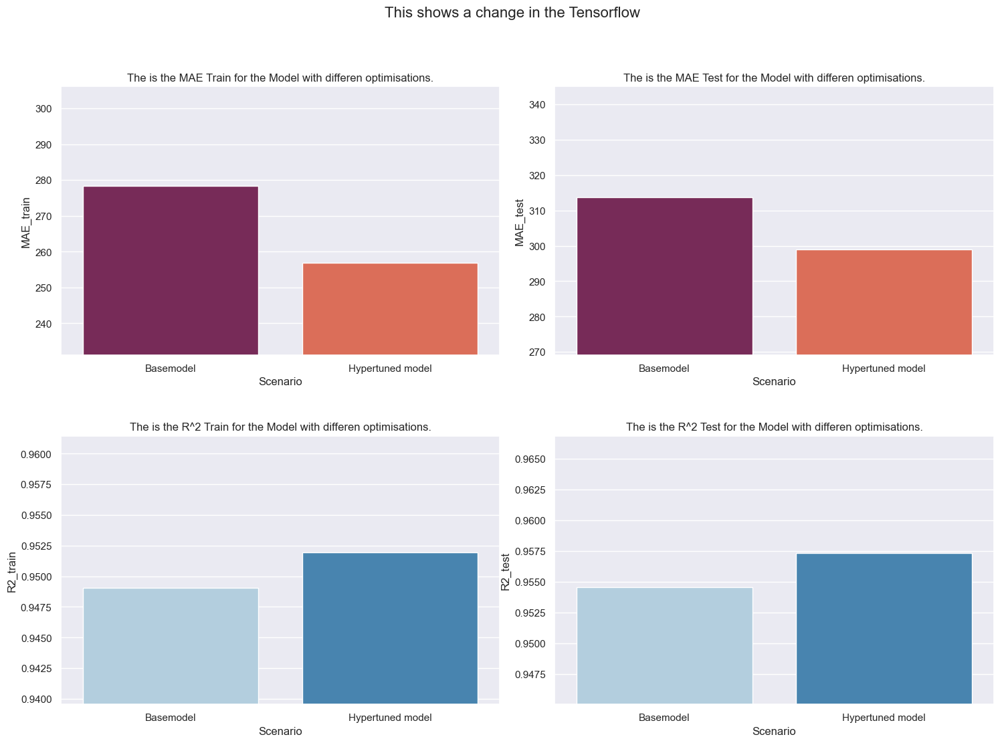

In [292]:
plot_bars_comp("Tensorflow", comparison_backup)


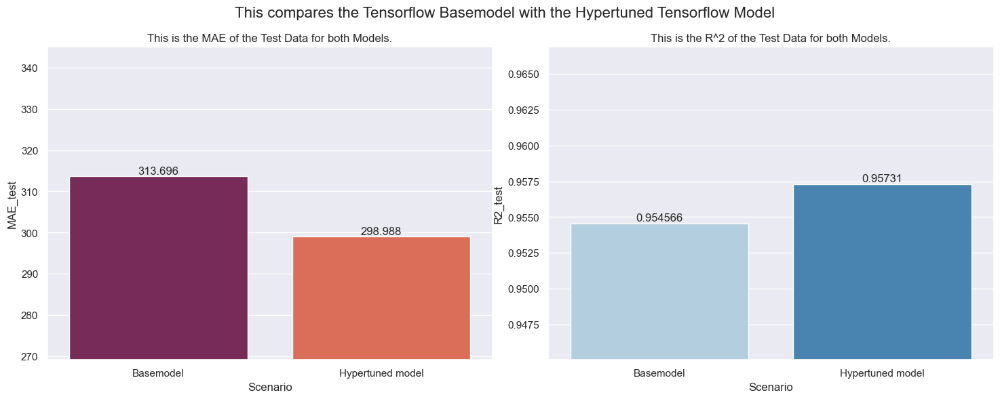

In [28]:
def plot_bars_comp(model, dataframe):
    # Define the dimensions and model of the plot
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
    plot_data = dataframe[dataframe["Model"] == model]

    # # Get the MAE train bars
    # mae_train_axes = axes[0, 0]
    # ax = sns.barplot(data=plot_data, x="Scenario", y="MAE_train", ax=mae_train_axes, palette="rocket")
    # ax.bar_label(ax.containers[0])
    # mae_train_axes.set_ylim((plot_data["MAE_train"].min())*0.9, (plot_data["MAE_train"].max())*1.1)
    # mae_train_axes.set_title(f"This is the MAE Train for the Model with differen optimisations.")

    # Get the MAE test bars
    mae_test_axes = axes[0]
    ax = sns.barplot(data=plot_data, x="Scenario", y="MAE_test", ax=mae_test_axes, palette="rocket")
    ax.bar_label(ax.containers[0])
    mae_test_axes.set_ylim((plot_data["MAE_test"].min())*0.9, (plot_data["MAE_test"].max())*1.1)
    mae_test_axes.set_title(f"This is the MAE of the Test Data for both Models.")


    # # Get the r2 train bars
    # r2_train_axes = axes[1, 0]
    # ax = sns.barplot(data=plot_data, x="Scenario", y="R2_train", ax=r2_train_axes, palette="Blues")
    # ax.bar_label(ax.containers[0])
    # r2_train_axes.set_ylim((plot_data["R2_train"].min())*0.99, (plot_data["R2_train"].max())*1.01)
    # r2_train_axes.set_title(f"This is the R^2 Train for the Model with differen optimisations.")


    # Get the r2 test bars
    r2_test_axes = axes[1]
    ax = sns.barplot(data=plot_data, x="Scenario", y="R2_test", ax=r2_test_axes, palette="Blues")
    ax.bar_label(ax.containers[0])
    r2_test_axes.set_ylim((plot_data["R2_test"].min())*0.99, (plot_data["R2_test"].max())*1.01)
    r2_test_axes.set_title(f"This is the R^2 of the Test Data for both Models.")

    fig.subplots_adjust(hspace=0.3, wspace=0.125)
    # Set a Titel
    fig.suptitle(f"This compares the Tensorflow Basemodel with the Hypertuned Tensorflow Model", fontsize=16)
    #fig.savefig(f"plots/{model} comparison.png")

plot_bars_comp("Tensorflow", comparison_backup)

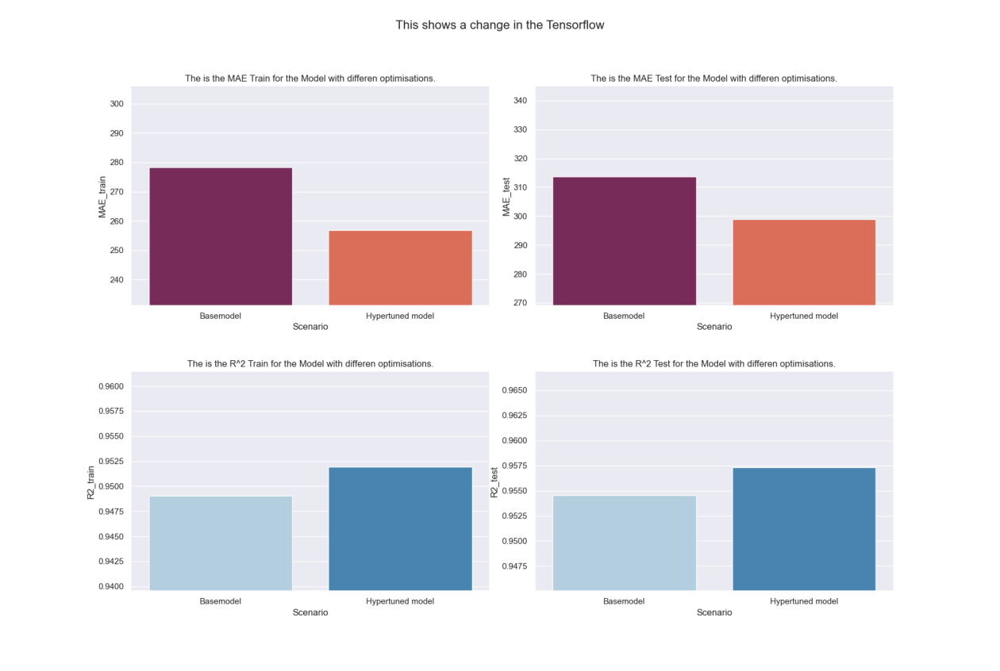

In [294]:
# Run a function to create figure frome saved pictures of the comaprison
show_images_compa("Tensorflow")

# All Models Compared

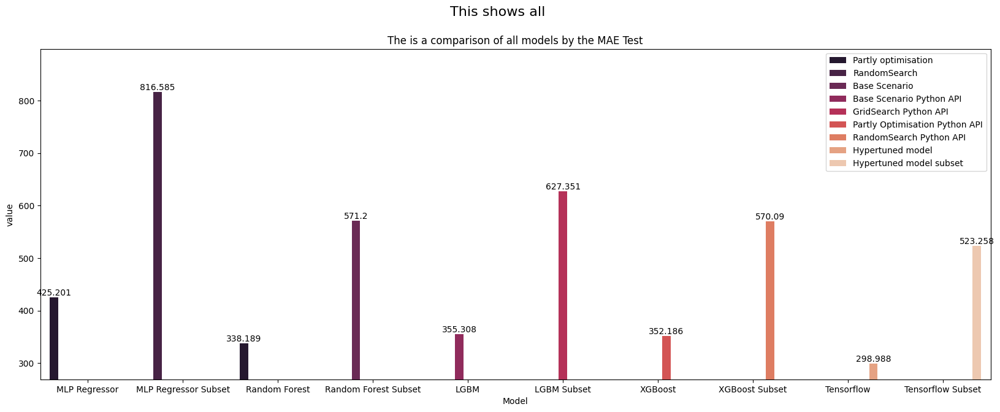

In [11]:
#Define a Function to plot the comparison of the best models
plot_bars_comp_all("", comparison_backup)

In [9]:
comparison_backup

NameError: name 'comparison_backup' is not defined

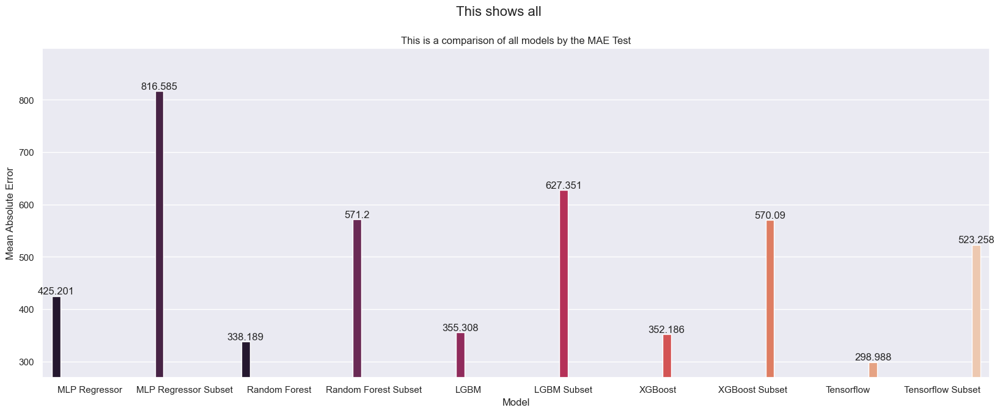

In [21]:
def plot_bars_comp_all(term, dataframe):
    
    plot_data_all = pd.DataFrame()
    rows_names = [df for df in dataframe["Model"] if term in df]
    plot_data_all = dataframe.loc[dataframe["Model"].isin(rows_names)]

    # Getting for each model the minimum in MAE_test
    models = plot_data_all.melt(id_vars=["Model", "Scenario"])
    models_unique = list(models["Model"].unique())
    min_row = []
    for model in models_unique:
        min_index = models.loc[models["Model"] == (model)]
        min_index = min_index.loc[min_index["variable"] == "MAE_test"]
        min_row_index = min_index["value"].idxmin()
        min_row.append(min_row_index)
    models_min = models.iloc[min_row]
    models_min




    # Define the dimensions and model of the plot
    fig, axes = plt.subplots(nrows = 1, ncols=1, figsize=(20, 7))

    legend_label = list(models_min["Scenario"])

        # Get the r2 train bars
    axes = sns.barplot(data=models_min, x="Model", y="value", palette="rocket", hue=legend_label)
    axes.set_ylim((models_min["value"].min())*0.90, (models_min["value"].max())*1.1)
    axes.set_title(f"This is a comparison of all models by the MAE Test")
    axes.set_ylabel("Mean Absolute Error")
    axes.legend_.remove()
    for container in axes.containers:
        axes.bar_label(container)

    #fig.subplots_adjust(hspace=0.3, wspace=0.125)
    # Set a Titel
    fig.suptitle(f"This shows all {term}", fontsize=16)
    #fig.savefig(f"plots/{term} comparison_all_test.png")
plot_bars_comp_all("", comparison_backup)

# API

In [188]:
import requests # Library to access URLs using Python
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
from datetime import date, timedelta
from datetime import datetime

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor # Random Forest estimator


## Get Forcast weather data

### Get data

In [190]:
# Set the API key
api_key = "ba6cf0fabcb9f0ec1029c1a0a7949ec4"

In [191]:
# Set the base URL
geo_url = "http://api.openweathermap.org/geo/1.0/direct"

# Set the parameter to get the location
geo_params = {
    "q": "Köln",
    "appid": api_key
}

# Create the API query URL
query = build_query_string(geo_url, geo_params)

# Obtain the data from the API call
geo_data = requests.get(query).json()

In [192]:
# Define the base URL of the forecast API
forcast_url = "https://api.openweathermap.org/data/2.5//forecast"

# Define the parameters of our query to the air pollution API
airpol_params = {
    "lat": geo_data[0]["lat"], # The latitude of our chosen city
    "lon": geo_data[0]["lon"], # The longitude of our chosen city
    "appid": api_key, # Our API key
    "units": "metric"
}

weather = requests.get(build_query_string(forcast_url, airpol_params)).json()

In [193]:
# Extract a list of relevant dictionaries
observations_temp = []
observations_weather = []

for datapoint in weather["list"]:
    # Keep track of all temperature
    obs_t = datapoint["main"]
    # Add the date and time to the dict
    obs_t["date"] = datapoint["dt"]
    # Add the observation to the list of observations
    observations_temp.append(obs_t)

    # Keep track of all weather data
    obs_w = datapoint["weather"][0]
    # Add the date and time to the dict
    obs_w["date"] = datapoint["dt"]
    # Add the observation to the list of observations
    observations_weather.append(obs_w)

# Saving data from API in a Dataframe to merge
df_t = pd.DataFrame.from_records(observations_temp)
df_w = pd.DataFrame.from_records(observations_weather)

### Change to hourly

In [194]:
# Merging data and changing date formate
df = pd.merge(df_t, df_w, how= "right", on = "date")
df["date"] = pd.to_datetime(df["date"], unit="s")

# buildng this as hourly with cloned rows
df_repeated = pd.concat([df]*3, ignore_index=True)
df_repeated.loc[[0,40,80]]

# Create a list to store the order of new indexs
new_index = []
# Changing the Dataframe to every hour
for n in range(int(len(df_repeated)/3)):
    new_index.append(n)
    new_index.append(n+40)
    new_index.append(n+80)

# Reset the index
df_repeated = df_repeated.reindex(new_index)
df_repeated.reset_index(inplace = True, drop = True)

# Getting a step by step change in temperature by usint the three hour steps and distripute the change evenly
for n in range(int(len(df_repeated)/3)-1):
    start_index = n*3
    end_index = (n*3)+3
    start = df_repeated.loc[start_index,"temp"]
    end = df_repeated.loc[end_index,"temp"]
    difference = end - start
    steps = round(difference/3,2)
    df_repeated.loc[start_index+1,"temp"] = df_repeated.loc[start_index,"temp"] + steps
    df_repeated.loc[start_index+2,"temp"] = df_repeated.loc[start_index,"temp"] + steps + steps

# Drop unimportant rows
df_repeated = df_repeated.drop(df_repeated.iloc[:,1:9],axis = 1)

In [195]:
# Setting the Hour intervals for the Dataframe
for n in range(int(len(df_repeated)/3)):
    start_index = n*3
    df_repeated.loc[start_index+1,"date"] = df_repeated.loc[start_index,"date"] + timedelta(hours=1)
    df_repeated.loc[start_index+2,"date"] = df_repeated.loc[start_index,"date"] + timedelta(hours=2)

# Splitting the date and time for a merge
df_repeated["date"] = df_repeated["date"].astype(str)
df_repeated[["date", "time"]] = df_repeated["date"].str.split(" ", n=1, expand=True)
df_repeated

# Get Column with months
df_repeated["months"] = df_repeated["date"].str.slice(5, 7)

# Transform time to hours
df_repeated["hour"] = df_repeated["time"].str.slice(0, 2)

### Future School Holiday

In [196]:
# Import Dataframe from the holidays
future_school_holi = pd.read_csv("future_school_holiday.csv", sep = ";")
days_df_list = []

# Create dataframe with all dates singular listed 
for i in range(future_school_holi.shape[0]):
    # Get the start and enddate from the holidays
    start_date = datetime.strptime(future_school_holi["Erster Ferientag"][i], "%Y-%m-%d").date()
    end_date = datetime.strptime(future_school_holi["Letzter Ferientag"][i], "%Y-%m-%d").date()

    # Create dataframes out of the range and append to a list
    delta = end_date - start_date
    days = [start_date + timedelta(days=n) for n in range(delta.days + 1)]
    days_df = pd.DataFrame (days, columns = ["date"])
    days_df_list.append(days_df)

# Create single dataframe out of the list and add value 1 for holiday
new_holi = pd.concat(days_df_list).reset_index(drop=True)
new_holi["school holiday"] = 1

# Chagne to str for merge
new_holi["date"] = new_holi["date"].astype(str)

In [197]:
# Merging the weather data an the holidays
df_merge1 = pd.merge(df_repeated, new_holi, how= "left", on = "date")
# Filling cells with no holiday with a 0
df_merge1["school holiday"] = df_merge1["school holiday"].fillna(0)
# change float to int
df_merge1["school holiday"] = np.int64(df_merge1["school holiday"].astype(int))

### Future National Holiday

In [202]:
# Getting the current year 
today = dt.date.today()
year = int(today.strftime("%Y"))

# Putting this and the next year into a list to claculate the holidays
this_plus_next_year = [year,year + 1]

future_holidays_list = []

for intput_year in this_plus_next_year:
    # Formular for calculating easter sunday
    k = intput_year // 100
    m = 15 + (3 * k + 3) // 4 - (8 * k + 13) // 25
    s = 2 - (3*k + 3) // 4
    a = intput_year % 19

    d = (19* a + m) % 30
    r = (d + a // 11) // 29
    og = 21 + d - r
    sz = 7 - (intput_year + intput_year // 4 + s) % 7

    oe =  7 - (og - sz) % 7

    # Days for easter sunday after teh first march (because daytime starts at first minus 1 again)
    os = og + oe -1
    first_march = date(intput_year, 3, 1)

    # Calculating the date for easter sunday
    os_date = first_march + timedelta(days=os)


    # The flexible holidays calculated from easter sunday
    karfreitag = os_date - timedelta(days=2)
    os_date = os_date
    easter_monday = os_date + timedelta(days=1)
    ascension = os_date + timedelta(days=39)
    white_monday = os_date + timedelta(days=50)
    corpus_christ = os_date + timedelta(days=60)

    # The fixed holidays (for nrw)
    new_year = date(intput_year, 1, 1)
    day_of_work = date(intput_year, 5, 1)
    germany_united = date(intput_year, 10, 3)
    saints_day = date(intput_year, 11, 1)
    first_christmas = date(intput_year, 12, 25)
    second_christmas =date(intput_year, 11, 26)

    # Creating dataframe with holidays
    holiday_list_future = [new_year, karfreitag, os_date, easter_monday, day_of_work, ascension, white_monday, corpus_christ, germany_united, saints_day, first_christmas, second_christmas]
    future_holidays = pd.DataFrame ({"date": holiday_list_future,
                                    "holiday": [1 for i in range(len(holiday_list_future))]})
    future_holidays_list.append(future_holidays)

# Connect the holidays from this and the nex year
df_future_holidays = pd.concat(future_holidays_list)

In [203]:
# Merging the holidays with the alredy merged dataframe
df_merge2 = pd.merge(df_merge1, df_future_holidays, how= "left", on = "date")
# Fill no holidays with zeros
df_merge2["holiday"] = df_merge2["holiday"].fillna(0)
#change float to int
df_merge2["holiday"] = np.int64(df_merge2["holiday"].astype(int))

### Getting the training data for Pedestriants

In [204]:
#Getting the Dataframe for the prediction without pca
ped = pd.read_csv("data_clean_without_dummies.csv", sep = ";", index_col=0)
#restructure month for later
ped["months"] = ped["months"].astype(str)
ped["months"] = ped["months"].str.zfill(2)

In [205]:
# Putting the holidays in the last two places to mak it easier to assign the parameters for learning
def reindexing(column_name, dataframe):
    return dataframe.reindex(columns = [col for col in dataframe.columns if col != column_name] + [column_name])

ped = reindexing("school holiday", ped)
ped = reindexing("holiday", ped)

### Creating dummies for the weather

In [206]:
#Values from weather and key from pedestriant data
######################################################
# Because the API Used by the pedestriant count is no longer the old provider and not free, we used another API. This does not match all the Notations regarding the weather, so we had to set the Drizzle equal with Wind.
# This is not 100% Accuarte but is also not that comon in the dataset or the API. Furthermore we had to set all other variables in Atmosphere Group (ID7xx) from the weather api besides Mist to nan. Bu since Ash, Tornados, etc. are not that comon in 
# Köln this does not have a big impact.  
#######################################################
dict_weather = {'rain':"Thunderstorm",
                'wind':"Drizzle",
                'rain':"Rain",
                "snow":"Snow",
                "fog":'Mist',
                "clear-night":"Clear",
                "clear-day":"Clear",
                "cloudy":"Clouds",
                "partly-cloudy-night":"Clouds",
                "partly-cloudy-day":"Clouds",
                }


# Create columns with rows for zero, becuase we dont use get_dummies, to be sure it is not mixing the rows up
def create_columns_dict(dataframe, dict_col):
    for col_name in dict_col.values():
        dataframe[col_name] = 0

# Use the function for boath datasets
create_columns_dict(ped, dict_weather)
create_columns_dict(df_merge2, dict_weather)


# Fill the according columns in both Datasets for the weather 
def fill_weather(dataframe, column, dictionary):
    for i in range(len(dataframe)):
        weather = dataframe.loc[i, column]
# For pedestraints or for weather
        value = next((v for k, v in dict_weather.items() if v == weather or k == weather), "nan")
        dataframe.loc[i, value] = 1


# Using the function for the Weather data and the Pedestirants data
fill_weather(ped, "weather condition", dict_weather)
fill_weather(df_merge2, "main", dict_weather)


### Creating dummies for the months

In [207]:
# Create a function to create and fill the Columns of the months
def fill_months(data_frame, Month_list, Column):
    for month in Month_list:
        data_frame[month] = 0
    for i in range(len(data_frame)):
        month = data_frame.loc[i, Column]
        for number_months in range(len(Month_list)):
            number_months_str = str(number_months+1).zfill(2)
            if month == number_months_str:
                data_frame.loc[i, Month_list[number_months]] = 1

In [208]:
# Create a list wiht all months
Months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]

# Using the function for the Weather data and the Pedestirants data
fill_months(df_merge2, Months, "months")
fill_months(ped, Months, "months")


### Creating dummies for the weekdays

In [209]:
# Create a function to create and fill the Columns of the months
def fill_weekdays(data_frame, Weekdays_list, Column):
    for days in Weekdays_list:
        data_frame[days] = 0
    for i in range(len(data_frame)):
        if Column == "weekday":
            day = data_frame.loc[i, "weekday"]
        if Column != "weekday":
            day = datetime.strptime(data_frame.loc[i, "date"], "%Y-%m-%d").strftime('%A')
        for weekday in Weekdays_list:
            if day == weekday:
                data_frame.loc[i, weekday] = 1



In [210]:
#Create list with weekdays
Weekdays = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]

# Using the function for the Weather data and the Pedestirants data
fill_weekdays(df_merge2, Weekdays, "date")
fill_weekdays(ped, Weekdays, "weekday")


### Creating dummies for the hours 

In [212]:
# Create a function to create and fill the Columns of the months
def fill_hours(data_frame, Column):
    # Creating columns with the hours and setting them 0
    hour_in_day =  list(data_frame[Column].unique())
    hour_in_day.sort()
    for time in hour_in_day:
      data_frame[time] = 0
    # Going over the dataframe and changing to 1
    for i in range(len(data_frame)):
        time = data_frame.loc[i, Column]
        for hour in hour_in_day:
            if time == hour:
                data_frame.loc[i, time] = 1

In [213]:
# Using the function for the Weather data and the Pedestirants data
fill_hours(df_merge2, "time")
fill_hours(ped, "time")

### Standardize the temperature

In [214]:
# Use the mean and the std from the Pedestirants data
mean_used = ped["temperature in ºc"].mean()
std_used = ped["temperature in ºc"].std()

# Create a function to standardize
def standardize(df, column, mean, std):
    df["temperature"] = (df[column] - mean) / std

# Using the function for the Weather data and the Pedestirants data
standardize(ped, "temperature in ºc", mean_used, std_used)
standardize(df_merge2, "temp", mean_used, std_used)

# Save the pedestraint data
ped.to_csv("Pedestriant_df_for_forecast.csv", sep=";")

## Forcasting

### Training Data

In [215]:
ped = pd.read_csv("Pedestriant_df_for_forecast.csv", sep=";", index_col=0)
# Define a X
X = ped[ped.columns[8:]]
# Output to predict
y = ped["pedestrians count"]


# Define a X for the forecast
X_forecast = df_merge2[df_merge2.columns[9:]]


# Split the dataset into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(
    X, y, test_size=0.3, random_state=72)

In [216]:
#Create a new model for the Forecast with the best Model found by the TensorFlow Hyperparamter tuning
examplatory_forecast_model = tensorflow_h1_tuner.hypermodel.build(h1_best_hps)

#Fitting the hypertuned model on 100% of the data. In order to compare it to the baseline model which was fitted on 100% of the data.
#This approach is choosen to reduce computing time, if this was not of concern the tuning would have been done on the whole dataset
examplatory_forecast_model_history = examplatory_forecast_model.fit(Xtrain, ytrain, epochs=250, validation_split=0.2,
                    callbacks=def_callbacks(reducelr_lr=0.000001, reducelr_p=10, stope_p=25))

RandomForestRegressor(n_jobs=-1, random_state=144)

In [217]:
print(f"Loss function (MAE), MAE and R^2: {examplatory_forecast_model.evaluate(Xtest, ytest)}")

165.53614813040707 379.2583677352017


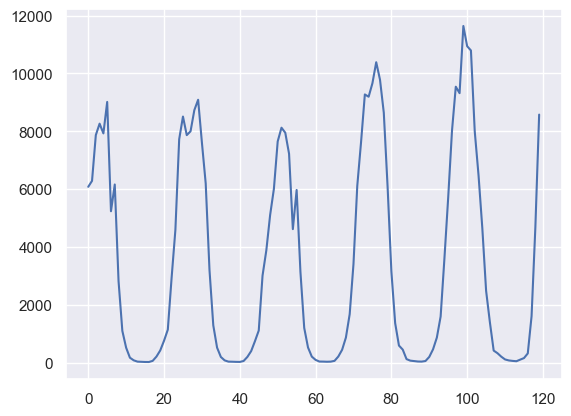

In [218]:
forecast = examplatory_forecast_model.predict(X_forecast)

forecast = pd.Series(forecast.flatten())

forecast = [int(round(item, 0)) for item in forecast]


df_merge2["forecast"] = forecast

plt.plot(forecast)


Text(0.5, 1.0, 'This is the forecast for the next five days')

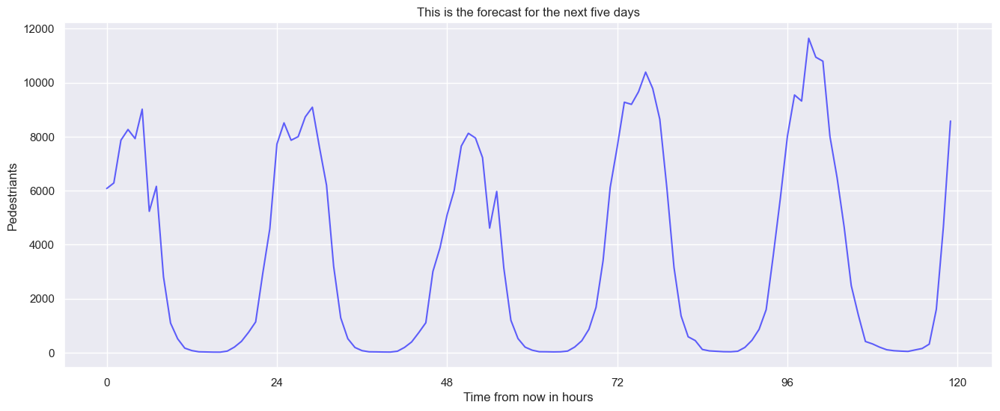

In [338]:

import matplotlib.dates as mdates


# Create a figure and axis, specify the figure size
fig, axs = plt.subplots(1, 1, figsize=(16, 6))
# Add the scatter plot ONLY for the setosa flowers
axs.plot(df_merge2["forecast"],
          color="blue", alpha=0.6)

# Add the x- and y-axes labels
axs.set_xlabel("Time from now in hours")
axs.set_ylabel("Pedestriants")


import matplotlib.ticker as mticker

myLocator = mticker.MultipleLocator(24)
axs.xaxis.set_major_locator(myLocator)



# Add a title to our plot
axs.set_title("This is the forecast for the next five days")

